In [1]:
import tensorflow as tf
import pandas as pd
import re
import numpy as np
import matplotlib.pylab as plt
from sklearn.preprocessing import MinMaxScaler

In [2]:
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Input, Dense,LSTM, Embedding
from tensorflow.python.keras.optimizers import RMSprop
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard, ReduceLROnPlateau

In [3]:
path = open('/home/avinash/Winter Project/TrichyWeatherDataWindspeed/2016/csv/20162.csv')
df = pd.read_csv(path, sep=',', header=0  , index_col=False , na_values = '---' )

In [4]:
df.head(1)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.
0,01-23-2016,05:01,77.9,77.9,77.9,77,70.1,1.8,WSW,0.11,...,50,67.9,93.5,9.05,1.1316,0.0,24,1,100.0,1


In [5]:
def _date_string(x):
#Convert two integers to a string for the date and time.

    date = x[0]
    date = re.sub('-' , '' , date)
    print(date)
    time = x[1]
    time = re.sub(':' , '' , time)
    print(time)

    return "{0}{1}".format(date , time)

In [6]:
datestr = df[['Date', 'Time']].apply(_date_string, axis=1)
df['DateTime'] = pd.to_datetime(datestr, format='%m%d%Y%H%M')

01232016
0501
01232016
0502
01232016
0503
01232016
0504
01232016
0505
01232016
0506
01232016
0507
01232016
0508
01232016
0509
01232016
0510
01232016
0511
01232016
0512
01232016
0513
01232016
0514
01232016
0515
01232016
0516
01232016
0517
01232016
0518
01232016
0519
01232016
0520
01232016
0521
01232016
0522
01232016
0523
01232016
0524
01232016
0525
01232016
0526
01232016
0527
01232016
0528
01232016
0529
01232016
0530
01232016
0531
01232016
0532
01232016
0533
01232016
0534
01232016
0535
01232016
0536
01232016
0537
01232016
0538
01232016
0539
01232016
0540
01232016
0541
01232016
0542
01232016
0543
01232016
0544
01232016
0545
01232016
0546
01232016
0547
01232016
0548
01232016
0549
01232016
0550
01232016
0551
01232016
0552
01232016
0553
01232016
0554
01232016
0555
01232016
0556
01232016
0557
01232016
0558
01232016
0559
01232016
0600
01232016
0601
01232016
0602
01232016
0603
01232016
0604
01232016
0605
01232016
0606
01232016
0607
01232016
0608
01232016
0609
01232016
0610
01232016
0611
012320

01252016
0237
01252016
0238
01252016
0239
01252016
0240
01252016
0241
01252016
0242
01252016
0243
01252016
0244
01252016
0245
01252016
0246
01252016
0247
01252016
0248
01252016
0249
01252016
0250
01252016
0251
01252016
0252
01252016
0253
01252016
0254
01252016
0255
01252016
0256
01252016
0257
01252016
0258
01252016
0259
01252016
0300
01252016
0301
01252016
0302
01252016
0303
01252016
0304
01252016
0305
01252016
0306
01252016
0307
01252016
0308
01252016
0309
01252016
0310
01252016
0311
01252016
0312
01252016
0313
01252016
0314
01252016
0315
01252016
0316
01252016
0317
01252016
0318
01252016
0319
01252016
0320
01252016
0321
01252016
0322
01252016
0323
01252016
0324
01252016
0325
01252016
0326
01252016
0327
01252016
0328
01252016
0329
01252016
0330
01252016
0331
01252016
0332
01252016
0333
01252016
0334
01252016
0335
01252016
0336
01252016
0337
01252016
0338
01252016
0339
01252016
0340
01252016
0341
01252016
0342
01252016
0343
01252016
0344
01252016
0345
01252016
0346
01252016
0347
012520

01262016
1607
01262016
1608
01262016
1609
01262016
1610
01262016
1611
01262016
1612
01262016
1613
01262016
1614
01262016
1615
01262016
1616
01262016
1617
01262016
1618
01262016
1619
01262016
1620
01262016
1621
01262016
1622
01262016
1623
01262016
1624
01262016
1625
01262016
1626
01262016
1627
01262016
1628
01262016
1629
01262016
1630
01262016
1631
01262016
1632
01262016
1633
01262016
1634
01262016
1635
01262016
1636
01262016
1637
01262016
1638
01262016
1639
01262016
1640
01262016
1641
01262016
1642
01262016
1643
01262016
1644
01262016
1645
01262016
1646
01262016
1647
01262016
1648
01262016
1649
01262016
1650
01262016
1651
01262016
1652
01262016
1653
01262016
1654
01262016
1655
01262016
1656
01262016
1657
01262016
1658
01262016
1659
01262016
1700
01262016
1701
01262016
1702
01262016
1703
01262016
1704
01262016
1705
01262016
1706
01262016
1707
01262016
1708
01262016
1709
01262016
1710
01262016
1711
01262016
1712
01262016
1713
01262016
1714
01262016
1715
01262016
1716
01262016
1717
012620

1356
01282016
1357
01282016
1358
01282016
1359
01282016
1400
01282016
1401
01282016
1402
01282016
1403
01282016
1404
01282016
1405
01282016
1406
01282016
1407
01282016
1408
01282016
1409
01282016
1410
01282016
1411
01282016
1412
01282016
1413
01282016
1414
01282016
1415
01282016
1416
01282016
1417
01282016
1418
01282016
1419
01282016
1420
01282016
1421
01282016
1422
01282016
1423
01282016
1424
01282016
1425
01282016
1426
01282016
1427
01282016
1428
01282016
1429
01282016
1430
01282016
1431
01282016
1432
01282016
1433
01282016
1434
01282016
1435
01282016
1436
01282016
1437
01282016
1438
01282016
1439
01282016
1440
01282016
1441
01282016
1442
01282016
1443
01282016
1444
01282016
1445
01282016
1446
01282016
1447
01282016
1448
01282016
1449
01282016
1450
01282016
1451
01282016
1452
01282016
1453
01282016
1454
01282016
1455
01282016
1456
01282016
1457
01282016
1458
01282016
1459
01282016
1500
01282016
1501
01282016
1502
01282016
1503
01282016
1504
01282016
1505
01282016
1506
01282016
1507
0

0736
01302016
0737
01302016
0738
01302016
0739
01302016
0740
01302016
0741
01302016
0742
01302016
0743
01302016
0744
01302016
0745
01302016
0746
01302016
0747
01302016
0748
01302016
0749
01302016
0750
01302016
0751
01302016
0752
01302016
0753
01302016
0754
01302016
0755
01302016
0756
01302016
0757
01302016
0758
01302016
0759
01302016
0800
01302016
0801
01302016
0802
01302016
0803
01302016
0804
01302016
0805
01302016
0806
01302016
0807
01302016
0808
01302016
0809
01302016
0810
01302016
0811
01302016
0812
01302016
0813
01302016
0814
01302016
0815
01302016
0816
01302016
0817
01302016
0818
01302016
0819
01302016
0820
01302016
0821
01302016
0822
01302016
0823
01302016
0824
01302016
0825
01302016
0826
01302016
0827
01302016
0828
01302016
0829
01302016
0830
01302016
0831
01302016
0832
01302016
0833
01302016
0834
01302016
0835
01302016
0836
01302016
0837
01302016
0838
01302016
0839
01302016
0840
01302016
0841
01302016
0842
01302016
0843
01302016
0844
01302016
0845
01302016
0846
01302016
0847
0

2020
01312016
2021
01312016
2022
01312016
2023
01312016
2024
01312016
2025
01312016
2026
01312016
2027
01312016
2028
01312016
2029
01312016
2030
01312016
2031
01312016
2032
01312016
2033
01312016
2034
01312016
2035
01312016
2036
01312016
2037
01312016
2038
01312016
2039
01312016
2040
01312016
2041
01312016
2042
01312016
2043
01312016
2044
01312016
2045
01312016
2046
01312016
2047
01312016
2048
01312016
2049
01312016
2050
01312016
2051
01312016
2052
01312016
2053
01312016
2054
01312016
2055
01312016
2056
01312016
2057
01312016
2058
01312016
2059
01312016
2100
01312016
2101
01312016
2102
01312016
2103
01312016
2104
01312016
2105
01312016
2106
01312016
2107
01312016
2108
01312016
2109
01312016
2110
01312016
2111
01312016
2112
01312016
2113
01312016
2114
01312016
2115
01312016
2116
01312016
2117
01312016
2118
01312016
2119
01312016
2120
01312016
2121
01312016
2122
01312016
2123
01312016
2124
01312016
2125
01312016
2126
01312016
2127
01312016
2128
01312016
2129
01312016
2130
01312016
2131
0

02022016
1036
02022016
1037
02022016
1038
02022016
1039
02022016
1040
02022016
1041
02022016
1042
02022016
1043
02022016
1044
02022016
1045
02022016
1046
02022016
1047
02022016
1048
02022016
1049
02022016
1050
02022016
1051
02022016
1052
02022016
1053
02022016
1054
02022016
1055
02022016
1056
02022016
1057
02022016
1058
02022016
1059
02022016
1100
02022016
1101
02022016
1102
02022016
1103
02022016
1104
02022016
1105
02022016
1106
02022016
1107
02022016
1108
02022016
1109
02022016
1110
02022016
1111
02022016
1112
02022016
1113
02022016
1114
02022016
1115
02022016
1116
02022016
1117
02022016
1118
02022016
1119
02022016
1120
02022016
1121
02022016
1122
02022016
1123
02022016
1124
02022016
1125
02022016
1126
02022016
1127
02022016
1128
02022016
1129
02022016
1130
02022016
1131
02022016
1132
02022016
1133
02022016
1134
02022016
1135
02022016
1136
02022016
1137
02022016
1138
02022016
1139
02022016
1140
02022016
1141
02022016
1142
02022016
1143
02022016
1144
02022016
1145
02022016
1146
020220

02042016
0651
02042016
0652
02042016
0653
02042016
0654
02042016
0655
02042016
0656
02042016
0657
02042016
0658
02042016
0659
02042016
0700
02042016
0701
02042016
0702
02042016
0703
02042016
0704
02042016
0705
02042016
0706
02042016
0707
02042016
0708
02042016
0709
02042016
0710
02042016
0711
02042016
0712
02042016
0713
02042016
0714
02042016
0715
02042016
0716
02042016
0717
02042016
0718
02042016
0719
02042016
0720
02042016
0721
02042016
0722
02042016
0723
02042016
0724
02042016
0725
02042016
0726
02042016
0727
02042016
0728
02042016
0729
02042016
0730
02042016
0731
02042016
0732
02042016
0733
02042016
0734
02042016
0735
02042016
0736
02042016
0737
02042016
0738
02042016
0739
02042016
0740
02042016
0741
02042016
0742
02042016
0743
02042016
0744
02042016
0745
02042016
0746
02042016
0747
02042016
0748
02042016
0749
02042016
0750
02042016
0751
02042016
0752
02042016
0753
02042016
0754
02042016
0755
02042016
0756
02042016
0757
02042016
0758
02042016
0759
02042016
0800
02042016
0801
020420

2155
02052016
2156
02052016
2157
02052016
2158
02052016
2159
02052016
2200
02052016
2201
02052016
2202
02052016
2203
02052016
2204
02052016
2205
02052016
2206
02052016
2207
02052016
2208
02052016
2209
02052016
2210
02052016
2211
02052016
2212
02052016
2213
02052016
2214
02052016
2215
02052016
2216
02052016
2217
02052016
2218
02052016
2219
02052016
2220
02052016
2221
02052016
2222
02052016
2223
02052016
2224
02052016
2225
02052016
2226
02052016
2227
02052016
2228
02052016
2229
02052016
2230
02052016
2231
02052016
2232
02052016
2233
02052016
2234
02052016
2235
02052016
2236
02052016
2237
02052016
2238
02052016
2239
02052016
2240
02052016
2241
02052016
2242
02052016
2243
02052016
2244
02052016
2245
02052016
2246
02052016
2247
02052016
2248
02052016
2249
02052016
2250
02052016
2251
02052016
2252
02052016
2253
02052016
2254
02052016
2255
02052016
2256
02052016
2257
02052016
2258
02052016
2259
02052016
2300
02052016
2301
02052016
2302
02052016
2303
02052016
2304
02052016
2305
02052016
2306
0

02072016
0614
02072016
0615
02072016
0616
02072016
0617
02072016
0618
02072016
0619
02072016
0620
02072016
0621
02072016
0622
02072016
0623
02072016
0624
02072016
0625
02072016
0626
02072016
0627
02072016
0628
02072016
0629
02072016
0630
02072016
0631
02072016
0632
02072016
0633
02072016
0634
02072016
0635
02072016
0636
02072016
0637
02072016
0638
02072016
0639
02072016
0640
02072016
0641
02072016
0642
02072016
0643
02072016
0644
02072016
0645
02072016
0646
02072016
0647
02072016
0648
02072016
0649
02072016
0650
02072016
0651
02072016
0652
02072016
0653
02072016
0654
02072016
0655
02072016
0656
02072016
0657
02072016
0658
02072016
0659
02072016
0700
02072016
0701
02072016
0702
02072016
0703
02072016
0704
02072016
0705
02072016
0706
02072016
0707
02072016
0708
02072016
0709
02072016
0710
02072016
0711
02072016
0712
02072016
0713
02072016
0714
02072016
0715
02072016
0716
02072016
0717
02072016
0718
02072016
0719
02072016
0720
02072016
0721
02072016
0722
02072016
0723
02072016
0724
020720

02082016
2045
02082016
2046
02082016
2047
02082016
2048
02082016
2049
02082016
2050
02082016
2051
02082016
2052
02082016
2053
02082016
2054
02082016
2055
02082016
2056
02082016
2057
02082016
2058
02082016
2059
02082016
2100
02082016
2101
02082016
2102
02082016
2103
02082016
2104
02082016
2105
02082016
2106
02082016
2107
02082016
2108
02082016
2109
02082016
2110
02082016
2111
02082016
2112
02082016
2113
02082016
2114
02082016
2115
02082016
2116
02082016
2117
02082016
2118
02082016
2119
02082016
2120
02082016
2121
02082016
2122
02082016
2123
02082016
2124
02082016
2125
02082016
2126
02082016
2127
02082016
2128
02082016
2129
02082016
2130
02082016
2131
02082016
2132
02082016
2133
02082016
2134
02082016
2135
02082016
2136
02082016
2137
02082016
2138
02082016
2139
02082016
2140
02082016
2141
02082016
2142
02082016
2143
02082016
2144
02082016
2145
02082016
2146
02082016
2147
02082016
2148
02082016
2149
02082016
2150
02082016
2151
02082016
2152
02082016
2153
02082016
2154
02082016
2155
020820

1424
02102016
1425
02102016
1426
02102016
1427
02102016
1428
02102016
1429
02102016
1430
02102016
1431
02102016
1432
02102016
1433
02102016
1434
02102016
1435
02102016
1436
02102016
1437
02102016
1438
02102016
1439
02102016
1440
02102016
1441
02102016
1442
02102016
1443
02102016
1444
02102016
1445
02102016
1446
02102016
1447
02102016
1448
02102016
1449
02102016
1450
02102016
1451
02102016
1452
02102016
1453
02102016
1454
02102016
1455
02102016
1456
02102016
1457
02102016
1458
02102016
1459
02102016
1500
02102016
1501
02102016
1502
02102016
1503
02102016
1504
02102016
1505
02102016
1506
02102016
1507
02102016
1508
02102016
1509
02102016
1510
02102016
1511
02102016
1512
02102016
1513
02102016
1514
02102016
1515
02102016
1516
02102016
1517
02102016
1518
02102016
1519
02102016
1520
02102016
1521
02102016
1522
02102016
1523
02102016
1524
02102016
1525
02102016
1526
02102016
1527
02102016
1528
02102016
1529
02102016
1530
02102016
1531
02102016
1532
02102016
1533
02102016
1534
02102016
1535
0

02122016
0805
02122016
0806
02122016
0807
02122016
0808
02122016
0809
02122016
0810
02122016
0811
02122016
0812
02122016
0813
02122016
0814
02122016
0815
02122016
0816
02122016
0817
02122016
0818
02122016
0819
02122016
0820
02122016
0821
02122016
0822
02122016
0823
02122016
0824
02122016
0825
02122016
0826
02122016
0827
02122016
0828
02122016
0829
02122016
0830
02122016
0831
02122016
0832
02122016
0833
02122016
0834
02122016
0835
02122016
0836
02122016
0837
02122016
0838
02122016
0839
02122016
0840
02122016
0841
02122016
0842
02122016
0843
02122016
0844
02122016
0845
02122016
0846
02122016
0847
02122016
0848
02122016
0849
02122016
0850
02122016
0851
02122016
0852
02122016
0853
02122016
0854
02122016
0855
02122016
0856
02122016
0857
02122016
0858
02122016
0859
02122016
0900
02122016
0901
02122016
0902
02122016
0903
02122016
0904
02122016
0905
02122016
0906
02122016
0907
02122016
0908
02122016
0909
02122016
0910
02122016
0911
02122016
0912
02122016
0913
02122016
0914
02122016
0915
021220

02142016
0554
02142016
0555
02142016
0556
02142016
0557
02142016
0558
02142016
0559
02142016
0600
02142016
0601
02142016
0602
02142016
0603
02142016
0604
02142016
0605
02142016
0606
02142016
0607
02142016
0608
02142016
0609
02142016
0610
02142016
0611
02142016
0612
02142016
0613
02142016
0614
02142016
0615
02142016
0616
02142016
0617
02142016
0618
02142016
0619
02142016
0620
02142016
0621
02142016
0622
02142016
0623
02142016
0624
02142016
0625
02142016
0626
02142016
0627
02142016
0628
02142016
0629
02142016
0630
02142016
0631
02142016
0632
02142016
0633
02142016
0634
02142016
0635
02142016
0636
02142016
0637
02142016
0638
02142016
0639
02142016
0640
02142016
0641
02142016
0642
02142016
0643
02142016
0644
02142016
0645
02142016
0646
02142016
0647
02142016
0648
02142016
0649
02142016
0650
02142016
0651
02142016
0652
02142016
0653
02142016
0654
02142016
0655
02142016
0656
02142016
0657
02142016
0658
02142016
0659
02142016
0700
02142016
0701
02142016
0702
02142016
0703
02142016
0704
021420

0827
02152016
0828
02152016
0829
02152016
0830
02152016
0831
02152016
0832
02152016
0833
02152016
0834
02152016
0835
02152016
0836
02152016
0837
02152016
0838
02152016
0839
02152016
0840
02152016
0841
02152016
0842
02152016
0843
02152016
0844
02152016
0845
02152016
0846
02152016
0847
02152016
0848
02152016
0849
02152016
0850
02152016
0851
02152016
0852
02152016
0853
02152016
0854
02152016
0855
02152016
0856
02152016
0857
02152016
0858
02152016
0859
02152016
0900
02152016
0901
02152016
0902
02152016
0903
02152016
0904
02152016
0905
02152016
0906
02152016
0907
02152016
0908
02152016
0909
02152016
0910
02152016
0911
02152016
0912
02152016
0913
02152016
0914
02152016
0915
02152016
0916
02152016
0917
02152016
0918
02152016
0919
02152016
0920
02152016
0921
02152016
0922
02152016
0923
02152016
0924
02152016
0925
02152016
0926
02152016
0927
02152016
0928
02152016
0929
02152016
0930
02152016
0931
02152016
0932
02152016
0933
02152016
0934
02152016
0935
02152016
0936
02152016
0937
02152016
0938
0

0443
02172016
0444
02172016
0445
02172016
0446
02172016
0447
02172016
0448
02172016
0449
02172016
0450
02172016
0451
02172016
0452
02172016
0453
02172016
0454
02172016
0455
02172016
0456
02172016
0457
02172016
0458
02172016
0459
02172016
0500
02172016
0501
02172016
0502
02172016
0503
02172016
0504
02172016
0505
02172016
0506
02172016
0507
02172016
0508
02172016
0509
02172016
0510
02172016
0511
02172016
0512
02172016
0513
02172016
0514
02172016
0515
02172016
0516
02172016
0517
02172016
0518
02172016
0519
02172016
0520
02172016
0521
02172016
0522
02172016
0523
02172016
0524
02172016
0525
02172016
0526
02172016
0527
02172016
0528
02172016
0529
02172016
0530
02172016
0531
02172016
0532
02172016
0533
02172016
0534
02172016
0535
02172016
0536
02172016
0537
02172016
0538
02172016
0539
02172016
0540
02172016
0541
02172016
0542
02172016
0543
02172016
0544
02172016
0545
02172016
0546
02172016
0547
02172016
0548
02172016
0549
02172016
0550
02172016
0551
02172016
0552
02172016
0553
02172016
0554
0

0233
02192016
0234
02192016
0235
02192016
0236
02192016
0237
02192016
0238
02192016
0239
02192016
0240
02192016
0241
02192016
0242
02192016
0243
02192016
0244
02192016
0245
02192016
0246
02192016
0247
02192016
0248
02192016
0249
02192016
0250
02192016
0251
02192016
0252
02192016
0253
02192016
0254
02192016
0255
02192016
0256
02192016
0257
02192016
0258
02192016
0259
02192016
0300
02192016
0301
02192016
0302
02192016
0303
02192016
0304
02192016
0305
02192016
0306
02192016
0307
02192016
0308
02192016
0309
02192016
0310
02192016
0311
02192016
0312
02192016
0313
02192016
0314
02192016
0315
02192016
0316
02192016
0317
02192016
0318
02192016
0319
02192016
0320
02192016
0321
02192016
0322
02192016
0323
02192016
0324
02192016
0325
02192016
0326
02192016
0327
02192016
0328
02192016
0329
02192016
0330
02192016
0331
02192016
0332
02192016
0333
02192016
0334
02192016
0335
02192016
0336
02192016
0337
02192016
0338
02192016
0339
02192016
0340
02192016
0341
02192016
0342
02192016
0343
02192016
0344
0

02202016
2013
02202016
2014
02202016
2015
02202016
2016
02202016
2017
02202016
2018
02202016
2019
02202016
2020
02202016
2021
02202016
2022
02202016
2023
02202016
2024
02202016
2025
02202016
2026
02202016
2027
02202016
2028
02202016
2029
02202016
2030
02202016
2031
02202016
2032
02202016
2033
02202016
2034
02202016
2035
02202016
2036
02202016
2037
02202016
2038
02202016
2039
02202016
2040
02202016
2041
02202016
2042
02202016
2043
02202016
2044
02202016
2045
02202016
2046
02202016
2047
02202016
2048
02202016
2049
02202016
2050
02202016
2051
02202016
2052
02202016
2053
02202016
2054
02202016
2055
02202016
2056
02202016
2057
02202016
2058
02202016
2059
02202016
2100
02202016
2101
02202016
2102
02202016
2103
02202016
2104
02202016
2105
02202016
2106
02202016
2107
02202016
2108
02202016
2109
02202016
2110
02202016
2111
02202016
2112
02202016
2113
02202016
2114
02202016
2115
02202016
2116
02202016
2117
02202016
2118
02202016
2119
02202016
2120
02202016
2121
02202016
2122
02202016
2123
022020

02222016
1353
02222016
1354
02222016
1355
02222016
1356
02222016
1357
02222016
1358
02222016
1359
02222016
1400
02222016
1401
02222016
1402
02222016
1403
02222016
1404
02222016
1405
02222016
1406
02222016
1407
02222016
1408
02222016
1409
02222016
1410
02222016
1411
02222016
1412
02222016
1413
02222016
1414
02222016
1415
02222016
1416
02222016
1417
02222016
1418
02222016
1419
02222016
1420
02222016
1421
02222016
1422
02222016
1423
02222016
1424
02222016
1425
02222016
1426
02222016
1427
02222016
1428
02222016
1429
02222016
1430
02222016
1431
02222016
1432
02222016
1433
02222016
1434
02222016
1435
02222016
1436
02222016
1437
02222016
1438
02222016
1439
02222016
1440
02222016
1441
02222016
1442
02222016
1443
02222016
1444
02222016
1445
02222016
1446
02222016
1447
02222016
1448
02222016
1449
02222016
1450
02222016
1451
02222016
1452
02222016
1453
02222016
1454
02222016
1455
02222016
1456
02222016
1457
02222016
1458
02222016
1459
02222016
1500
02222016
1501
02222016
1502
02222016
1503
022220

0732
02242016
0733
02242016
0734
02242016
0735
02242016
0736
02242016
0737
02242016
0738
02242016
0739
02242016
0740
02242016
0741
02242016
0742
02242016
0743
02242016
0744
02242016
0745
02242016
0746
02242016
0747
02242016
0748
02242016
0749
02242016
0750
02242016
0751
02242016
0752
02242016
0753
02242016
0754
02242016
0755
02242016
0756
02242016
0757
02242016
0758
02242016
0759
02242016
0800
02242016
0801
02242016
0802
02242016
0803
02242016
0804
02242016
0805
02242016
0806
02242016
0807
02242016
0808
02242016
0809
02242016
0810
02242016
0811
02242016
0812
02242016
0813
02242016
0814
02242016
0815
02242016
0816
02242016
0817
02242016
0818
02242016
0819
02242016
0820
02242016
0821
02242016
0822
02242016
0823
02242016
0824
02242016
0825
02242016
0826
02242016
0827
02242016
0828
02242016
0829
02242016
0830
02242016
0831
02242016
0832
02242016
0833
02242016
0834
02242016
0835
02242016
0836
02242016
0837
02242016
0838
02242016
0839
02242016
0840
02242016
0841
02242016
0842
02242016
0843
0

02252016
2341
02252016
2342
02252016
2343
02252016
2344
02252016
2345
02252016
2346
02252016
2347
02252016
2348
02252016
2349
02252016
2350
02252016
2351
02252016
2352
02252016
2353
02252016
2354
02252016
2355
02252016
2356
02252016
2357
02252016
2358
02252016
2359
02262016
0000
02262016
0001
02262016
0002
02262016
0003
02262016
0004
02262016
0005
02262016
0006
02262016
0007
02262016
0008
02262016
0009
02262016
0010
02262016
0011
02262016
0012
02262016
0013
02262016
0014
02262016
0015
02262016
0016
02262016
0017
02262016
0018
02262016
0019
02262016
0020
02262016
0021
02262016
0022
02262016
0023
02262016
0024
02262016
0025
02262016
0026
02262016
0027
02262016
0028
02262016
0029
02262016
0030
02262016
0031
02262016
0032
02262016
0033
02262016
0034
02262016
0035
02262016
0036
02262016
0037
02262016
0038
02262016
0039
02262016
0040
02262016
0041
02262016
0042
02262016
0043
02262016
0044
02262016
0045
02262016
0046
02262016
0047
02262016
0048
02262016
0049
02262016
0050
02262016
0051
022620

02272016
1442
02272016
1443
02272016
1444
02272016
1445
02272016
1446
02272016
1447
02272016
1448
02272016
1449
02272016
1450
02272016
1451
02272016
1452
02272016
1453
02272016
1454
02272016
1455
02272016
1456
02272016
1457
02272016
1458
02272016
1459
02272016
1500
02272016
1501
02272016
1502
02272016
1503
02272016
1504
02272016
1505
02272016
1506
02272016
1507
02272016
1508
02272016
1509
02272016
1510
02272016
1511
02272016
1512
02272016
1513
02272016
1514
02272016
1515
02272016
1516
02272016
1517
02272016
1518
02272016
1519
02272016
1520
02272016
1521
02272016
1522
02272016
1523
02272016
1524
02272016
1525
02272016
1526
02272016
1527
02272016
1528
02272016
1529
02272016
1530
02272016
1531
02272016
1532
02272016
1533
02272016
1534
02272016
1535
02272016
1536
02272016
1537
02272016
1538
02272016
1539
02272016
1540
02272016
1541
02272016
1542
02272016
1543
02272016
1544
02272016
1545
02272016
1546
02272016
1547
02272016
1548
02272016
1549
02272016
1550
02272016
1551
02272016
1552
022720

02292016
0822
02292016
0823
02292016
0824
02292016
0825
02292016
0826
02292016
0827
02292016
0828
02292016
0829
02292016
0830
02292016
0831
02292016
0832
02292016
0833
02292016
0834
02292016
0835
02292016
0836
02292016
0837
02292016
0838
02292016
0839
02292016
0840
02292016
0841
02292016
0842
02292016
0843
02292016
0844
02292016
0845
02292016
0846
02292016
0847
02292016
0848
02292016
0849
02292016
0850
02292016
0851
02292016
0852
02292016
0853
02292016
0854
02292016
0855
02292016
0856
02292016
0857
02292016
0858
02292016
0859
02292016
0900
02292016
0901
02292016
0902
02292016
0903
02292016
0904
02292016
0905
02292016
0906
02292016
0907
02292016
0908
02292016
0909
02292016
0910
02292016
0911
02292016
0912
02292016
0913
02292016
0914
02292016
0915
02292016
0916
02292016
0917
02292016
0918
02292016
0919
02292016
0920
02292016
0921
02292016
0922
02292016
0923
02292016
0924
02292016
0925
02292016
0926
02292016
0927
02292016
0928
02292016
0929
02292016
0930
02292016
0931
02292016
0932
022920

0201
03022016
0202
03022016
0203
03022016
0204
03022016
0205
03022016
0206
03022016
0207
03022016
0208
03022016
0209
03022016
0210
03022016
0211
03022016
0212
03022016
0213
03022016
0214
03022016
0215
03022016
0216
03022016
0217
03022016
0218
03022016
0219
03022016
0220
03022016
0221
03022016
0222
03022016
0223
03022016
0224
03022016
0225
03022016
0226
03022016
0227
03022016
0228
03022016
0229
03022016
0230
03022016
0231
03022016
0232
03022016
0233
03022016
0234
03022016
0235
03022016
0236
03022016
0237
03022016
0238
03022016
0239
03022016
0240
03022016
0241
03022016
0242
03022016
0243
03022016
0244
03022016
0245
03022016
0246
03022016
0247
03022016
0248
03022016
0249
03022016
0250
03022016
0251
03022016
0252
03022016
0253
03022016
0254
03022016
0255
03022016
0256
03022016
0257
03022016
0258
03022016
0259
03022016
0300
03022016
0301
03022016
0302
03022016
0303
03022016
0304
03022016
0305
03022016
0306
03022016
0307
03022016
0308
03022016
0309
03022016
0310
03022016
0311
03022016
0312
0

2130
03032016
2131
03032016
2132
03032016
2133
03032016
2134
03032016
2135
03032016
2136
03032016
2137
03032016
2138
03032016
2139
03032016
2140
03032016
2141
03032016
2142
03032016
2143
03032016
2144
03032016
2145
03032016
2146
03032016
2147
03032016
2148
03032016
2149
03032016
2150
03032016
2151
03032016
2152
03032016
2153
03032016
2154
03032016
2155
03032016
2156
03032016
2157
03032016
2158
03032016
2159
03032016
2200
03032016
2201
03032016
2202
03032016
2203
03032016
2204
03032016
2205
03032016
2206
03032016
2207
03032016
2208
03032016
2209
03032016
2210
03032016
2211
03032016
2212
03032016
2213
03032016
2214
03032016
2215
03032016
2216
03032016
2217
03032016
2218
03032016
2219
03032016
2220
03032016
2221
03032016
2222
03032016
2223
03032016
2224
03032016
2225
03032016
2226
03032016
2227
03032016
2228
03032016
2229
03032016
2230
03032016
2231
03032016
2232
03032016
2233
03032016
2234
03032016
2235
03032016
2236
03032016
2237
03032016
2238
03032016
2239
03032016
2240
03032016
2241
0

03052016
1321
03052016
1322
03052016
1323
03052016
1324
03052016
1325
03052016
1326
03052016
1327
03052016
1328
03052016
1329
03052016
1330
03052016
1331
03052016
1332
03052016
1333
03052016
1334
03052016
1335
03052016
1336
03052016
1337
03052016
1338
03052016
1339
03052016
1340
03052016
1341
03052016
1342
03052016
1343
03052016
1344
03052016
1345
03052016
1346
03052016
1347
03052016
1348
03052016
1349
03052016
1350
03052016
1351
03052016
1352
03052016
1353
03052016
1354
03052016
1355
03052016
1356
03052016
1357
03052016
1358
03052016
1359
03052016
1400
03052016
1401
03052016
1402
03052016
1403
03052016
1404
03052016
1405
03052016
1406
03052016
1407
03052016
1408
03052016
1409
03052016
1410
03052016
1411
03052016
1412
03052016
1413
03052016
1414
03052016
1415
03052016
1416
03052016
1417
03052016
1418
03052016
1419
03052016
1420
03052016
1421
03052016
1422
03052016
1423
03052016
1424
03052016
1425
03052016
1426
03052016
1427
03052016
1428
03052016
1429
03052016
1430
03052016
1431
030520

03072016
0234
03072016
0235
03072016
0236
03072016
0237
03072016
0238
03072016
0239
03072016
0240
03072016
0241
03072016
0242
03072016
0243
03072016
0244
03072016
0245
03072016
0246
03072016
0247
03072016
0248
03072016
0249
03072016
0250
03072016
0251
03072016
0252
03072016
0253
03072016
0254
03072016
0255
03072016
0256
03072016
0257
03072016
0258
03072016
0259
03072016
0300
03072016
0301
03072016
0302
03072016
0303
03072016
0304
03072016
0305
03072016
0306
03072016
0307
03072016
0308
03072016
0309
03072016
0310
03072016
0311
03072016
0312
03072016
0313
03072016
0314
03072016
0315
03072016
0316
03072016
0317
03072016
0318
03072016
0319
03072016
0320
03072016
0321
03072016
0322
03072016
0323
03072016
0324
03072016
0325
03072016
0326
03072016
0327
03072016
0328
03072016
0329
03072016
0330
03072016
0331
03072016
0332
03072016
0333
03072016
0334
03072016
0335
03072016
0336
03072016
0337
03072016
0338
03072016
0339
03072016
0340
03072016
0341
03072016
0342
03072016
0343
03072016
0344
030720

1620
03082016
1621
03082016
1622
03082016
1623
03082016
1624
03082016
1625
03082016
1626
03082016
1627
03082016
1628
03082016
1629
03082016
1630
03082016
1631
03082016
1632
03082016
1633
03082016
1634
03082016
1635
03082016
1636
03082016
1637
03082016
1638
03082016
1639
03082016
1640
03082016
1641
03082016
1642
03082016
1643
03082016
1644
03082016
1645
03082016
1646
03082016
1647
03082016
1648
03082016
1649
03082016
1650
03082016
1651
03082016
1652
03082016
1653
03082016
1654
03082016
1655
03082016
1656
03082016
1657
03082016
1658
03082016
1659
03082016
1700
03082016
1701
03082016
1702
03082016
1703
03082016
1704
03082016
1705
03082016
1706
03082016
1707
03082016
1708
03082016
1709
03082016
1710
03082016
1711
03082016
1712
03082016
1713
03082016
1714
03082016
1715
03082016
1716
03082016
1717
03082016
1718
03082016
1719
03082016
1720
03082016
1721
03082016
1722
03082016
1723
03082016
1724
03082016
1725
03082016
1726
03082016
1727
03082016
1728
03082016
1729
03082016
1730
03082016
1731
0

1410
03102016
1411
03102016
1412
03102016
1413
03102016
1414
03102016
1415
03102016
1416
03102016
1417
03102016
1418
03102016
1419
03102016
1420
03102016
1421
03102016
1422
03102016
1423
03102016
1424
03102016
1425
03102016
1426
03102016
1427
03102016
1428
03102016
1429
03102016
1430
03102016
1431
03102016
1432
03102016
1433
03102016
1434
03102016
1435
03102016
1436
03102016
1437
03102016
1438
03102016
1439
03102016
1440
03102016
1441
03102016
1442
03102016
1443
03102016
1444
03102016
1445
03102016
1446
03102016
1447
03102016
1448
03102016
1449
03102016
1450
03102016
1451
03102016
1452
03102016
1453
03102016
1454
03102016
1455
03102016
1456
03102016
1457
03102016
1458
03102016
1459
03102016
1500
03102016
1501
03102016
1502
03102016
1503
03102016
1504
03102016
1505
03102016
1506
03102016
1507
03102016
1508
03102016
1509
03102016
1510
03102016
1511
03102016
1512
03102016
1513
03102016
1514
03102016
1515
03102016
1516
03102016
1517
03102016
1518
03102016
1519
03102016
1520
03102016
1521
0

03122016
1200
03122016
1201
03122016
1202
03122016
1203
03122016
1204
03122016
1205
03122016
1206
03122016
1207
03122016
1208
03122016
1209
03122016
1210
03122016
1211
03122016
1212
03122016
1213
03122016
1214
03122016
1215
03122016
1216
03122016
1217
03122016
1218
03122016
1219
03122016
1220
03122016
1221
03122016
1222
03122016
1223
03122016
1224
03122016
1225
03122016
1226
03122016
1227
03122016
1228
03122016
1229
03122016
1230
03122016
1231
03122016
1232
03122016
1233
03122016
1234
03122016
1235
03122016
1236
03122016
1237
03122016
1238
03122016
1239
03122016
1240
03122016
1241
03122016
1242
03122016
1243
03122016
1244
03122016
1245
03122016
1246
03122016
1247
03122016
1248
03122016
1249
03122016
1250
03122016
1251
03122016
1252
03122016
1253
03122016
1254
03122016
1255
03122016
1256
03122016
1257
03122016
1258
03122016
1259
03122016
1300
03122016
1301
03122016
1302
03122016
1303
03122016
1304
03122016
1305
03122016
1306
03122016
1307
03122016
1308
03122016
1309
03122016
1310
031220

03142016
0540
03142016
0541
03142016
0542
03142016
0543
03142016
0544
03142016
0545
03142016
0546
03142016
0547
03142016
0548
03142016
0549
03142016
0550
03142016
0551
03142016
0552
03142016
0553
03142016
0554
03142016
0555
03142016
0556
03142016
0557
03142016
0558
03142016
0559
03142016
0600
03142016
0601
03142016
0602
03142016
0603
03142016
0604
03142016
0605
03142016
0606
03142016
0607
03142016
0608
03142016
0609
03142016
0610
03142016
0611
03142016
0612
03142016
0613
03142016
0614
03142016
0615
03142016
0616
03142016
0617
03142016
0618
03142016
0619
03142016
0620
03142016
0621
03142016
0622
03142016
0623
03142016
0624
03142016
0625
03142016
0626
03142016
0627
03142016
0628
03142016
0629
03142016
0630
03142016
0631
03142016
0632
03142016
0633
03142016
0634
03142016
0635
03142016
0636
03142016
0637
03142016
0638
03142016
0639
03142016
0640
03142016
0641
03142016
0642
03142016
0643
03142016
0644
03142016
0645
03142016
0646
03142016
0647
03142016
0648
03142016
0649
03142016
0650
031420

03152016
1953
03152016
1954
03152016
1955
03152016
1956
03152016
1957
03152016
1958
03152016
1959
03152016
2000
03152016
2001
03152016
2002
03152016
2003
03152016
2004
03152016
2005
03152016
2006
03152016
2007
03152016
2008
03152016
2009
03152016
2010
03152016
2011
03152016
2012
03152016
2013
03152016
2014
03152016
2015
03152016
2016
03152016
2017
03152016
2018
03152016
2019
03152016
2020
03152016
2021
03152016
2022
03152016
2023
03152016
2024
03152016
2025
03152016
2026
03152016
2027
03152016
2028
03152016
2029
03152016
2030
03152016
2031
03152016
2032
03152016
2033
03152016
2034
03152016
2035
03152016
2036
03152016
2037
03152016
2038
03152016
2039
03152016
2040
03152016
2041
03152016
2042
03152016
2043
03152016
2044
03152016
2045
03152016
2046
03152016
2047
03152016
2048
03152016
2049
03152016
2050
03152016
2051
03152016
2052
03152016
2053
03152016
2054
03152016
2055
03152016
2056
03152016
2057
03152016
2058
03152016
2059
03152016
2100
03152016
2101
03152016
2102
03152016
2103
031520

0140
03172016
0141
03172016
0142
03172016
0143
03172016
0144
03172016
0145
03172016
0146
03172016
0147
03172016
0148
03172016
0149
03172016
0150
03172016
0151
03172016
0152
03172016
0153
03172016
0154
03172016
0155
03172016
0156
03172016
0157
03172016
0158
03172016
0159
03172016
0200
03172016
0201
03172016
0202
03172016
0203
03172016
0204
03172016
0205
03172016
0206
03172016
0207
03172016
0208
03172016
0209
03172016
0210
03172016
0211
03172016
0212
03172016
0213
03172016
0214
03172016
0215
03172016
0216
03172016
0217
03172016
0218
03172016
0219
03172016
0220
03172016
0221
03172016
0222
03172016
0223
03172016
0224
03172016
0225
03172016
0226
03172016
0227
03172016
0228
03172016
0229
03172016
0230
03172016
0231
03172016
0232
03172016
0233
03172016
0234
03172016
0235
03172016
0236
03172016
0237
03172016
0238
03172016
0239
03172016
0240
03172016
0241
03172016
0242
03172016
0243
03172016
0244
03172016
0245
03172016
0246
03172016
0247
03172016
0248
03172016
0249
03172016
0250
03172016
0251
0

03192016
0219
03192016
0220
03192016
0221
03192016
0222
03192016
0223
03192016
0224
03192016
0225
03192016
0226
03192016
0227
03192016
0228
03192016
0229
03192016
0230
03192016
0231
03192016
0232
03192016
0233
03192016
0234
03192016
0235
03192016
0236
03192016
0237
03192016
0238
03192016
0239
03192016
0240
03192016
0241
03192016
0242
03192016
0243
03192016
0244
03192016
0245
03192016
0246
03192016
0247
03192016
0248
03192016
0249
03192016
0250
03192016
0251
03192016
0252
03192016
0253
03192016
0254
03192016
0255
03192016
0256
03192016
0257
03192016
0258
03192016
0259
03192016
0300
03192016
0301
03192016
0302
03192016
0303
03192016
0304
03192016
0305
03192016
0306
03192016
0307
03192016
0308
03192016
0309
03192016
0310
03192016
0311
03192016
0312
03192016
0313
03192016
0314
03192016
0315
03192016
0316
03192016
0317
03192016
0318
03192016
0319
03192016
0320
03192016
0321
03192016
0322
03192016
0323
03192016
0324
03192016
0325
03192016
0326
03192016
0327
03192016
0328
03192016
0329
031920

03202016
1549
03202016
1550
03202016
1551
03202016
1552
03202016
1553
03202016
1554
03202016
1555
03202016
1556
03202016
1557
03202016
1558
03202016
1559
03202016
1600
03202016
1601
03202016
1602
03202016
1603
03202016
1604
03202016
1605
03202016
1606
03202016
1607
03202016
1608
03202016
1609
03202016
1610
03202016
1611
03202016
1612
03202016
1613
03202016
1614
03202016
1615
03202016
1616
03202016
1617
03202016
1618
03202016
1619
03202016
1620
03202016
1621
03202016
1622
03202016
1623
03202016
1624
03202016
1625
03202016
1626
03202016
1627
03202016
1628
03202016
1629
03202016
1630
03202016
1631
03202016
1632
03202016
1633
03202016
1634
03202016
1635
03202016
1636
03202016
1637
03202016
1638
03202016
1639
03202016
1640
03202016
1641
03202016
1642
03202016
1643
03202016
1644
03202016
1645
03202016
1646
03202016
1647
03202016
1648
03202016
1649
03202016
1650
03202016
1651
03202016
1652
03202016
1653
03202016
1654
03202016
1655
03202016
1656
03202016
1657
03202016
1658
03202016
1659
032020

0518
03222016
0519
03222016
0520
03222016
0521
03222016
0522
03222016
0523
03222016
0524
03222016
0525
03222016
0526
03222016
0527
03222016
0528
03222016
0529
03222016
0530
03222016
0531
03222016
0532
03222016
0533
03222016
0534
03222016
0535
03222016
0536
03222016
0537
03222016
0538
03222016
0539
03222016
0540
03222016
0541
03222016
0542
03222016
0543
03222016
0544
03222016
0545
03222016
0546
03222016
0547
03222016
0548
03222016
0549
03222016
0550
03222016
0551
03222016
0552
03222016
0553
03222016
0554
03222016
0555
03222016
0556
03222016
0557
03222016
0558
03222016
0559
03222016
0600
03222016
0601
03222016
0602
03222016
0603
03222016
0604
03222016
0605
03222016
0606
03222016
0607
03222016
0608
03222016
0609
03222016
0610
03222016
0611
03222016
0612
03222016
0613
03222016
0614
03222016
0615
03222016
0616
03222016
0617
03222016
0618
03222016
0619
03222016
0620
03222016
0621
03222016
0622
03222016
0623
03222016
0624
03222016
0625
03222016
0626
03222016
0627
03222016
0628
03222016
0629
0

2258
03232016
2259
03232016
2300
03232016
2301
03232016
2302
03232016
2303
03232016
2304
03232016
2305
03232016
2306
03232016
2307
03232016
2308
03232016
2309
03232016
2310
03232016
2311
03232016
2312
03232016
2313
03232016
2314
03232016
2315
03232016
2316
03232016
2317
03232016
2318
03232016
2319
03232016
2320
03232016
2321
03232016
2322
03232016
2323
03232016
2324
03232016
2325
03232016
2326
03232016
2327
03232016
2328
03232016
2329
03232016
2330
03232016
2331
03232016
2332
03232016
2333
03232016
2334
03232016
2335
03232016
2336
03232016
2337
03232016
2338
03232016
2339
03232016
2340
03232016
2341
03232016
2342
03232016
2343
03232016
2344
03232016
2345
03232016
2346
03232016
2347
03232016
2348
03232016
2349
03232016
2350
03232016
2351
03232016
2352
03232016
2353
03232016
2354
03232016
2355
03232016
2356
03232016
2357
03232016
2358
03232016
2359
03242016
0000
03242016
0001
03242016
0002
03242016
0003
03242016
0004
03242016
0005
03242016
0006
03242016
0007
03242016
0008
03242016
0009
0

1415
03252016
1416
03252016
1417
03252016
1418
03252016
1419
03252016
1420
03252016
1421
03252016
1422
03252016
1423
03252016
1424
03252016
1425
03252016
1426
03252016
1427
03252016
1428
03252016
1429
03252016
1430
03252016
1431
03252016
1432
03252016
1433
03252016
1434
03252016
1435
03252016
1436
03252016
1437
03252016
1438
03252016
1439
03252016
1440
03252016
1441
03252016
1442
03252016
1443
03252016
1444
03252016
1445
03252016
1446
03252016
1447
03252016
1448
03252016
1449
03252016
1450
03252016
1451
03252016
1452
03252016
1453
03252016
1454
03252016
1455
03252016
1456
03252016
1457
03252016
1458
03252016
1459
03252016
1500
03252016
1501
03252016
1502
03252016
1503
03252016
1504
03252016
1505
03252016
1506
03252016
1507
03252016
1508
03252016
1509
03252016
1510
03252016
1511
03252016
1512
03252016
1513
03252016
1514
03252016
1515
03252016
1516
03252016
1517
03252016
1518
03252016
1519
03252016
1520
03252016
1521
03252016
1522
03252016
1523
03252016
1524
03252016
1525
03252016
1526
0

0021
03272016
0022
03272016
0023
03272016
0024
03272016
0025
03272016
0026
03272016
0027
03272016
0028
03272016
0029
03272016
0030
03272016
0031
03272016
0032
03272016
0033
03272016
0034
03272016
0035
03272016
0036
03272016
0037
03272016
0038
03272016
0039
03272016
0040
03272016
0041
03272016
0042
03272016
0043
03272016
0044
03272016
0045
03272016
0046
03272016
0047
03272016
0048
03272016
0049
03272016
0050
03272016
0051
03272016
0052
03272016
0053
03272016
0054
03272016
0055
03272016
0056
03272016
0057
03272016
0058
03272016
0059
03272016
0100
03272016
0101
03272016
0102
03272016
0103
03272016
0104
03272016
0105
03272016
0106
03272016
0107
03272016
0108
03272016
0109
03272016
0110
03272016
0111
03272016
0112
03272016
0113
03272016
0114
03272016
0115
03272016
0116
03272016
0117
03272016
0118
03272016
0119
03272016
0120
03272016
0121
03272016
0122
03272016
0123
03272016
0124
03272016
0125
03272016
0126
03272016
0127
03272016
0128
03272016
0129
03272016
0130
03272016
0131
03272016
0132
0

03282016
1504
03282016
1505
03282016
1506
03282016
1507
03282016
1508
03282016
1509
03282016
1510
03282016
1511
03282016
1512
03282016
1513
03282016
1514
03282016
1515
03282016
1516
03282016
1517
03282016
1518
03282016
1519
03282016
1520
03282016
1521
03282016
1522
03282016
1523
03282016
1524
03282016
1525
03282016
1526
03282016
1527
03282016
1528
03282016
1529
03282016
1530
03282016
1531
03282016
1532
03282016
1533
03282016
1534
03282016
1535
03282016
1536
03282016
1537
03282016
1538
03282016
1539
03282016
1540
03282016
1541
03282016
1542
03282016
1543
03282016
1544
03282016
1545
03282016
1546
03282016
1547
03282016
1548
03282016
1549
03282016
1550
03282016
1551
03282016
1552
03282016
1553
03282016
1554
03282016
1555
03282016
1556
03282016
1557
03282016
1558
03282016
1559
03282016
1600
03282016
1601
03282016
1602
03282016
1603
03282016
1604
03282016
1605
03282016
1606
03282016
1607
03282016
1608
03282016
1609
03282016
1610
03282016
1611
03282016
1612
03282016
1613
03282016
1614
032820

1007
03302016
1008
03302016
1009
03302016
1010
03302016
1011
03302016
1012
03302016
1013
03302016
1014
03302016
1015
03302016
1016
03302016
1017
03302016
1018
03302016
1019
03302016
1020
03302016
1021
03302016
1022
03302016
1023
03302016
1024
03302016
1025
03302016
1026
03302016
1027
03302016
1028
03302016
1029
03302016
1030
03302016
1031
03302016
1032
03302016
1033
03302016
1034
03302016
1035
03302016
1036
03302016
1037
03302016
1038
03302016
1039
03302016
1040
03302016
1041
03302016
1042
03302016
1043
03302016
1044
03302016
1045
03302016
1046
03302016
1047
03302016
1048
03302016
1049
03302016
1050
03302016
1051
03302016
1052
03302016
1053
03302016
1054
03302016
1055
03302016
1056
03302016
1057
03302016
1058
03302016
1059
03302016
1100
03302016
1101
03302016
1102
03302016
1103
03302016
1104
03302016
1105
03302016
1106
03302016
1107
03302016
1108
03302016
1109
03302016
1110
03302016
1111
03302016
1112
03302016
1113
03302016
1114
03302016
1115
03302016
1116
03302016
1117
03302016
1118
0

04012016
0110
04012016
0111
04012016
0112
04012016
0113
04012016
0114
04012016
0115
04012016
0116
04012016
0117
04012016
0118
04012016
0119
04012016
0120
04012016
0121
04012016
0122
04012016
0123
04012016
0124
04012016
0125
04012016
0126
04012016
0127
04012016
0128
04012016
0129
04012016
0130
04012016
0131
04012016
0132
04012016
0133
04012016
0134
04012016
0135
04012016
0136
04012016
0137
04012016
0138
04012016
0139
04012016
0140
04012016
0141
04012016
0142
04012016
0143
04012016
0144
04012016
0145
04012016
0146
04012016
0147
04012016
0148
04012016
0149
04012016
0150
04012016
0151
04012016
0152
04012016
0153
04012016
0154
04012016
0155
04012016
0156
04012016
0157
04012016
0158
04012016
0159
04012016
0200
04012016
0201
04012016
0202
04012016
0203
04012016
0204
04012016
0205
04012016
0206
04012016
0207
04012016
0208
04012016
0209
04012016
0210
04012016
0211
04012016
0212
04012016
0213
04012016
0214
04012016
0215
04012016
0216
04012016
0217
04012016
0218
04012016
0219
04012016
0220
040120

04022016
1717
04022016
1718
04022016
1719
04022016
1720
04022016
1721
04022016
1722
04022016
1723
04022016
1724
04022016
1725
04022016
1726
04022016
1727
04022016
1728
04022016
1729
04022016
1730
04022016
1731
04022016
1732
04022016
1733
04022016
1734
04022016
1735
04022016
1736
04022016
1737
04022016
1738
04022016
1739
04022016
1740
04022016
1741
04022016
1742
04022016
1743
04022016
1744
04022016
1745
04022016
1746
04022016
1747
04022016
1748
04022016
1749
04022016
1750
04022016
1751
04022016
1752
04022016
1753
04022016
1754
04022016
1755
04022016
1756
04022016
1757
04022016
1758
04022016
1759
04022016
1800
04022016
1801
04022016
1802
04022016
1803
04022016
1804
04022016
1805
04022016
1806
04022016
1807
04022016
1808
04022016
1809
04022016
1810
04022016
1811
04022016
1812
04022016
1813
04022016
1814
04022016
1815
04022016
1816
04022016
1817
04022016
1818
04022016
1819
04022016
1820
04022016
1821
04022016
1822
04022016
1823
04022016
1824
04022016
1825
04022016
1826
04022016
1827
040220

1056
04042016
1057
04042016
1058
04042016
1059
04042016
1100
04042016
1101
04042016
1102
04042016
1103
04042016
1104
04042016
1105
04042016
1106
04042016
1107
04042016
1108
04042016
1109
04042016
1110
04042016
1111
04042016
1112
04042016
1113
04042016
1114
04042016
1115
04042016
1116
04042016
1117
04042016
1118
04042016
1119
04042016
1120
04042016
1121
04042016
1122
04042016
1123
04042016
1124
04042016
1125
04042016
1126
04042016
1127
04042016
1128
04042016
1129
04042016
1130
04042016
1131
04042016
1132
04042016
1133
04042016
1134
04042016
1135
04042016
1136
04042016
1137
04042016
1138
04042016
1139
04042016
1140
04042016
1141
04042016
1142
04042016
1143
04042016
1144
04042016
1145
04042016
1146
04042016
1147
04042016
1148
04042016
1149
04042016
1150
04042016
1151
04042016
1152
04042016
1153
04042016
1154
04042016
1155
04042016
1156
04042016
1157
04042016
1158
04042016
1159
04042016
1200
04042016
1201
04042016
1202
04042016
1203
04042016
1204
04042016
1205
04042016
1206
04042016
1207
0

0436
04062016
0437
04062016
0438
04062016
0439
04062016
0440
04062016
0441
04062016
0442
04062016
0443
04062016
0444
04062016
0445
04062016
0446
04062016
0447
04062016
0448
04062016
0449
04062016
0450
04062016
0451
04062016
0452
04062016
0453
04062016
0454
04062016
0455
04062016
0456
04062016
0457
04062016
0458
04062016
0459
04062016
0500
04062016
0501
04062016
0502
04062016
0503
04062016
0504
04062016
0505
04062016
0506
04062016
0507
04062016
0508
04062016
0509
04062016
0510
04062016
0511
04062016
0512
04062016
0513
04062016
0514
04062016
0515
04062016
0516
04062016
0517
04062016
0518
04062016
0519
04062016
0520
04062016
0521
04062016
0522
04062016
0523
04062016
0524
04062016
0525
04062016
0526
04062016
0527
04062016
0528
04062016
0529
04062016
0530
04062016
0531
04062016
0532
04062016
0533
04062016
0534
04062016
0535
04062016
0536
04062016
0537
04062016
0538
04062016
0539
04062016
0540
04062016
0541
04062016
0542
04062016
0543
04062016
0544
04062016
0545
04062016
0546
04062016
0547
0

2103
04072016
2104
04072016
2105
04072016
2106
04072016
2107
04072016
2108
04072016
2109
04072016
2110
04072016
2111
04072016
2112
04072016
2113
04072016
2114
04072016
2115
04072016
2116
04072016
2117
04072016
2118
04072016
2119
04072016
2120
04072016
2121
04072016
2122
04072016
2123
04072016
2124
04072016
2125
04072016
2126
04072016
2127
04072016
2128
04072016
2129
04072016
2130
04072016
2131
04072016
2132
04072016
2133
04072016
2134
04072016
2135
04072016
2136
04072016
2137
04072016
2138
04072016
2139
04072016
2140
04072016
2141
04072016
2142
04072016
2143
04072016
2144
04072016
2145
04072016
2146
04072016
2147
04072016
2148
04072016
2149
04072016
2150
04072016
2151
04072016
2152
04072016
2153
04072016
2154
04072016
2155
04072016
2156
04072016
2157
04072016
2158
04072016
2159
04072016
2200
04072016
2201
04072016
2202
04072016
2203
04072016
2204
04072016
2205
04072016
2206
04072016
2207
04072016
2208
04072016
2209
04072016
2210
04072016
2211
04072016
2212
04072016
2213
04072016
2214
0

04092016
1132
04092016
1133
04092016
1134
04092016
1135
04092016
1136
04092016
1137
04092016
1138
04092016
1139
04092016
1140
04092016
1141
04092016
1142
04092016
1143
04092016
1144
04092016
1145
04092016
1146
04092016
1147
04092016
1148
04092016
1149
04092016
1150
04092016
1151
04092016
1152
04092016
1153
04092016
1154
04092016
1155
04092016
1156
04092016
1157
04092016
1158
04092016
1159
04092016
1200
04092016
1201
04092016
1202
04092016
1203
04092016
1204
04092016
1205
04092016
1206
04092016
1207
04092016
1208
04092016
1209
04092016
1210
04092016
1211
04092016
1212
04092016
1213
04092016
1214
04092016
1215
04092016
1216
04092016
1217
04092016
1218
04092016
1219
04092016
1220
04092016
1221
04092016
1222
04092016
1223
04092016
1224
04092016
1225
04092016
1226
04092016
1227
04092016
1228
04092016
1229
04092016
1230
04092016
1231
04092016
1232
04092016
1233
04092016
1234
04092016
1235
04092016
1236
04092016
1237
04092016
1238
04092016
1239
04092016
1240
04092016
1241
04092016
1242
040920

04102016
1909
04102016
1910
04102016
1911
04102016
1912
04102016
1913
04102016
1914
04102016
1915
04102016
1916
04102016
1917
04102016
1918
04102016
1919
04102016
1920
04102016
1921
04102016
1922
04102016
1923
04102016
1924
04102016
1925
04102016
1926
04102016
1927
04102016
1928
04102016
1929
04102016
1930
04102016
1931
04102016
1932
04102016
1933
04102016
1934
04102016
1935
04102016
1936
04102016
1937
04102016
1938
04102016
1939
04102016
1940
04102016
1941
04102016
1942
04102016
1943
04102016
1944
04102016
1945
04102016
1946
04102016
1947
04102016
1948
04102016
1949
04102016
1950
04102016
1951
04102016
1952
04102016
1953
04102016
1954
04102016
1955
04102016
1956
04102016
1957
04102016
1958
04102016
1959
04102016
2000
04102016
2001
04102016
2002
04102016
2003
04102016
2004
04102016
2005
04102016
2006
04102016
2007
04102016
2008
04102016
2009
04102016
2010
04102016
2011
04102016
2012
04102016
2013
04102016
2014
04102016
2015
04102016
2016
04102016
2017
04102016
2018
04102016
2019
041020

1035
04122016
1036
04122016
1037
04122016
1038
04122016
1039
04122016
1040
04122016
1041
04122016
1042
04122016
1043
04122016
1044
04122016
1045
04122016
1046
04122016
1047
04122016
1048
04122016
1049
04122016
1050
04122016
1051
04122016
1052
04122016
1053
04122016
1054
04122016
1055
04122016
1056
04122016
1057
04122016
1058
04122016
1059
04122016
1100
04122016
1101
04122016
1102
04122016
1103
04122016
1104
04122016
1105
04122016
1106
04122016
1107
04122016
1108
04122016
1109
04122016
1110
04122016
1111
04122016
1112
04122016
1113
04122016
1114
04122016
1115
04122016
1116
04122016
1117
04122016
1118
04122016
1119
04122016
1120
04122016
1121
04122016
1122
04122016
1123
04122016
1124
04122016
1125
04122016
1126
04122016
1127
04122016
1128
04122016
1129
04122016
1130
04122016
1131
04122016
1132
04122016
1133
04122016
1134
04122016
1135
04122016
1136
04122016
1137
04122016
1138
04122016
1139
04122016
1140
04122016
1141
04122016
1142
04122016
1143
04122016
1144
04122016
1145
04122016
1146
0

04142016
0338
04142016
0339
04142016
0340
04142016
0341
04142016
0342
04142016
0343
04142016
0344
04142016
0345
04142016
0346
04142016
0347
04142016
0348
04142016
0349
04142016
0350
04142016
0351
04142016
0352
04142016
0353
04142016
0354
04142016
0355
04142016
0356
04142016
0357
04142016
0358
04142016
0359
04142016
0400
04142016
0401
04142016
0402
04142016
0403
04142016
0404
04142016
0405
04142016
0406
04142016
0407
04142016
0408
04142016
0409
04142016
0410
04142016
0411
04142016
0412
04142016
0413
04142016
0414
04142016
0415
04142016
0416
04142016
0417
04142016
0418
04142016
0419
04142016
0420
04142016
0421
04142016
0422
04142016
0423
04142016
0424
04142016
0425
04142016
0426
04142016
0427
04142016
0428
04142016
0429
04142016
0430
04142016
0431
04142016
0432
04142016
0433
04142016
0434
04142016
0435
04142016
0436
04142016
0437
04142016
0438
04142016
0439
04142016
0440
04142016
0441
04142016
0442
04142016
0443
04142016
0444
04142016
0445
04142016
0446
04142016
0447
04142016
0448
041420

04152016
1745
04152016
1746
04152016
1747
04152016
1748
04152016
1749
04152016
1750
04152016
1751
04152016
1752
04152016
1753
04152016
1754
04152016
1755
04152016
1756
04152016
1757
04152016
1758
04152016
1759
04152016
1800
04152016
1801
04152016
1802
04152016
1803
04152016
1804
04152016
1805
04152016
1806
04152016
1807
04152016
1808
04152016
1809
04152016
1810
04152016
1811
04152016
1812
04152016
1813
04152016
1814
04152016
1815
04152016
1816
04152016
1817
04152016
1818
04152016
1819
04152016
1820
04152016
1821
04152016
1822
04152016
1823
04152016
1824
04152016
1825
04152016
1826
04152016
1827
04152016
1828
04152016
1829
04152016
1830
04152016
1831
04152016
1832
04152016
1833
04152016
1834
04152016
1835
04152016
1836
04152016
1837
04152016
1838
04152016
1839
04152016
1840
04152016
1841
04152016
1842
04152016
1843
04152016
1844
04152016
1845
04152016
1846
04152016
1847
04152016
1848
04152016
1849
04152016
1850
04152016
1851
04152016
1852
04152016
1853
04152016
1854
04152016
1855
041520

0714
04172016
0715
04172016
0716
04172016
0717
04172016
0718
04172016
0719
04172016
0720
04172016
0721
04172016
0722
04172016
0723
04172016
0724
04172016
0725
04172016
0726
04172016
0727
04172016
0728
04172016
0729
04172016
0730
04172016
0731
04172016
0732
04172016
0733
04172016
0734
04172016
0735
04172016
0736
04172016
0737
04172016
0738
04172016
0739
04172016
0740
04172016
0741
04172016
0742
04172016
0743
04172016
0744
04172016
0745
04172016
0746
04172016
0747
04172016
0748
04172016
0749
04172016
0750
04172016
0751
04172016
0752
04172016
0753
04172016
0754
04172016
0755
04172016
0756
04172016
0757
04172016
0758
04172016
0759
04172016
0800
04172016
0801
04172016
0802
04172016
0803
04172016
0804
04172016
0805
04172016
0806
04172016
0807
04172016
0808
04172016
0809
04172016
0810
04172016
0811
04172016
0812
04172016
0813
04172016
0814
04172016
0815
04172016
0816
04172016
0817
04172016
0818
04172016
0819
04172016
0820
04172016
0821
04172016
0822
04172016
0823
04172016
0824
04172016
0825
0

0054
04192016
0055
04192016
0056
04192016
0057
04192016
0058
04192016
0059
04192016
0100
04192016
0101
04192016
0102
04192016
0103
04192016
0104
04192016
0105
04192016
0106
04192016
0107
04192016
0108
04192016
0109
04192016
0110
04192016
0111
04192016
0112
04192016
0113
04192016
0114
04192016
0115
04192016
0116
04192016
0117
04192016
0118
04192016
0119
04192016
0120
04192016
0121
04192016
0122
04192016
0123
04192016
0124
04192016
0125
04192016
0126
04192016
0127
04192016
0128
04192016
0129
04192016
0130
04192016
0131
04192016
0132
04192016
0133
04192016
0134
04192016
0135
04192016
0136
04192016
0137
04192016
0138
04192016
0139
04192016
0140
04192016
0141
04192016
0142
04192016
0143
04192016
0144
04192016
0145
04192016
0146
04192016
0147
04192016
0148
04192016
0149
04192016
0150
04192016
0151
04192016
0152
04192016
0153
04192016
0154
04192016
0155
04192016
0156
04192016
0157
04192016
0158
04192016
0159
04192016
0200
04192016
0201
04192016
0202
04192016
0203
04192016
0204
04192016
0205
0

04202016
1834
04202016
1835
04202016
1836
04202016
1837
04202016
1838
04202016
1839
04202016
1840
04202016
1841
04202016
1842
04202016
1843
04202016
1844
04202016
1845
04202016
1846
04202016
1847
04202016
1848
04202016
1849
04202016
1850
04202016
1851
04202016
1852
04202016
1853
04202016
1854
04202016
1855
04202016
1856
04202016
1857
04202016
1858
04202016
1859
04202016
1900
04202016
1901
04202016
1902
04202016
1903
04202016
1904
04202016
1905
04202016
1906
04202016
1907
04202016
1908
04202016
1909
04202016
1910
04202016
1911
04202016
1912
04202016
1913
04202016
1914
04202016
1915
04202016
1916
04202016
1917
04202016
1918
04202016
1919
04202016
1920
04202016
1921
04202016
1922
04202016
1923
04202016
1924
04202016
1925
04202016
1926
04202016
1927
04202016
1928
04202016
1929
04202016
1930
04202016
1931
04202016
1932
04202016
1933
04202016
1934
04202016
1935
04202016
1936
04202016
1937
04202016
1938
04202016
1939
04202016
1940
04202016
1941
04202016
1942
04202016
1943
04202016
1944
042020

04222016
0354
04222016
0355
04222016
0356
04222016
0357
04222016
0358
04222016
0359
04222016
0400
04222016
0401
04222016
0402
04222016
0403
04222016
0404
04222016
0405
04222016
0406
04222016
0407
04222016
0408
04222016
0409
04222016
0410
04222016
0411
04222016
0412
04222016
0413
04222016
0414
04222016
0415
04222016
0416
04222016
0417
04222016
0418
04222016
0419
04222016
0420
04222016
0421
04222016
0422
04222016
0423
04222016
0424
04222016
0425
04222016
0426
04222016
0427
04222016
0428
04222016
0429
04222016
0430
04222016
0431
04222016
0432
04222016
0433
04222016
0434
04222016
0435
04222016
0436
04222016
0437
04222016
0438
04222016
0439
04222016
0440
04222016
0441
04222016
0442
04222016
0443
04222016
0444
04222016
0445
04222016
0446
04222016
0447
04222016
0448
04222016
0449
04222016
0450
04222016
0451
04222016
0452
04222016
0453
04222016
0454
04222016
0455
04222016
0456
04222016
0457
04222016
0458
04222016
0459
04222016
0500
04222016
0501
04222016
0502
04222016
0503
04222016
0504
042220

0143
04242016
0144
04242016
0145
04242016
0146
04242016
0147
04242016
0148
04242016
0149
04242016
0150
04242016
0151
04242016
0152
04242016
0153
04242016
0154
04242016
0155
04242016
0156
04242016
0157
04242016
0158
04242016
0159
04242016
0200
04242016
0201
04242016
0202
04242016
0203
04242016
0204
04242016
0205
04242016
0206
04242016
0207
04242016
0208
04242016
0209
04242016
0210
04242016
0211
04242016
0212
04242016
0213
04242016
0214
04242016
0215
04242016
0216
04242016
0217
04242016
0218
04242016
0219
04242016
0220
04242016
0221
04242016
0222
04242016
0223
04242016
0224
04242016
0225
04242016
0226
04242016
0227
04242016
0228
04242016
0229
04242016
0230
04242016
0231
04242016
0232
04242016
0233
04242016
0234
04242016
0235
04242016
0236
04242016
0237
04242016
0238
04242016
0239
04242016
0240
04242016
0241
04242016
0242
04242016
0243
04242016
0244
04242016
0245
04242016
0246
04242016
0247
04242016
0248
04242016
0249
04242016
0250
04242016
0251
04242016
0252
04242016
0253
04242016
0254
0

1923
04252016
1924
04252016
1925
04252016
1926
04252016
1927
04252016
1928
04252016
1929
04252016
1930
04252016
1931
04252016
1932
04252016
1933
04252016
1934
04252016
1935
04252016
1936
04252016
1937
04252016
1938
04252016
1939
04252016
1940
04252016
1941
04252016
1942
04252016
1943
04252016
1944
04252016
1945
04252016
1946
04252016
1947
04252016
1948
04252016
1949
04252016
1950
04252016
1951
04252016
1952
04252016
1953
04252016
1954
04252016
1955
04252016
1956
04252016
1957
04252016
1958
04252016
1959
04252016
2000
04252016
2001
04252016
2002
04252016
2003
04252016
2004
04252016
2005
04252016
2006
04252016
2007
04252016
2008
04252016
2009
04252016
2010
04252016
2011
04252016
2012
04252016
2013
04252016
2014
04252016
2015
04252016
2016
04252016
2017
04252016
2018
04252016
2019
04252016
2020
04252016
2021
04252016
2022
04252016
2023
04252016
2024
04252016
2025
04252016
2026
04252016
2027
04252016
2028
04252016
2029
04252016
2030
04252016
2031
04252016
2032
04252016
2033
04252016
2034
0

04272016
1303
04272016
1304
04272016
1305
04272016
1306
04272016
1307
04272016
1308
04272016
1309
04272016
1310
04272016
1311
04272016
1312
04272016
1313
04272016
1314
04272016
1315
04272016
1316
04272016
1317
04272016
1318
04272016
1319
04272016
1320
04272016
1321
04272016
1322
04272016
1323
04272016
1324
04272016
1325
04272016
1326
04272016
1327
04272016
1328
04272016
1329
04272016
1330
04272016
1331
04272016
1332
04272016
1333
04272016
1334
04272016
1335
04272016
1336
04272016
1337
04272016
1338
04272016
1339
04272016
1340
04272016
1341
04272016
1342
04272016
1343
04272016
1344
04272016
1345
04272016
1346
04272016
1347
04272016
1348
04272016
1349
04272016
1350
04272016
1351
04272016
1352
04272016
1353
04272016
1354
04272016
1355
04272016
1356
04272016
1357
04272016
1358
04272016
1359
04272016
1400
04272016
1401
04272016
1402
04272016
1403
04272016
1404
04272016
1405
04272016
1406
04272016
1407
04272016
1408
04272016
1409
04272016
1410
04272016
1411
04272016
1412
04272016
1413
042720

04292016
1053
04292016
1054
04292016
1055
04292016
1056
04292016
1057
04292016
1058
04292016
1059
04292016
1100
04292016
1101
04292016
1102
04292016
1103
04292016
1104
04292016
1105
04292016
1106
04292016
1107
04292016
1108
04292016
1109
04292016
1110
04292016
1111
04292016
1112
04292016
1113
04292016
1114
04292016
1115
04292016
1116
04292016
1117
04292016
1118
04292016
1119
04292016
1120
04292016
1121
04292016
1122
04292016
1123
04292016
1124
04292016
1125
04292016
1126
04292016
1127
04292016
1128
04292016
1129
04292016
1130
04292016
1131
04292016
1132
04292016
1133
04292016
1134
04292016
1135
04292016
1136
04292016
1137
04292016
1138
04292016
1139
04292016
1140
04292016
1141
04292016
1142
04292016
1143
04292016
1144
04292016
1145
04292016
1146
04292016
1147
04292016
1148
04292016
1149
04292016
1150
04292016
1151
04292016
1152
04292016
1153
04292016
1154
04292016
1155
04292016
1156
04292016
1157
04292016
1158
04292016
1159
04292016
1200
04292016
1201
04292016
1202
04292016
1203
042920

0432
05012016
0433
05012016
0434
05012016
0435
05012016
0436
05012016
0437
05012016
0438
05012016
0439
05012016
0440
05012016
0441
05012016
0442
05012016
0443
05012016
0444
05012016
0445
05012016
0446
05012016
0447
05012016
0448
05012016
0449
05012016
0450
05012016
0451
05012016
0452
05012016
0453
05012016
0454
05012016
0455
05012016
0456
05012016
0457
05012016
0458
05012016
0459
05012016
0500
05012016
0501
05012016
0502
05012016
0503
05012016
0504
05012016
0505
05012016
0506
05012016
0507
05012016
0508
05012016
0509
05012016
0510
05012016
0511
05012016
0512
05012016
0513
05012016
0514
05012016
0515
05012016
0516
05012016
0517
05012016
0518
05012016
0519
05012016
0520
05012016
0521
05012016
0522
05012016
0523
05012016
0524
05012016
0525
05012016
0526
05012016
0527
05012016
0528
05012016
0529
05012016
0530
05012016
0531
05012016
0532
05012016
0533
05012016
0534
05012016
0535
05012016
0536
05012016
0537
05012016
0538
05012016
0539
05012016
0540
05012016
0541
05012016
0542
05012016
0543
0

1109
05022016
1110
05022016
1111
05022016
1112
05022016
1113
05022016
1114
05022016
1115
05022016
1116
05022016
1117
05022016
1118
05022016
1119
05022016
1120
05022016
1121
05022016
1122
05022016
1123
05022016
1124
05022016
1125
05022016
1126
05022016
1127
05022016
1128
05022016
1129
05022016
1130
05022016
1131
05022016
1132
05022016
1133
05022016
1134
05022016
1135
05022016
1136
05022016
1137
05022016
1138
05022016
1139
05022016
1140
05022016
1141
05022016
1142
05022016
1143
05022016
1144
05022016
1145
05022016
1146
05022016
1147
05022016
1148
05022016
1149
05022016
1150
05022016
1151
05022016
1152
05022016
1153
05022016
1154
05022016
1155
05022016
1156
05022016
1157
05022016
1158
05022016
1159
05022016
1200
05022016
1201
05022016
1202
05022016
1203
05022016
1204
05022016
1205
05022016
1206
05022016
1207
05022016
1208
05022016
1209
05022016
1210
05022016
1211
05022016
1212
05022016
1213
05022016
1214
05022016
1215
05022016
1216
05022016
1217
05022016
1218
05022016
1219
05022016
1220
0

05042016
0322
05042016
0323
05042016
0324
05042016
0325
05042016
0326
05042016
0327
05042016
0328
05042016
0329
05042016
0330
05042016
0331
05042016
0332
05042016
0333
05042016
0334
05042016
0335
05042016
0336
05042016
0337
05042016
0338
05042016
0339
05042016
0340
05042016
0341
05042016
0342
05042016
0343
05042016
0344
05042016
0345
05042016
0346
05042016
0347
05042016
0348
05042016
0349
05042016
0350
05042016
0351
05042016
0352
05042016
0353
05042016
0354
05042016
0355
05042016
0356
05042016
0357
05042016
0358
05042016
0359
05042016
0400
05042016
0401
05042016
0402
05042016
0403
05042016
0404
05042016
0405
05042016
0406
05042016
0407
05042016
0408
05042016
0409
05042016
0410
05042016
0411
05042016
0412
05042016
0413
05042016
0414
05042016
0415
05042016
0416
05042016
0417
05042016
0418
05042016
0419
05042016
0420
05042016
0421
05042016
0422
05042016
0423
05042016
0424
05042016
0425
05042016
0426
05042016
0427
05042016
0428
05042016
0429
05042016
0430
05042016
0431
05042016
0432
050420

05052016
2102
05052016
2103
05052016
2104
05052016
2105
05052016
2106
05052016
2107
05052016
2108
05052016
2109
05052016
2110
05052016
2111
05052016
2112
05052016
2113
05052016
2114
05052016
2115
05052016
2116
05052016
2117
05052016
2118
05052016
2119
05052016
2120
05052016
2121
05052016
2122
05052016
2123
05052016
2124
05052016
2125
05052016
2126
05052016
2127
05052016
2128
05052016
2129
05052016
2130
05052016
2131
05052016
2132
05052016
2133
05052016
2134
05052016
2135
05052016
2136
05052016
2137
05052016
2138
05052016
2139
05052016
2140
05052016
2141
05052016
2142
05052016
2143
05052016
2144
05052016
2145
05052016
2146
05052016
2147
05052016
2148
05052016
2149
05052016
2150
05052016
2151
05052016
2152
05052016
2153
05052016
2154
05052016
2155
05052016
2156
05052016
2157
05052016
2158
05052016
2159
05052016
2200
05052016
2201
05052016
2202
05052016
2203
05052016
2204
05052016
2205
05052016
2206
05052016
2207
05052016
2208
05052016
2209
05052016
2210
05052016
2211
05052016
2212
050520

1441
05072016
1442
05072016
1443
05072016
1444
05072016
1445
05072016
1446
05072016
1447
05072016
1448
05072016
1449
05072016
1450
05072016
1451
05072016
1452
05072016
1453
05072016
1454
05072016
1455
05072016
1456
05072016
1457
05072016
1458
05072016
1459
05072016
1500
05072016
1501
05072016
1502
05072016
1503
05072016
1504
05072016
1505
05072016
1506
05072016
1507
05072016
1508
05072016
1509
05072016
1510
05072016
1511
05072016
1512
05072016
1513
05072016
1514
05072016
1515
05072016
1516
05072016
1517
05072016
1518
05072016
1519
05072016
1520
05072016
1521
05072016
1522
05072016
1523
05072016
1524
05072016
1525
05072016
1526
05072016
1527
05072016
1528
05072016
1529
05072016
1530
05072016
1531
05072016
1532
05072016
1533
05072016
1534
05072016
1535
05072016
1536
05072016
1537
05072016
1538
05072016
1539
05072016
1540
05072016
1541
05072016
1542
05072016
1543
05072016
1544
05072016
1545
05072016
1546
05072016
1547
05072016
1548
05072016
1549
05072016
1550
05072016
1551
05072016
1552
0

0411
05092016
0412
05092016
0413
05092016
0414
05092016
0415
05092016
0416
05092016
0417
05092016
0418
05092016
0419
05092016
0420
05092016
0421
05092016
0422
05092016
0423
05092016
0424
05092016
0425
05092016
0426
05092016
0427
05092016
0428
05092016
0429
05092016
0430
05092016
0431
05092016
0432
05092016
0433
05092016
0434
05092016
0435
05092016
0436
05092016
0437
05092016
0438
05092016
0439
05092016
0440
05092016
0441
05092016
0442
05092016
0443
05092016
0444
05092016
0445
05092016
0446
05092016
0447
05092016
0448
05092016
0449
05092016
0450
05092016
0451
05092016
0452
05092016
0453
05092016
0454
05092016
0455
05092016
0456
05092016
0457
05092016
0458
05092016
0459
05092016
0500
05092016
0501
05092016
0502
05092016
0503
05092016
0504
05092016
0505
05092016
0506
05092016
0507
05092016
0508
05092016
0509
05092016
0510
05092016
0511
05092016
0512
05092016
0513
05092016
0514
05092016
0515
05092016
0516
05092016
0517
05092016
0518
05092016
0519
05092016
0520
05092016
0521
05092016
0522
0

05102016
1741
05102016
1742
05102016
1743
05102016
1744
05102016
1745
05102016
1746
05102016
1747
05102016
1748
05102016
1749
05102016
1750
05102016
1751
05102016
1752
05102016
1753
05102016
1754
05102016
1755
05102016
1756
05102016
1757
05102016
1758
05102016
1759
05102016
1800
05102016
1801
05102016
1802
05102016
1803
05102016
1804
05102016
1805
05102016
1806
05102016
1807
05102016
1808
05102016
1809
05102016
1810
05102016
1811
05102016
1812
05102016
1813
05102016
1814
05102016
1815
05102016
1816
05102016
1817
05102016
1818
05102016
1819
05102016
1820
05102016
1821
05102016
1822
05102016
1823
05102016
1824
05102016
1825
05102016
1826
05102016
1827
05102016
1828
05102016
1829
05102016
1830
05102016
1831
05102016
1832
05102016
1833
05102016
1834
05102016
1835
05102016
1836
05102016
1837
05102016
1838
05102016
1839
05102016
1840
05102016
1841
05102016
1842
05102016
1843
05102016
1844
05102016
1845
05102016
1846
05102016
1847
05102016
1848
05102016
1849
05102016
1850
05102016
1851
051020

05122016
1121
05122016
1122
05122016
1123
05122016
1124
05122016
1125
05122016
1126
05122016
1127
05122016
1128
05122016
1129
05122016
1130
05122016
1131
05122016
1132
05122016
1133
05122016
1134
05122016
1135
05122016
1136
05122016
1137
05122016
1138
05122016
1139
05122016
1140
05122016
1141
05122016
1142
05122016
1143
05122016
1144
05122016
1145
05122016
1146
05122016
1147
05122016
1148
05122016
1149
05122016
1150
05122016
1151
05122016
1152
05122016
1153
05122016
1154
05122016
1155
05122016
1156
05122016
1157
05122016
1158
05122016
1159
05122016
1200
05122016
1201
05122016
1202
05122016
1203
05122016
1204
05122016
1205
05122016
1206
05122016
1207
05122016
1208
05122016
1209
05122016
1210
05122016
1211
05122016
1212
05122016
1213
05122016
1214
05122016
1215
05122016
1216
05122016
1217
05122016
1218
05122016
1219
05122016
1220
05122016
1221
05122016
1222
05122016
1223
05122016
1224
05122016
1225
05122016
1226
05122016
1227
05122016
1228
05122016
1229
05122016
1230
05122016
1231
051220

0050
05142016
0051
05142016
0052
05142016
0053
05142016
0054
05142016
0055
05142016
0056
05142016
0057
05142016
0058
05142016
0059
05142016
0100
05142016
0101
05142016
0102
05142016
0103
05142016
0104
05142016
0105
05142016
0106
05142016
0107
05142016
0108
05142016
0109
05142016
0110
05142016
0111
05142016
0112
05142016
0113
05142016
0114
05142016
0115
05142016
0116
05142016
0117
05142016
0118
05142016
0119
05142016
0120
05142016
0121
05142016
0122
05142016
0123
05142016
0124
05142016
0125
05142016
0126
05142016
0127
05142016
0128
05142016
0129
05142016
0130
05142016
0131
05142016
0132
05142016
0133
05142016
0134
05142016
0135
05142016
0136
05142016
0137
05142016
0138
05142016
0139
05142016
0140
05142016
0141
05142016
0142
05142016
0143
05142016
0144
05142016
0145
05142016
0146
05142016
0147
05142016
0148
05142016
0149
05142016
0150
05142016
0151
05142016
0152
05142016
0153
05142016
0154
05142016
0155
05142016
0156
05142016
0157
05142016
0158
05142016
0159
05142016
0200
05142016
0201
0

1301
05152016
1302
05152016
1303
05152016
1304
05152016
1305
05152016
1306
05152016
1307
05152016
1308
05152016
1309
05152016
1310
05152016
1311
05152016
1312
05152016
1313
05152016
1314
05152016
1315
05152016
1316
05152016
1317
05152016
1318
05152016
1319
05152016
1320
05152016
1321
05152016
1322
05152016
1323
05152016
1324
05152016
1325
05152016
1326
05152016
1327
05152016
1328
05152016
1329
05152016
1330
05152016
1331
05152016
1332
05152016
1333
05152016
1334
05152016
1335
05152016
1336
05152016
1337
05152016
1338
05152016
1339
05152016
1340
05152016
1341
05152016
1342
05152016
1343
05152016
1344
05152016
1345
05152016
1346
05152016
1347
05152016
1348
05152016
1349
05152016
1350
05152016
1351
05152016
1352
05152016
1353
05152016
1354
05152016
1355
05152016
1356
05152016
1357
05152016
1358
05152016
1359
05152016
1400
05152016
1401
05152016
1402
05152016
1403
05152016
1404
05152016
1405
05152016
1406
05152016
1407
05152016
1408
05152016
1409
05152016
1410
05152016
1411
05152016
1412
0

1921
05162016
1922
05162016
1923
05162016
1924
05162016
1925
05162016
1926
05162016
1927
05162016
1928
05162016
1929
05162016
1930
05162016
1931
05162016
1932
05162016
1933
05162016
1934
05162016
1935
05162016
1936
05162016
1937
05162016
1938
05162016
1939
05162016
1940
05162016
1941
05162016
1942
05162016
1943
05162016
1944
05162016
1945
05162016
1946
05162016
1947
05162016
1948
05162016
1949
05162016
1950
05162016
1951
05162016
1952
05162016
1953
05162016
1954
05162016
1955
05162016
1956
05162016
1957
05162016
1958
05162016
1959
05162016
2000
05162016
2001
05162016
2002
05162016
2003
05162016
2004
05162016
2005
05162016
2006
05162016
2007
05162016
2008
05162016
2009
05162016
2010
05162016
2011
05162016
2012
05162016
2013
05162016
2014
05162016
2015
05162016
2016
05162016
2017
05162016
2018
05162016
2019
05162016
2020
05162016
2021
05162016
2022
05162016
2023
05162016
2024
05162016
2025
05162016
2026
05162016
2027
05162016
2028
05162016
2029
05162016
2030
05162016
2031
05162016
2032
0

05172016
2316
05172016
2317
05172016
2318
05172016
2319
05172016
2320
05172016
2321
05172016
2322
05172016
2323
05172016
2324
05172016
2325
05172016
2326
05172016
2327
05172016
2328
05172016
2329
05172016
2330
05172016
2331
05172016
2332
05172016
2333
05172016
2334
05172016
2335
05172016
2336
05172016
2337
05172016
2338
05172016
2339
05172016
2340
05172016
2341
05172016
2342
05172016
2343
05172016
2344
05172016
2345
05172016
2346
05172016
2347
05172016
2348
05172016
2349
05172016
2350
05172016
2351
05172016
2352
05172016
2353
05172016
2354
05172016
2355
05172016
2356
05172016
2357
05172016
2358
05172016
2359
05182016
0000
05182016
0001
05182016
0002
05182016
0003
05182016
0004
05182016
0005
05182016
0006
05182016
0007
05182016
0008
05182016
0009
05182016
0010
05182016
0011
05182016
0012
05182016
0013
05182016
0014
05182016
0015
05182016
0016
05182016
0017
05182016
0018
05182016
0019
05182016
0020
05182016
0021
05182016
0022
05182016
0023
05182016
0024
05182016
0025
05182016
0026
051820

1409
05192016
1410
05192016
1411
05192016
1412
05192016
1413
05192016
1414
05192016
1415
05192016
1416
05192016
1417
05192016
1418
05192016
1419
05192016
1420
05192016
1421
05192016
1422
05192016
1423
05192016
1424
05192016
1425
05192016
1426
05192016
1427
05192016
1428
05192016
1429
05192016
1430
05192016
1431
05192016
1432
05192016
1433
05192016
1434
05192016
1435
05192016
1436
05192016
1437
05192016
1438
05192016
1439
05192016
1440
05192016
1441
05192016
1442
05192016
1443
05192016
1444
05192016
1445
05192016
1446
05192016
1447
05192016
1448
05192016
1449
05192016
1450
05192016
1451
05192016
1452
05192016
1453
05192016
1454
05192016
1455
05192016
1456
05192016
1457
05192016
1458
05192016
1459
05192016
1500
05192016
1501
05192016
1502
05192016
1503
05192016
1504
05192016
1505
05192016
1506
05192016
1507
05192016
1508
05192016
1509
05192016
1510
05192016
1511
05192016
1512
05192016
1513
05192016
1514
05192016
1515
05192016
1516
05192016
1517
05192016
1518
05192016
1519
05192016
1520
0

0749
05212016
0750
05212016
0751
05212016
0752
05212016
0753
05212016
0754
05212016
0755
05212016
0756
05212016
0757
05212016
0758
05212016
0759
05212016
0800
05212016
0801
05212016
0802
05212016
0803
05212016
0804
05212016
0805
05212016
0806
05212016
0807
05212016
0808
05212016
0809
05212016
0810
05212016
0811
05212016
0812
05212016
0813
05212016
0814
05212016
0815
05212016
0816
05212016
0817
05212016
0818
05212016
0819
05212016
0820
05212016
0821
05212016
0822
05212016
0823
05212016
0824
05212016
0825
05212016
0826
05212016
0827
05212016
0828
05212016
0829
05212016
0830
05212016
0831
05212016
0832
05212016
0833
05212016
0834
05212016
0835
05212016
0836
05212016
0837
05212016
0838
05212016
0839
05212016
0840
05212016
0841
05212016
0842
05212016
0843
05212016
0844
05212016
0845
05212016
0846
05212016
0847
05212016
0848
05212016
0849
05212016
0850
05212016
0851
05212016
0852
05212016
0853
05212016
0854
05212016
0855
05212016
0856
05212016
0857
05212016
0858
05212016
0859
05212016
0900
0

05232016
0129
05232016
0130
05232016
0131
05232016
0132
05232016
0133
05232016
0134
05232016
0135
05232016
0136
05232016
0137
05232016
0138
05232016
0139
05232016
0140
05232016
0141
05232016
0142
05232016
0143
05232016
0144
05232016
0145
05232016
0146
05232016
0147
05232016
0148
05232016
0149
05232016
0150
05232016
0151
05232016
0152
05232016
0153
05232016
0154
05232016
0155
05232016
0156
05232016
0157
05232016
0158
05232016
0159
05232016
0200
05232016
0201
05232016
0202
05232016
0203
05232016
0204
05232016
0205
05232016
0206
05232016
0207
05232016
0208
05232016
0209
05232016
0210
05232016
0211
05232016
0212
05232016
0213
05232016
0214
05232016
0215
05232016
0216
05232016
0217
05232016
0218
05232016
0219
05232016
0220
05232016
0221
05232016
0222
05232016
0223
05232016
0224
05232016
0225
05232016
0226
05232016
0227
05232016
0228
05232016
0229
05232016
0230
05232016
0231
05232016
0232
05232016
0233
05232016
0234
05232016
0235
05232016
0236
05232016
0237
05232016
0238
05232016
0239
052320

05242016
1909
05242016
1910
05242016
1911
05242016
1912
05242016
1913
05242016
1914
05242016
1915
05242016
1916
05242016
1917
05242016
1918
05242016
1919
05242016
1920
05242016
1921
05242016
1922
05242016
1923
05242016
1924
05242016
1925
05242016
1926
05242016
1927
05242016
1928
05242016
1929
05242016
1930
05242016
1931
05242016
1932
05242016
1933
05242016
1934
05242016
1935
05242016
1936
05242016
1937
05242016
1938
05242016
1939
05242016
1940
05242016
1941
05242016
1942
05242016
1943
05242016
1944
05242016
1945
05242016
1946
05242016
1947
05242016
1948
05242016
1949
05242016
1950
05242016
1951
05242016
1952
05242016
1953
05242016
1954
05242016
1955
05242016
1956
05242016
1957
05242016
1958
05242016
1959
05242016
2000
05242016
2001
05242016
2002
05242016
2003
05242016
2004
05242016
2005
05242016
2006
05242016
2007
05242016
2008
05242016
2009
05242016
2010
05242016
2011
05242016
2012
05242016
2013
05242016
2014
05242016
2015
05242016
2016
05242016
2017
05242016
2018
05242016
2019
052420

1239
05262016
1240
05262016
1241
05262016
1242
05262016
1243
05262016
1244
05262016
1245
05262016
1246
05262016
1247
05262016
1248
05262016
1249
05262016
1250
05262016
1251
05262016
1252
05262016
1253
05262016
1254
05262016
1255
05262016
1256
05262016
1257
05262016
1258
05262016
1259
05262016
1300
05262016
1301
05262016
1302
05262016
1303
05262016
1304
05262016
1305
05262016
1306
05262016
1307
05262016
1308
05262016
1309
05262016
1310
05262016
1311
05262016
1312
05262016
1313
05262016
1314
05262016
1315
05262016
1316
05262016
1317
05262016
1318
05262016
1319
05262016
1320
05262016
1321
05262016
1322
05262016
1323
05262016
1324
05262016
1325
05262016
1326
05262016
1327
05262016
1328
05262016
1329
05262016
1330
05262016
1331
05262016
1332
05262016
1333
05262016
1334
05262016
1335
05262016
1336
05262016
1337
05262016
1338
05262016
1339
05262016
1340
05262016
1341
05262016
1342
05262016
1343
05262016
1344
05262016
1345
05262016
1346
05262016
1347
05262016
1348
05262016
1349
05262016
1350
0

0218
05282016
0219
05282016
0220
05282016
0221
05282016
0222
05282016
0223
05282016
0224
05282016
0225
05282016
0226
05282016
0227
05282016
0228
05282016
0229
05282016
0230
05282016
0231
05282016
0232
05282016
0233
05282016
0234
05282016
0235
05282016
0236
05282016
0237
05282016
0238
05282016
0239
05282016
0240
05282016
0241
05282016
0242
05282016
0243
05282016
0244
05282016
0245
05282016
0246
05282016
0247
05282016
0248
05282016
0249
05282016
0250
05282016
0251
05282016
0252
05282016
0253
05282016
0254
05282016
0255
05282016
0256
05282016
0257
05282016
0258
05282016
0259
05282016
0300
05282016
0301
05282016
0302
05282016
0303
05282016
0304
05282016
0305
05282016
0306
05282016
0307
05282016
0308
05282016
0309
05282016
0310
05282016
0311
05282016
0312
05282016
0313
05282016
0314
05282016
0315
05282016
0316
05282016
0317
05282016
0318
05282016
0319
05282016
0320
05282016
0321
05282016
0322
05282016
0323
05282016
0324
05282016
0325
05282016
0326
05282016
0327
05282016
0328
05282016
0329
0

05292016
1958
05292016
1959
05292016
2000
05292016
2001
05292016
2002
05292016
2003
05292016
2004
05292016
2005
05292016
2006
05292016
2007
05292016
2008
05292016
2009
05292016
2010
05292016
2011
05292016
2012
05292016
2013
05292016
2014
05292016
2015
05292016
2016
05292016
2017
05292016
2018
05292016
2019
05292016
2020
05292016
2021
05292016
2022
05292016
2023
05292016
2024
05292016
2025
05292016
2026
05292016
2027
05292016
2028
05292016
2029
05292016
2030
05292016
2031
05292016
2032
05292016
2033
05292016
2034
05292016
2035
05292016
2036
05292016
2037
05292016
2038
05292016
2039
05292016
2040
05292016
2041
05292016
2042
05292016
2043
05292016
2044
05292016
2045
05292016
2046
05292016
2047
05292016
2048
05292016
2049
05292016
2050
05292016
2051
05292016
2052
05292016
2053
05292016
2054
05292016
2055
05292016
2056
05292016
2057
05292016
2058
05292016
2059
05292016
2100
05292016
2101
05292016
2102
05292016
2103
05292016
2104
05292016
2105
05292016
2106
05292016
2107
05292016
2108
052920

05312016
0616
05312016
0617
05312016
0618
05312016
0619
05312016
0620
05312016
0621
05312016
0622
05312016
0623
05312016
0624
05312016
0625
05312016
0626
05312016
0627
05312016
0628
05312016
0629
05312016
0630
05312016
0631
05312016
0632
05312016
0633
05312016
0634
05312016
0635
05312016
0636
05312016
0637
05312016
0638
05312016
0639
05312016
0640
05312016
0641
05312016
0642
05312016
0643
05312016
0644
05312016
0645
05312016
0646
05312016
0647
05312016
0648
05312016
0649
05312016
0650
05312016
0651
05312016
0652
05312016
0653
05312016
0654
05312016
0655
05312016
0656
05312016
0657
05312016
0658
05312016
0659
05312016
0700
05312016
0701
05312016
0702
05312016
0703
05312016
0704
05312016
0705
05312016
0706
05312016
0707
05312016
0708
05312016
0709
05312016
0710
05312016
0711
05312016
0712
05312016
0713
05312016
0714
05312016
0715
05312016
0716
05312016
0717
05312016
0718
05312016
0719
05312016
0720
05312016
0721
05312016
0722
05312016
0723
05312016
0724
05312016
0725
05312016
0726
053120

06012016
2244
06012016
2245
06012016
2246
06012016
2247
06012016
2248
06012016
2249
06012016
2250
06012016
2251
06012016
2252
06012016
2253
06012016
2254
06012016
2255
06012016
2256
06012016
2257
06012016
2258
06012016
2259
06012016
2300
06012016
2301
06012016
2302
06012016
2303
06012016
2304
06012016
2305
06012016
2306
06012016
2307
06012016
2308
06012016
2309
06012016
2310
06012016
2311
06012016
2312
06012016
2313
06012016
2314
06012016
2315
06012016
2316
06012016
2317
06012016
2318
06012016
2319
06012016
2320
06012016
2321
06012016
2322
06012016
2323
06012016
2324
06012016
2325
06012016
2326
06012016
2327
06012016
2328
06012016
2329
06012016
2330
06012016
2331
06012016
2332
06012016
2333
06012016
2334
06012016
2335
06012016
2336
06012016
2337
06012016
2338
06012016
2339
06012016
2340
06012016
2341
06012016
2342
06012016
2343
06012016
2344
06012016
2345
06012016
2346
06012016
2347
06012016
2348
06012016
2349
06012016
2350
06012016
2351
06012016
2352
06012016
2353
06012016
2354
060120

0817
06032016
0818
06032016
0819
06032016
0820
06032016
0821
06032016
0822
06032016
0823
06032016
0824
06032016
0825
06032016
0826
06032016
0827
06032016
0828
06032016
0829
06032016
0830
06032016
0831
06032016
0832
06032016
0833
06032016
0834
06032016
0835
06032016
0836
06032016
0837
06032016
0838
06032016
0839
06032016
0840
06032016
0841
06032016
0842
06032016
0843
06032016
0844
06032016
0845
06032016
0846
06032016
0847
06032016
0848
06032016
0849
06032016
0850
06032016
0851
06032016
0852
06032016
0853
06032016
0854
06032016
0855
06032016
0856
06032016
0857
06032016
0858
06032016
0859
06032016
0900
06032016
0901
06032016
0902
06032016
0903
06032016
0904
06032016
0905
06032016
0906
06032016
0907
06032016
0908
06032016
0909
06032016
0910
06032016
0911
06032016
0912
06032016
0913
06032016
0914
06032016
0915
06032016
0916
06032016
0917
06032016
0918
06032016
0919
06032016
0920
06032016
0921
06032016
0922
06032016
0923
06032016
0924
06032016
0925
06032016
0926
06032016
0927
06032016
0928
0

2159
06042016
2200
06042016
2201
06042016
2202
06042016
2203
06042016
2204
06042016
2205
06042016
2206
06042016
2207
06042016
2208
06042016
2209
06042016
2210
06042016
2211
06042016
2212
06042016
2213
06042016
2214
06042016
2215
06042016
2216
06042016
2217
06042016
2218
06042016
2219
06042016
2220
06042016
2221
06042016
2222
06042016
2223
06042016
2224
06042016
2225
06042016
2226
06042016
2227
06042016
2228
06042016
2229
06042016
2230
06042016
2231
06042016
2232
06042016
2233
06042016
2234
06042016
2235
06042016
2236
06042016
2237
06042016
2238
06042016
2239
06042016
2240
06042016
2241
06042016
2242
06042016
2243
06042016
2244
06042016
2245
06042016
2246
06042016
2247
06042016
2248
06042016
2249
06042016
2250
06042016
2251
06042016
2252
06042016
2253
06042016
2254
06042016
2255
06042016
2256
06042016
2257
06042016
2258
06042016
2259
06042016
2300
06042016
2301
06042016
2302
06042016
2303
06042016
2304
06042016
2305
06042016
2306
06042016
2307
06042016
2308
06042016
2309
06042016
2310
0

0910
06062016
0911
06062016
0912
06062016
0913
06062016
0914
06062016
0915
06062016
0916
06062016
0917
06062016
0918
06062016
0919
06062016
0920
06062016
0921
06062016
0922
06062016
0923
06062016
0924
06062016
0925
06062016
0926
06062016
0927
06062016
0928
06062016
0929
06062016
0930
06062016
0931
06062016
0932
06062016
0933
06062016
0934
06062016
0935
06062016
0936
06062016
0937
06062016
0938
06062016
0939
06062016
0940
06062016
0941
06062016
0942
06062016
0943
06062016
0944
06062016
0945
06062016
0946
06062016
0947
06062016
0948
06062016
0949
06062016
0950
06062016
0951
06062016
0952
06062016
0953
06062016
0954
06062016
0955
06062016
0956
06062016
0957
06062016
0958
06062016
0959
06062016
1000
06062016
1001
06062016
1002
06062016
1003
06062016
1004
06062016
1005
06062016
1006
06062016
1007
06062016
1008
06062016
1009
06062016
1010
06062016
1011
06062016
1012
06062016
1013
06062016
1014
06062016
1015
06062016
1016
06062016
1017
06062016
1018
06062016
1019
06062016
1020
06062016
1021
0

06072016
1929
06072016
1930
06072016
1931
06072016
1932
06072016
1933
06072016
1934
06072016
1935
06072016
1936
06072016
1937
06072016
1938
06072016
1939
06072016
1940
06072016
1941
06072016
1942
06072016
1943
06072016
1944
06072016
1945
06072016
1946
06072016
1947
06072016
1948
06072016
1949
06072016
1950
06072016
1951
06072016
1952
06072016
1953
06072016
1954
06072016
1955
06072016
1956
06072016
1957
06072016
1958
06072016
1959
06072016
2000
06072016
2001
06072016
2002
06072016
2003
06072016
2004
06072016
2005
06072016
2006
06072016
2007
06072016
2008
06072016
2009
06072016
2010
06072016
2011
06072016
2012
06072016
2013
06072016
2014
06072016
2015
06072016
2016
06072016
2017
06072016
2018
06072016
2019
06072016
2020
06072016
2021
06072016
2022
06072016
2023
06072016
2024
06072016
2025
06072016
2026
06072016
2027
06072016
2028
06072016
2029
06072016
2030
06072016
2031
06072016
2032
06072016
2033
06072016
2034
06072016
2035
06072016
2036
06072016
2037
06072016
2038
06072016
2039
060720

1826
06092016
1827
06092016
1828
06092016
1829
06092016
1830
06092016
1831
06092016
1832
06092016
1833
06092016
1834
06092016
1835
06092016
1836
06092016
1837
06092016
1838
06092016
1839
06092016
1840
06092016
1841
06092016
1842
06092016
1843
06092016
1844
06092016
1845
06092016
1846
06092016
1847
06092016
1848
06092016
1849
06092016
1850
06092016
1851
06092016
1852
06092016
1853
06092016
1854
06092016
1855
06092016
1856
06092016
1857
06092016
1858
06092016
1859
06092016
1900
06092016
1901
06092016
1902
06092016
1903
06092016
1904
06092016
1905
06092016
1906
06092016
1907
06092016
1908
06092016
1909
06092016
1910
06092016
1911
06092016
1912
06092016
1913
06092016
1914
06092016
1915
06092016
1916
06092016
1917
06092016
1918
06092016
1919
06092016
1920
06092016
1921
06092016
1922
06092016
1923
06092016
1924
06092016
1925
06092016
1926
06092016
1927
06092016
1928
06092016
1929
06092016
1930
06092016
1931
06092016
1932
06092016
1933
06092016
1934
06092016
1935
06092016
1936
06092016
1937
0

06112016
1206
06112016
1207
06112016
1208
06112016
1209
06112016
1210
06112016
1211
06112016
1212
06112016
1213
06112016
1214
06112016
1215
06112016
1216
06112016
1217
06112016
1218
06112016
1219
06112016
1220
06112016
1221
06112016
1222
06112016
1223
06112016
1224
06112016
1225
06112016
1226
06112016
1227
06112016
1228
06112016
1229
06112016
1230
06112016
1231
06112016
1232
06112016
1233
06112016
1234
06112016
1235
06112016
1236
06112016
1237
06112016
1238
06112016
1239
06112016
1240
06112016
1241
06112016
1242
06112016
1243
06112016
1244
06112016
1245
06112016
1246
06112016
1247
06112016
1248
06112016
1249
06112016
1250
06112016
1251
06112016
1252
06112016
1253
06112016
1254
06112016
1255
06112016
1256
06112016
1257
06112016
1258
06112016
1259
06112016
1300
06112016
1301
06112016
1302
06112016
1303
06112016
1304
06112016
1305
06112016
1306
06112016
1307
06112016
1308
06112016
1309
06112016
1310
06112016
1311
06112016
1312
06112016
1313
06112016
1314
06112016
1315
06112016
1316
061120

06122016
1716
06122016
1717
06122016
1718
06122016
1719
06122016
1720
06122016
1721
06122016
1722
06122016
1723
06122016
1724
06122016
1725
06122016
1726
06122016
1727
06122016
1728
06122016
1729
06122016
1730
06122016
1731
06122016
1732
06122016
1733
06122016
1734
06122016
1735
06122016
1736
06122016
1737
06122016
1738
06122016
1739
06122016
1740
06122016
1741
06122016
1742
06122016
1743
06122016
1744
06122016
1745
06122016
1746
06122016
1747
06122016
1748
06122016
1749
06122016
1750
06122016
1751
06122016
1752
06122016
1753
06122016
1754
06122016
1755
06122016
1756
06122016
1757
06122016
1758
06122016
1759
06122016
1800
06122016
1801
06122016
1802
06122016
1803
06122016
1804
06122016
1805
06122016
1806
06122016
1807
06122016
1808
06122016
1809
06122016
1810
06122016
1811
06122016
1812
06122016
1813
06122016
1814
06122016
1815
06122016
1816
06122016
1817
06122016
1818
06122016
1819
06122016
1820
06122016
1821
06122016
1822
06122016
1823
06122016
1824
06122016
1825
06122016
1826
061220

0822
06142016
0823
06142016
0824
06142016
0825
06142016
0826
06142016
0827
06142016
0828
06142016
0829
06142016
0830
06142016
0831
06142016
0832
06142016
0833
06142016
0834
06142016
0835
06142016
0836
06142016
0837
06142016
0838
06142016
0839
06142016
0840
06142016
0841
06142016
0842
06142016
0843
06142016
0844
06142016
0845
06142016
0846
06142016
0847
06142016
0848
06142016
0849
06142016
0850
06142016
0851
06142016
0852
06142016
0853
06142016
0854
06142016
0855
06142016
0856
06142016
0857
06142016
0858
06142016
0859
06142016
0900
06142016
0901
06142016
0902
06142016
0903
06142016
0904
06142016
0905
06142016
0906
06142016
0907
06142016
0908
06142016
0909
06142016
0910
06142016
0911
06142016
0912
06142016
0913
06142016
0914
06142016
0915
06142016
0916
06142016
0917
06142016
0918
06142016
0919
06142016
0920
06142016
0921
06142016
0922
06142016
0923
06142016
0924
06142016
0925
06142016
0926
06142016
0927
06142016
0928
06142016
0929
06142016
0930
06142016
0931
06142016
0932
06142016
0933
0

2254
06152016
2255
06152016
2256
06152016
2257
06152016
2258
06152016
2259
06152016
2300
06152016
2301
06152016
2302
06152016
2303
06152016
2304
06152016
2305
06152016
2306
06152016
2307
06152016
2308
06152016
2309
06152016
2310
06152016
2311
06152016
2312
06152016
2313
06152016
2314
06152016
2315
06152016
2316
06152016
2317
06152016
2318
06152016
2319
06152016
2320
06152016
2321
06152016
2322
06152016
2323
06152016
2324
06152016
2325
06152016
2326
06152016
2327
06152016
2328
06152016
2329
06152016
2330
06152016
2331
06152016
2332
06152016
2333
06152016
2334
06152016
2335
06152016
2336
06152016
2337
06152016
2338
06152016
2339
06152016
2340
06152016
2341
06152016
2342
06152016
2343
06152016
2344
06152016
2345
06152016
2346
06152016
2347
06152016
2348
06152016
2349
06152016
2350
06152016
2351
06152016
2352
06152016
2353
06152016
2354
06152016
2355
06152016
2356
06152016
2357
06152016
2358
06152016
2359
06162016
0000
06162016
0001
06162016
0002
06162016
0003
06162016
0004
06162016
0005
0

06172016
0739
06172016
0740
06172016
0741
06172016
0742
06172016
0743
06172016
0744
06172016
0745
06172016
0746
06172016
0747
06172016
0748
06172016
0749
06172016
0750
06172016
0751
06172016
0752
06172016
0753
06172016
0754
06172016
0755
06172016
0756
06172016
0757
06172016
0758
06172016
0759
06172016
0800
06172016
0801
06172016
0802
06172016
0803
06172016
0804
06172016
0805
06172016
0806
06172016
0807
06172016
0808
06172016
0809
06172016
0810
06172016
0811
06172016
0812
06172016
0813
06172016
0814
06172016
0815
06172016
0816
06172016
0817
06172016
0818
06172016
0819
06172016
0820
06172016
0821
06172016
0822
06172016
0823
06172016
0824
06172016
0825
06172016
0826
06172016
0827
06172016
0828
06172016
0829
06172016
0830
06172016
0831
06172016
0832
06172016
0833
06172016
0834
06172016
0835
06172016
0836
06172016
0837
06172016
0838
06172016
0839
06172016
0840
06172016
0841
06172016
0842
06172016
0843
06172016
0844
06172016
0845
06172016
0846
06172016
0847
06172016
0848
06172016
0849
061720

06182016
2315
06182016
2316
06182016
2317
06182016
2318
06182016
2319
06182016
2320
06182016
2321
06182016
2322
06182016
2323
06182016
2324
06182016
2325
06182016
2326
06182016
2327
06182016
2328
06182016
2329
06182016
2330
06182016
2331
06182016
2332
06182016
2333
06182016
2334
06182016
2335
06182016
2336
06182016
2337
06182016
2338
06182016
2339
06182016
2340
06182016
2341
06182016
2342
06182016
2343
06182016
2344
06182016
2345
06182016
2346
06182016
2347
06182016
2348
06182016
2349
06182016
2350
06182016
2351
06182016
2352
06182016
2353
06182016
2354
06182016
2355
06182016
2356
06182016
2357
06182016
2358
06182016
2359
06192016
0000
06192016
0001
06192016
0002
06192016
0003
06192016
0004
06192016
0005
06192016
0006
06192016
0007
06192016
0008
06192016
0009
06192016
0010
06192016
0011
06192016
0012
06192016
0013
06192016
0014
06192016
0015
06192016
0016
06192016
0017
06192016
0018
06192016
0019
06192016
0020
06192016
0021
06192016
0022
06192016
0023
06192016
0024
06192016
0025
061920

06202016
1012
06202016
1013
06202016
1014
06202016
1015
06202016
1016
06202016
1017
06202016
1018
06202016
1019
06202016
1020
06202016
1021
06202016
1022
06202016
1023
06202016
1024
06202016
1025
06202016
1026
06202016
1027
06202016
1028
06202016
1029
06202016
1030
06202016
1031
06202016
1032
06202016
1033
06202016
1034
06202016
1035
06202016
1036
06202016
1037
06202016
1038
06202016
1039
06202016
1040
06202016
1041
06202016
1042
06202016
1043
06202016
1044
06202016
1045
06202016
1046
06202016
1047
06202016
1048
06202016
1049
06202016
1050
06202016
1051
06202016
1052
06202016
1053
06202016
1054
06202016
1055
06202016
1056
06202016
1057
06202016
1058
06202016
1059
06202016
1100
06202016
1101
06202016
1102
06202016
1103
06202016
1104
06202016
1105
06202016
1106
06202016
1107
06202016
1108
06202016
1109
06202016
1110
06202016
1111
06202016
1112
06202016
1113
06202016
1114
06202016
1115
06202016
1116
06202016
1117
06202016
1118
06202016
1119
06202016
1120
06202016
1121
06202016
1122
062020

2204
06212016
2205
06212016
2206
06212016
2207
06212016
2208
06212016
2209
06212016
2210
06212016
2211
06212016
2212
06212016
2213
06212016
2214
06212016
2215
06212016
2216
06212016
2217
06212016
2218
06212016
2219
06212016
2220
06212016
2221
06212016
2222
06212016
2223
06212016
2224
06212016
2225
06212016
2226
06212016
2227
06212016
2228
06212016
2229
06212016
2230
06212016
2231
06212016
2232
06212016
2233
06212016
2234
06212016
2235
06212016
2236
06212016
2237
06212016
2238
06212016
2239
06212016
2240
06212016
2241
06212016
2242
06212016
2243
06212016
2244
06212016
2245
06212016
2246
06212016
2247
06212016
2248
06212016
2249
06212016
2250
06212016
2251
06212016
2252
06212016
2253
06212016
2254
06212016
2255
06212016
2256
06212016
2257
06212016
2258
06212016
2259
06212016
2300
06212016
2301
06212016
2302
06212016
2303
06212016
2304
06212016
2305
06212016
2306
06212016
2307
06212016
2308
06212016
2309
06212016
2310
06212016
2311
06212016
2312
06212016
2313
06212016
2314
06212016
2315
0

06232016
1148
06232016
1149
06232016
1150
06232016
1151
06232016
1152
06232016
1153
06232016
1154
06232016
1155
06232016
1156
06232016
1157
06232016
1158
06232016
1159
06232016
1200
06232016
1201
06232016
1202
06232016
1203
06232016
1204
06232016
1205
06232016
1206
06232016
1207
06232016
1208
06232016
1209
06232016
1210
06232016
1211
06232016
1212
06232016
1213
06232016
1214
06232016
1215
06232016
1216
06232016
1217
06232016
1218
06232016
1219
06232016
1220
06232016
1221
06232016
1222
06232016
1223
06232016
1224
06232016
1225
06232016
1226
06232016
1227
06232016
1228
06232016
1229
06232016
1230
06232016
1231
06232016
1232
06232016
1233
06232016
1234
06232016
1235
06232016
1236
06232016
1237
06232016
1238
06232016
1239
06232016
1240
06232016
1241
06232016
1242
06232016
1243
06232016
1244
06232016
1245
06232016
1246
06232016
1247
06232016
1248
06232016
1249
06232016
1250
06232016
1251
06232016
1252
06232016
1253
06232016
1254
06232016
1255
06232016
1256
06232016
1257
06232016
1258
062320

06252016
0514
06252016
0515
06252016
0516
06252016
0517
06252016
0518
06252016
0519
06252016
0520
06252016
0521
06252016
0522
06252016
0523
06252016
0524
06252016
0525
06252016
0526
06252016
0527
06252016
0528
06252016
0529
06252016
0530
06252016
0531
06252016
0532
06252016
0533
06252016
0534
06252016
0535
06252016
0536
06252016
0537
06252016
0538
06252016
0539
06252016
0540
06252016
0541
06252016
0542
06252016
0543
06252016
0544
06252016
0545
06252016
0546
06252016
0547
06252016
0548
06252016
0549
06252016
0550
06252016
0551
06252016
0552
06252016
0553
06252016
0554
06252016
0555
06252016
0556
06252016
0557
06252016
0558
06252016
0559
06252016
0600
06252016
0601
06252016
0602
06252016
0603
06252016
0604
06252016
0605
06252016
0606
06252016
0607
06252016
0608
06252016
0609
06252016
0610
06252016
0611
06252016
0612
06252016
0613
06252016
0614
06252016
0615
06252016
0616
06252016
0617
06252016
0618
06252016
0619
06252016
0620
06252016
0621
06252016
0622
06252016
0623
06252016
0624
062520

1433
06262016
1434
06262016
1435
06262016
1436
06262016
1437
06262016
1438
06262016
1439
06262016
1440
06262016
1441
06262016
1442
06262016
1443
06262016
1444
06262016
1445
06262016
1446
06262016
1447
06262016
1448
06262016
1449
06262016
1450
06262016
1451
06262016
1452
06262016
1453
06262016
1454
06262016
1455
06262016
1456
06262016
1457
06262016
1458
06262016
1459
06262016
1500
06262016
1501
06262016
1502
06262016
1503
06262016
1504
06262016
1505
06262016
1506
06262016
1507
06262016
1508
06262016
1509
06262016
1510
06262016
1511
06262016
1512
06262016
1513
06262016
1514
06262016
1515
06262016
1516
06262016
1517
06262016
1518
06262016
1519
06262016
1520
06262016
1521
06262016
1522
06262016
1523
06262016
1524
06262016
1525
06262016
1526
06262016
1527
06262016
1528
06262016
1529
06262016
1530
06262016
1531
06262016
1532
06262016
1533
06262016
1534
06262016
1535
06262016
1536
06262016
1537
06262016
1538
06262016
1539
06262016
1540
06262016
1541
06262016
1542
06262016
1543
06262016
1544
0

0501
06282016
0502
06282016
0503
06282016
0504
06282016
0505
06282016
0506
06282016
0507
06282016
0508
06282016
0509
06282016
0510
06282016
0511
06282016
0512
06282016
0513
06282016
0514
06282016
0515
06282016
0516
06282016
0517
06282016
0518
06282016
0519
06282016
0520
06282016
0521
06282016
0522
06282016
0523
06282016
0524
06282016
0525
06282016
0526
06282016
0527
06282016
0528
06282016
0529
06282016
0530
06282016
0531
06282016
0532
06282016
0533
06282016
0534
06282016
0535
06282016
0536
06282016
0537
06282016
0538
06282016
0539
06282016
0540
06282016
0541
06282016
0542
06282016
0543
06282016
0544
06282016
0545
06282016
0546
06282016
0547
06282016
0548
06282016
0549
06282016
0550
06282016
0551
06282016
0552
06282016
0553
06282016
0554
06282016
0555
06282016
0556
06282016
0557
06282016
0558
06282016
0559
06282016
0600
06282016
0601
06282016
0602
06282016
0603
06282016
0604
06282016
0605
06282016
0606
06282016
0607
06282016
0608
06282016
0609
06282016
0610
06282016
0611
06282016
0612
0

1600
06292016
1601
06292016
1602
06292016
1603
06292016
1604
06292016
1605
06292016
1606
06292016
1607
06292016
1608
06292016
1609
06292016
1610
06292016
1611
06292016
1612
06292016
1613
06292016
1614
06292016
1615
06292016
1616
06292016
1617
06292016
1618
06292016
1619
06292016
1620
06292016
1621
06292016
1622
06292016
1623
06292016
1624
06292016
1625
06292016
1626
06292016
1627
06292016
1628
06292016
1629
06292016
1630
06292016
1631
06292016
1632
06292016
1633
06292016
1634
06292016
1635
06292016
1636
06292016
1637
06292016
1638
06292016
1639
06292016
1640
06292016
1641
06292016
1642
06292016
1643
06292016
1644
06292016
1645
06292016
1646
06292016
1647
06292016
1648
06292016
1649
06292016
1650
06292016
1651
06292016
1652
06292016
1653
06292016
1654
06292016
1655
06292016
1656
06292016
1657
06292016
1658
06292016
1659
06292016
1700
06292016
1701
06292016
1702
06292016
1703
06292016
1704
06292016
1705
06292016
1706
06292016
1707
06292016
1708
06292016
1709
06292016
1710
06292016
1711
0

0656
07012016
0657
07012016
0658
07012016
0659
07012016
0700
07012016
0701
07012016
0702
07012016
0703
07012016
0704
07012016
0705
07012016
0706
07012016
0707
07012016
0708
07012016
0709
07012016
0710
07012016
0711
07012016
0712
07012016
0713
07012016
0714
07012016
0715
07012016
0716
07012016
0717
07012016
0718
07012016
0719
07012016
0720
07012016
0721
07012016
0722
07012016
0723
07012016
0724
07012016
0725
07012016
0726
07012016
0727
07012016
0728
07012016
0729
07012016
0730
07012016
0731
07012016
0732
07012016
0733
07012016
0734
07012016
0735
07012016
0736
07012016
0737
07012016
0738
07012016
0739
07012016
0740
07012016
0741
07012016
0742
07012016
0743
07012016
0744
07012016
0745
07012016
0746
07012016
0747
07012016
0748
07012016
0749
07012016
0750
07012016
0751
07012016
0752
07012016
0753
07012016
0754
07012016
0755
07012016
0756
07012016
0757
07012016
0758
07012016
0759
07012016
0800
07012016
0801
07012016
0802
07012016
0803
07012016
0804
07012016
0805
07012016
0806
07012016
0807
0

2056
07022016
2057
07022016
2058
07022016
2059
07022016
2100
07022016
2101
07022016
2102
07022016
2103
07022016
2104
07022016
2105
07022016
2106
07022016
2107
07022016
2108
07052016
1137
07052016
1138
07052016
1139
07052016
1140
07052016
1141
07052016
1142
07052016
1143
07052016
1144
07052016
1145
07052016
1146
07052016
1147
07052016
1148
07052016
1149
07052016
1150
07052016
1151
07052016
1152
07052016
1153
07052016
1154
07052016
1155
07052016
1156
07052016
1157
07052016
1158
07052016
1159
07052016
1200
07052016
1201
07052016
1202
07052016
1203
07052016
1204
07052016
1205
07052016
1206
07052016
1207
07052016
1208
07052016
1209
07052016
1210
07052016
1211
07052016
1212
07052016
1213
07052016
1214
07052016
1215
07052016
1216
07052016
1217
07052016
1218
07052016
1219
07052016
1220
07052016
1221
07052016
1222
07052016
1223
07052016
1224
07052016
1225
07052016
1226
07052016
1227
07052016
1228
07052016
1229
07052016
1230
07052016
1231
07052016
1232
07052016
1233
07052016
1234
07052016
1235
0

07072016
0020
07072016
0021
07072016
0022
07072016
0023
07072016
0024
07072016
0025
07072016
0026
07072016
0027
07072016
0028
07072016
0029
07072016
0030
07072016
0031
07072016
0032
07072016
0033
07072016
0034
07072016
0035
07072016
0036
07072016
0037
07072016
0038
07072016
0039
07072016
0040
07072016
0041
07072016
0042
07072016
0043
07072016
0044
07072016
0045
07072016
0046
07072016
0047
07072016
0048
07072016
0049
07072016
0050
07072016
0051
07072016
0052
07072016
0053
07072016
0054
07072016
0055
07072016
0056
07072016
0057
07072016
0058
07072016
0059
07072016
0100
07072016
0101
07072016
0102
07072016
0103
07072016
0104
07072016
0105
07072016
0106
07072016
0107
07072016
0108
07072016
0109
07072016
0110
07072016
0111
07072016
0112
07072016
0113
07072016
0114
07072016
0115
07072016
0116
07072016
0117
07072016
0118
07072016
0119
07072016
0120
07072016
0121
07072016
0122
07072016
0123
07072016
0124
07072016
0125
07072016
0126
07072016
0127
07072016
0128
07072016
0129
07072016
0130
070720

0947
07082016
0948
07082016
0949
07082016
0950
07082016
0951
07082016
0952
07082016
0953
07082016
0954
07082016
0955
07082016
0956
07082016
0957
07082016
0958
07082016
0959
07082016
1000
07082016
1001
07082016
1002
07082016
1003
07082016
1004
07082016
1005
07082016
1006
07082016
1007
07082016
1008
07082016
1009
07082016
1010
07082016
1011
07082016
1012
07082016
1013
07082016
1014
07082016
1015
07082016
1016
07082016
1017
07082016
1018
07082016
1019
07082016
1020
07082016
1021
07082016
1022
07082016
1023
07082016
1024
07082016
1025
07082016
1026
07082016
1027
07082016
1028
07082016
1029
07082016
1030
07082016
1031
07082016
1032
07082016
1033
07082016
1034
07082016
1035
07082016
1036
07082016
1037
07082016
1038
07082016
1039
07082016
1040
07082016
1041
07082016
1042
07082016
1043
07082016
1044
07082016
1045
07082016
1046
07082016
1047
07082016
1048
07082016
1049
07082016
1050
07082016
1051
07082016
1052
07082016
1053
07082016
1054
07082016
1055
07082016
1056
07082016
1057
07082016
1058
0

07102016
0330
07102016
0331
07102016
0332
07102016
0333
07102016
0334
07102016
0335
07102016
0336
07102016
0337
07102016
0338
07102016
0339
07102016
0340
07102016
0341
07102016
0342
07102016
0343
07102016
0344
07102016
0345
07102016
0346
07102016
0347
07102016
0348
07102016
0349
07102016
0350
07102016
0351
07102016
0352
07102016
0353
07102016
0354
07102016
0355
07102016
0356
07102016
0357
07102016
0358
07102016
0359
07102016
0400
07102016
0401
07102016
0402
07102016
0403
07102016
0404
07102016
0405
07102016
0406
07102016
0407
07102016
0408
07102016
0409
07102016
0410
07102016
0411
07102016
0412
07102016
0413
07102016
0414
07102016
0415
07102016
0416
07102016
0417
07102016
0418
07102016
0419
07102016
0420
07102016
0421
07102016
0422
07102016
0423
07102016
0424
07102016
0425
07102016
0426
07102016
0427
07102016
0428
07102016
0429
07102016
0430
07102016
0431
07102016
0432
07102016
0433
07102016
0434
07102016
0435
07102016
0436
07102016
0437
07102016
0438
07102016
0439
07102016
0440
071020

0119
07122016
0120
07122016
0121
07122016
0122
07122016
0123
07122016
0124
07122016
0125
07122016
0126
07122016
0127
07122016
0128
07122016
0129
07122016
0130
07122016
0131
07122016
0132
07122016
0133
07122016
0134
07122016
0135
07122016
0136
07122016
0137
07122016
0138
07122016
0139
07122016
0140
07122016
0141
07122016
0142
07122016
0143
07122016
0144
07122016
0145
07122016
0146
07122016
0147
07122016
0148
07122016
0149
07122016
0150
07122016
0151
07122016
0152
07122016
0153
07122016
0154
07122016
0155
07122016
0156
07122016
0157
07122016
0158
07122016
0159
07122016
0200
07122016
0201
07122016
0202
07122016
0203
07122016
0204
07122016
0205
07122016
0206
07122016
0207
07122016
0208
07122016
0209
07122016
0210
07122016
0211
07122016
0212
07122016
0213
07122016
0214
07122016
0215
07122016
0216
07122016
0217
07122016
0218
07122016
0219
07122016
0220
07122016
0221
07122016
0222
07122016
0223
07122016
0224
07122016
0225
07122016
0226
07122016
0227
07122016
0228
07122016
0229
07122016
0230
0

1859
07132016
1900
07132016
1901
07132016
1902
07132016
1903
07132016
1904
07132016
1905
07132016
1906
07132016
1907
07132016
1908
07132016
1909
07132016
1910
07132016
1911
07132016
1912
07132016
1913
07132016
1914
07132016
1915
07132016
1916
07132016
1917
07132016
1918
07132016
1919
07132016
1920
07132016
1921
07132016
1922
07132016
1923
07132016
1924
07132016
1925
07132016
1926
07132016
1927
07132016
1928
07132016
1929
07132016
1930
07132016
1931
07132016
1932
07132016
1933
07132016
1934
07132016
1935
07132016
1936
07132016
1937
07132016
1938
07132016
1939
07132016
1940
07132016
1941
07132016
1942
07132016
1943
07132016
1944
07132016
1945
07132016
1946
07132016
1947
07132016
1948
07132016
1949
07132016
1950
07132016
1951
07132016
1952
07132016
1953
07132016
1954
07132016
1955
07132016
1956
07132016
1957
07132016
1958
07132016
1959
07132016
2000
07132016
2001
07132016
2002
07132016
2003
07132016
2004
07132016
2005
07132016
2006
07132016
2007
07132016
2008
07132016
2009
07132016
2010
0

0836
07152016
0837
07152016
0838
07152016
0839
07152016
0840
07152016
0841
07152016
0842
07152016
0843
07152016
0844
07152016
0845
07152016
0846
07152016
0847
07152016
0848
07152016
0849
07152016
0850
07152016
0851
07152016
0852
07152016
0853
07152016
0854
07152016
0855
07152016
0856
07152016
0857
07152016
0858
07152016
0859
07152016
0900
07152016
0901
07152016
0902
07152016
0903
07152016
0904
07152016
0905
07152016
0906
07152016
0907
07152016
0908
07152016
0909
07152016
0910
07152016
0911
07152016
0912
07152016
0913
07152016
0914
07152016
0915
07152016
0916
07152016
0917
07152016
0918
07152016
0919
07152016
0920
07152016
0921
07152016
0922
07152016
0923
07152016
0924
07152016
0925
07152016
0926
07152016
0927
07152016
0928
07152016
0929
07152016
0930
07152016
0931
07152016
0932
07152016
0933
07152016
0934
07152016
0935
07152016
0936
07152016
0937
07152016
0938
07152016
0939
07152016
0940
07152016
0941
07152016
0942
07152016
0943
07152016
0944
07152016
0945
07152016
0946
07152016
0947
0

07162016
2155
07162016
2156
07162016
2157
07162016
2158
07162016
2159
07162016
2200
07162016
2201
07162016
2202
07162016
2203
07162016
2204
07162016
2205
07162016
2206
07162016
2207
07162016
2208
07162016
2209
07162016
2210
07162016
2211
07162016
2212
07162016
2213
07162016
2214
07162016
2215
07162016
2216
07162016
2217
07162016
2218
07162016
2219
07162016
2220
07162016
2221
07162016
2222
07162016
2223
07162016
2224
07162016
2225
07162016
2226
07162016
2227
07162016
2228
07162016
2229
07162016
2230
07162016
2231
07162016
2232
07162016
2233
07162016
2234
07162016
2235
07162016
2236
07162016
2237
07162016
2238
07162016
2239
07162016
2240
07162016
2241
07162016
2242
07162016
2243
07162016
2244
07162016
2245
07162016
2246
07162016
2247
07162016
2248
07162016
2249
07162016
2250
07162016
2251
07162016
2252
07162016
2253
07162016
2254
07162016
2255
07162016
2256
07162016
2257
07162016
2258
07162016
2259
07162016
2300
07162016
2301
07162016
2302
07162016
2303
07162016
2304
07162016
2305
071620

1115
07182016
1116
07182016
1117
07182016
1118
07182016
1119
07182016
1120
07182016
1121
07182016
1122
07182016
1123
07182016
1124
07182016
1125
07182016
1126
07182016
1127
07182016
1128
07182016
1129
07182016
1130
07182016
1131
07182016
1132
07182016
1133
07182016
1134
07182016
1135
07182016
1136
07182016
1137
07182016
1138
07182016
1139
07182016
1140
07182016
1141
07182016
1142
07182016
1143
07182016
1144
07182016
1145
07182016
1146
07182016
1147
07182016
1148
07182016
1149
07182016
1150
07182016
1151
07182016
1152
07182016
1153
07182016
1154
07182016
1155
07182016
1156
07182016
1157
07182016
1158
07182016
1159
07182016
1200
07182016
1201
07182016
1202
07182016
1203
07182016
1204
07182016
1205
07182016
1206
07182016
1207
07182016
1208
07182016
1209
07182016
1210
07182016
1211
07182016
1212
07182016
1213
07182016
1214
07182016
1215
07182016
1216
07182016
1217
07182016
1218
07182016
1219
07182016
1220
07182016
1221
07182016
1222
07182016
1223
07182016
1224
07182016
1225
07182016
1226
0

07202016
0201
07202016
0202
07202016
0203
07202016
0204
07202016
0205
07202016
0206
07202016
0207
07202016
0208
07202016
0209
07202016
0210
07202016
0211
07202016
0212
07202016
0213
07202016
0214
07202016
0215
07202016
0216
07202016
0217
07202016
0218
07202016
0219
07202016
0220
07202016
0221
07202016
0222
07202016
0223
07202016
0224
07202016
0225
07202016
0226
07202016
0227
07202016
0228
07202016
0229
07202016
0230
07202016
0231
07202016
0232
07202016
0233
07202016
0234
07202016
0235
07202016
0236
07202016
0237
07202016
0238
07202016
0239
07202016
0240
07202016
0241
07202016
0242
07202016
0243
07202016
0244
07202016
0245
07202016
0246
07202016
0247
07202016
0248
07202016
0249
07202016
0250
07202016
0251
07202016
0252
07202016
0253
07202016
0254
07202016
0255
07202016
0256
07202016
0257
07202016
0258
07202016
0259
07202016
0300
07202016
0301
07202016
0302
07202016
0303
07202016
0304
07202016
0305
07202016
0306
07202016
0307
07202016
0308
07202016
0309
07202016
0310
07202016
0311
072020

07212016
1428
07212016
1429
07212016
1430
07212016
1431
07212016
1432
07212016
1433
07212016
1434
07212016
1435
07212016
1436
07212016
1437
07212016
1438
07212016
1439
07212016
1440
07212016
1441
07212016
1442
07212016
1443
07212016
1444
07212016
1445
07212016
1446
07212016
1447
07212016
1448
07212016
1449
07212016
1450
07212016
1451
07212016
1452
07212016
1453
07212016
1454
07212016
1455
07212016
1456
07212016
1457
07212016
1458
07212016
1459
07212016
1500
07212016
1501
07212016
1502
07212016
1503
07212016
1504
07212016
1505
07212016
1506
07212016
1507
07212016
1508
07212016
1509
07212016
1510
07212016
1511
07212016
1512
07212016
1513
07212016
1514
07212016
1515
07212016
1516
07212016
1517
07212016
1518
07212016
1519
07212016
1520
07212016
1521
07212016
1522
07212016
1523
07212016
1524
07212016
1525
07212016
1526
07212016
1527
07212016
1528
07212016
1529
07212016
1530
07212016
1531
07212016
1532
07212016
1533
07212016
1534
07212016
1535
07212016
1536
07212016
1537
07212016
1538
072120

07232016
1058
07232016
1059
07232016
1100
07232016
1101
07232016
1102
07232016
1103
07232016
1104
07232016
1105
07232016
1106
07232016
1107
07232016
1108
07232016
1109
07232016
1110
07232016
1111
07232016
1112
07232016
1113
07232016
1114
07232016
1115
07232016
1116
07232016
1117
07232016
1118
07232016
1119
07232016
1120
07232016
1121
07232016
1122
07232016
1123
07232016
1124
07232016
1125
07232016
1126
07232016
1127
07232016
1128
07232016
1129
07232016
1130
07232016
1131
07232016
1132
07232016
1133
07232016
1134
07232016
1135
07232016
1136
07232016
1137
07232016
1138
07232016
1139
07232016
1140
07232016
1141
07232016
1142
07232016
1143
07232016
1144
07232016
1145
07232016
1146
07232016
1147
07232016
1148
07232016
1149
07232016
1150
07232016
1151
07232016
1152
07232016
1153
07232016
1154
07232016
1155
07232016
1156
07232016
1157
07232016
1158
07232016
1159
07232016
1200
07232016
1201
07232016
1202
07232016
1203
07232016
1204
07232016
1205
07232016
1206
07232016
1207
07232016
1208
072320

0147
07252016
0148
07252016
0149
07252016
0150
07252016
0151
07252016
0152
07252016
0153
07252016
0154
07252016
0155
07252016
0156
07252016
0157
07252016
0158
07252016
0159
07252016
0200
07252016
0201
07252016
0202
07252016
0203
07252016
0204
07252016
0205
07252016
0206
07252016
0207
07252016
0208
07252016
0209
07252016
0210
07252016
0211
07252016
0212
07252016
0213
07252016
0214
07252016
0215
07252016
0216
07252016
0217
07252016
0218
07252016
0219
07252016
0220
07252016
0221
07252016
0222
07252016
0223
07252016
0224
07252016
0225
07252016
0226
07252016
0227
07252016
0228
07252016
0229
07252016
0230
07252016
0231
07252016
0232
07252016
0233
07252016
0234
07252016
0235
07252016
0236
07252016
0237
07252016
0238
07252016
0239
07252016
0240
07252016
0241
07252016
0242
07252016
0243
07252016
0244
07252016
0245
07252016
0246
07252016
0247
07252016
0248
07252016
0249
07252016
0250
07252016
0251
07252016
0252
07252016
0253
07252016
0254
07252016
0255
07252016
0256
07252016
0257
07252016
0258
0

1927
07262016
1928
07262016
1929
07262016
1930
07262016
1931
07262016
1932
07262016
1933
07262016
1934
07262016
1935
07262016
1936
07262016
1937
07262016
1938
07262016
1939
07262016
1940
07262016
1941
07262016
1942
07262016
1943
07262016
1944
07262016
1945
07262016
1946
07262016
1947
07262016
1948
07262016
1949
07262016
1950
07262016
1951
07262016
1952
07262016
1953
07262016
1954
07262016
1955
07262016
1956
07262016
1957
07262016
1958
07262016
1959
07262016
2000
07262016
2001
07262016
2002
07262016
2003
07262016
2004
07262016
2005
07262016
2006
07262016
2007
07262016
2008
07262016
2009
07262016
2010
07262016
2011
07262016
2012
07262016
2013
07262016
2014
07262016
2015
07262016
2016
07262016
2017
07262016
2018
07262016
2019
07262016
2020
07262016
2021
07262016
2022
07262016
2023
07262016
2024
07262016
2025
07262016
2026
07262016
2027
07262016
2028
07262016
2029
07262016
2030
07262016
2031
07262016
2032
07262016
2033
07262016
2034
07262016
2035
07262016
2036
07262016
2037
07262016
2038
0

07282016
0715
07282016
0716
07282016
0717
07282016
0718
07282016
0719
07282016
0720
07282016
0721
07282016
0722
07282016
0723
07282016
0724
07282016
0725
07282016
0726
07282016
0727
07282016
0728
07282016
0729
07282016
0730
07282016
0731
07282016
0732
07282016
0733
07282016
0734
07282016
0735
07282016
0736
07282016
0737
07282016
0738
07282016
0739
07282016
0740
07282016
0741
07282016
0742
07282016
0743
07282016
0744
07282016
0745
07282016
0746
07282016
0747
07282016
0748
07282016
0749
07282016
0750
07282016
0751
07282016
0752
07282016
0753
07282016
0754
07282016
0755
07282016
0756
07282016
0757
07282016
0758
07282016
0759
07282016
0800
07282016
0801
07282016
0802
07282016
0803
07282016
0804
07282016
0805
07282016
0806
07282016
0807
07282016
0808
07282016
0809
07282016
0810
07282016
0811
07282016
0812
07282016
0813
07282016
0814
07282016
0815
07282016
0816
07282016
0817
07282016
0818
07282016
0819
07282016
0820
07282016
0821
07282016
0822
07282016
0823
07282016
0824
07282016
0825
072820

07292016
2227
07292016
2228
07292016
2229
07292016
2230
07292016
2231
07292016
2232
07292016
2233
07292016
2234
07292016
2235
07292016
2236
07292016
2237
07292016
2238
07292016
2239
07292016
2240
07292016
2241
07292016
2242
07292016
2243
07292016
2244
07292016
2245
07292016
2246
07292016
2247
07292016
2248
07292016
2249
07292016
2250
07292016
2251
07292016
2252
07292016
2253
07292016
2254
07292016
2255
07292016
2256
07292016
2257
07292016
2258
07292016
2259
07292016
2300
07292016
2301
07292016
2302
07292016
2303
07292016
2304
07292016
2305
07292016
2306
07292016
2307
07292016
2308
07292016
2309
07292016
2310
07292016
2311
07292016
2312
07292016
2313
07292016
2314
07292016
2315
07292016
2316
07292016
2317
07292016
2318
07292016
2319
07292016
2320
07292016
2321
07292016
2322
07292016
2323
07292016
2324
07292016
2325
07292016
2326
07292016
2327
07292016
2328
07292016
2329
07292016
2330
07292016
2331
07292016
2332
07292016
2333
07292016
2334
07292016
2335
07292016
2336
07292016
2337
072920

07312016
1455
07312016
1456
07312016
1457
07312016
1458
07312016
1459
07312016
1500
07312016
1501
07312016
1502
07312016
1503
07312016
1504
07312016
1505
07312016
1506
07312016
1507
07312016
1508
07312016
1509
07312016
1510
07312016
1511
07312016
1512
07312016
1513
07312016
1514
07312016
1515
07312016
1516
07312016
1517
07312016
1518
07312016
1519
07312016
1520
07312016
1521
07312016
1522
07312016
1523
07312016
1524
07312016
1525
07312016
1526
07312016
1527
07312016
1528
07312016
1529
07312016
1530
07312016
1531
07312016
1532
07312016
1533
07312016
1534
07312016
1535
07312016
1536
07312016
1537
07312016
1538
07312016
1539
07312016
1540
07312016
1541
07312016
1542
07312016
1543
07312016
1544
07312016
1545
07312016
1546
07312016
1547
07312016
1548
07312016
1549
07312016
1550
07312016
1551
07312016
1552
07312016
1553
07312016
1554
07312016
1555
07312016
1556
07312016
1557
07312016
1558
07312016
1559
07312016
1600
07312016
1601
07312016
1602
07312016
1603
07312016
1604
07312016
1605
073120

0536
08022016
0537
08022016
0538
08022016
0539
08022016
0540
08022016
0541
08022016
0542
08022016
0543
08022016
0544
08022016
0545
08022016
0546
08022016
0547
08022016
0548
08022016
0549
08022016
0550
08022016
0551
08022016
0552
08022016
0553
08022016
0554
08022016
0555
08022016
0556
08022016
0557
08022016
0558
08022016
0559
08022016
0600
08022016
0601
08022016
0602
08022016
0603
08022016
0604
08022016
0605
08022016
0606
08022016
0607
08022016
0608
08022016
0609
08022016
0610
08022016
0611
08022016
0612
08022016
0613
08022016
0614
08022016
0615
08022016
0616
08022016
0617
08022016
0618
08022016
0619
08022016
0620
08022016
0621
08022016
0622
08022016
0623
08022016
0624
08022016
0625
08022016
0626
08022016
0627
08022016
0628
08022016
0629
08022016
0630
08022016
0631
08022016
0632
08022016
0633
08022016
0634
08022016
0635
08022016
0636
08022016
0637
08022016
0638
08022016
0639
08022016
0640
08022016
0641
08022016
0642
08022016
0643
08022016
0644
08022016
0645
08022016
0646
08022016
0647
0

08032016
2106
08032016
2107
08032016
2108
08032016
2109
08032016
2110
08032016
2111
08032016
2112
08032016
2113
08032016
2114
08032016
2115
08032016
2116
08032016
2117
08032016
2118
08032016
2119
08032016
2120
08032016
2121
08032016
2122
08032016
2123
08032016
2124
08032016
2125
08032016
2126
08032016
2127
08032016
2128
08032016
2129
08032016
2130
08032016
2131
08032016
2132
08032016
2133
08032016
2134
08032016
2135
08032016
2136
08032016
2137
08032016
2138
08032016
2139
08032016
2140
08032016
2141
08032016
2142
08032016
2143
08032016
2144
08032016
2145
08032016
2146
08032016
2147
08032016
2148
08032016
2149
08032016
2150
08032016
2151
08032016
2152
08032016
2153
08032016
2154
08032016
2155
08032016
2156
08032016
2157
08032016
2158
08032016
2159
08032016
2200
08032016
2201
08032016
2202
08032016
2203
08032016
2204
08032016
2205
08032016
2206
08032016
2207
08032016
2208
08032016
2209
08032016
2210
08032016
2211
08032016
2212
08032016
2213
08032016
2214
08032016
2215
08032016
2216
080320

08052016
1656
08052016
1657
08052016
1658
08052016
1659
08052016
1700
08052016
1701
08052016
1702
08052016
1703
08052016
1704
08052016
1705
08052016
1706
08052016
1707
08052016
1708
08052016
1709
08052016
1710
08052016
1711
08052016
1712
08052016
1713
08052016
1714
08052016
1715
08052016
1716
08052016
1717
08052016
1718
08052016
1719
08052016
1720
08052016
1721
08052016
1722
08052016
1723
08052016
1724
08052016
1725
08052016
1726
08052016
1727
08052016
1728
08052016
1729
08052016
1730
08052016
1731
08052016
1732
08052016
1733
08052016
1734
08052016
1735
08052016
1736
08052016
1737
08052016
1738
08052016
1739
08052016
1740
08052016
1741
08052016
1742
08052016
1743
08052016
1744
08052016
1745
08052016
1746
08052016
1747
08052016
1748
08052016
1749
08052016
1750
08052016
1751
08052016
1752
08052016
1753
08052016
1754
08052016
1755
08052016
1756
08052016
1757
08052016
1758
08052016
1759
08052016
1800
08052016
1801
08052016
1802
08052016
1803
08052016
1804
08052016
1805
08052016
1806
080520

1035
08072016
1036
08072016
1037
08072016
1038
08072016
1039
08072016
1040
08072016
1041
08072016
1042
08072016
1043
08072016
1044
08072016
1045
08072016
1046
08072016
1047
08072016
1048
08072016
1049
08072016
1050
08072016
1051
08072016
1052
08072016
1053
08072016
1054
08072016
1055
08072016
1056
08072016
1057
08072016
1058
08072016
1059
08072016
1100
08072016
1101
08072016
1102
08072016
1103
08072016
1104
08072016
1105
08072016
1106
08072016
1107
08072016
1108
08072016
1109
08072016
1110
08072016
1111
08072016
1112
08072016
1113
08072016
1114
08072016
1115
08072016
1116
08072016
1117
08072016
1118
08072016
1119
08072016
1120
08072016
1121
08072016
1122
08072016
1123
08072016
1124
08072016
1125
08072016
1126
08072016
1127
08072016
1128
08072016
1129
08072016
1130
08072016
1131
08072016
1132
08072016
1133
08072016
1134
08072016
1135
08072016
1136
08072016
1137
08072016
1138
08072016
1139
08072016
1140
08072016
1141
08072016
1142
08072016
1143
08072016
1144
08072016
1145
08072016
1146
0

1955
08082016
1956
08082016
1957
08082016
1958
08082016
1959
08082016
2000
08082016
2001
08082016
2002
08082016
2003
08082016
2004
08082016
2005
08082016
2006
08082016
2007
08082016
2008
08082016
2009
08082016
2010
08082016
2011
08082016
2012
08082016
2013
08082016
2014
08082016
2015
08082016
2016
08082016
2017
08082016
2018
08082016
2019
08082016
2020
08082016
2021
08082016
2022
08082016
2023
08082016
2024
08082016
2025
08082016
2026
08082016
2027
08082016
2028
08082016
2029
08082016
2030
08082016
2031
08082016
2032
08082016
2033
08082016
2034
08082016
2035
08082016
2036
08082016
2037
08082016
2038
08082016
2039
08082016
2040
08082016
2041
08082016
2042
08082016
2043
08082016
2044
08082016
2045
08082016
2046
08082016
2047
08082016
2048
08082016
2049
08082016
2050
08082016
2051
08082016
2052
08082016
2053
08082016
2054
08082016
2055
08082016
2056
08082016
2057
08082016
2058
08082016
2059
08082016
2100
08082016
2101
08082016
2102
08082016
2103
08082016
2104
08082016
2105
08082016
2106
0

08102016
1745
08102016
1746
08102016
1747
08102016
1748
08102016
1749
08102016
1750
08102016
1751
08102016
1752
08102016
1753
08102016
1754
08102016
1755
08102016
1756
08102016
1757
08102016
1758
08102016
1759
08102016
1800
08102016
1801
08102016
1802
08102016
1803
08102016
1804
08102016
1805
08102016
1806
08102016
1807
08102016
1808
08102016
1809
08102016
1810
08102016
1811
08102016
1812
08102016
1813
08102016
1814
08102016
1815
08102016
1816
08102016
1817
08102016
1818
08102016
1819
08102016
1820
08102016
1821
08102016
1822
08102016
1823
08102016
1824
08102016
1825
08102016
1826
08102016
1827
08102016
1828
08102016
1829
08102016
1830
08102016
1831
08102016
1832
08102016
1833
08102016
1834
08102016
1835
08102016
1836
08102016
1837
08102016
1838
08102016
1839
08102016
1840
08102016
1841
08102016
1842
08102016
1843
08102016
1844
08102016
1845
08102016
1846
08102016
1847
08102016
1848
08102016
1849
08102016
1850
08102016
1851
08102016
1852
08102016
1853
08102016
1854
08102016
1855
081020

08122016
1125
08122016
1126
08122016
1127
08122016
1128
08122016
1129
08122016
1130
08122016
1131
08122016
1132
08122016
1133
08122016
1134
08122016
1135
08122016
1136
08122016
1137
08122016
1138
08122016
1139
08122016
1140
08122016
1141
08122016
1142
08122016
1143
08122016
1144
08122016
1145
08122016
1146
08122016
1147
08122016
1148
08122016
1149
08122016
1150
08122016
1151
08122016
1152
08122016
1153
08122016
1154
08122016
1155
08122016
1156
08122016
1157
08122016
1158
08122016
1159
08122016
1200
08122016
1201
08122016
1202
08122016
1203
08122016
1204
08122016
1205
08122016
1206
08122016
1207
08122016
1208
08122016
1209
08122016
1210
08122016
1211
08122016
1212
08122016
1213
08122016
1214
08122016
1215
08122016
1216
08122016
1217
08122016
1218
08122016
1219
08122016
1220
08122016
1221
08122016
1222
08122016
1223
08122016
1224
08122016
1225
08122016
1226
08122016
1227
08122016
1228
08122016
1229
08122016
1230
08122016
1231
08122016
1232
08122016
1233
08122016
1234
08122016
1235
081220

0914
08142016
0915
08142016
0916
08142016
0917
08142016
0918
08142016
0919
08142016
0920
08142016
0921
08142016
0922
08142016
0923
08142016
0924
08142016
0925
08142016
0926
08142016
0927
08142016
0928
08142016
0929
08142016
0930
08142016
0931
08142016
0932
08142016
0933
08142016
0934
08142016
0935
08142016
0936
08142016
0937
08142016
0938
08142016
0939
08142016
0940
08142016
0941
08142016
0942
08142016
0943
08142016
0944
08142016
0945
08142016
0946
08142016
0947
08142016
0948
08142016
0949
08142016
0950
08142016
0951
08142016
0952
08142016
0953
08142016
0954
08142016
0955
08142016
0956
08142016
0957
08142016
0958
08142016
0959
08142016
1000
08142016
1001
08142016
1002
08142016
1003
08142016
1004
08142016
1005
08142016
1006
08142016
1007
08142016
1008
08142016
1009
08142016
1010
08142016
1011
08142016
1012
08142016
1013
08142016
1014
08142016
1015
08142016
1016
08142016
1017
08142016
1018
08142016
1019
08142016
1020
08142016
1021
08142016
1022
08142016
1023
08142016
1024
08142016
1025
0

0254
08162016
0255
08162016
0256
08162016
0257
08162016
0258
08162016
0259
08162016
0300
08162016
0301
08162016
0302
08162016
0303
08162016
0304
08162016
0305
08162016
0306
08162016
0307
08162016
0308
08162016
0309
08162016
0310
08162016
0311
08162016
0312
08162016
0313
08162016
0314
08162016
0315
08162016
0316
08162016
0317
08162016
0318
08162016
0319
08162016
0320
08162016
0321
08162016
0322
08162016
0323
08162016
0324
08162016
0325
08162016
0326
08162016
0327
08162016
0328
08162016
0329
08162016
0330
08162016
0331
08162016
0332
08162016
0333
08162016
0334
08162016
0335
08162016
0336
08162016
0337
08162016
0338
08162016
0339
08162016
0340
08162016
0341
08162016
0342
08162016
0343
08162016
0344
08162016
0345
08162016
0346
08162016
0347
08162016
0348
08162016
0349
08162016
0350
08162016
0351
08162016
0352
08162016
0353
08162016
0354
08162016
0355
08162016
0356
08162016
0357
08162016
0358
08162016
0359
08162016
0400
08162016
0401
08162016
0402
08162016
0403
08162016
0404
08162016
0405
0

08172016
1624
08172016
1625
08172016
1626
08172016
1627
08172016
1628
08172016
1629
08172016
1630
08172016
1631
08172016
1632
08172016
1633
08172016
1634
08172016
1635
08172016
1636
08172016
1637
08172016
1638
08172016
1639
08172016
1640
08172016
1641
08172016
1642
08172016
1643
08172016
1644
08172016
1645
08172016
1646
08172016
1647
08172016
1648
08172016
1649
08172016
1650
08172016
1651
08172016
1652
08172016
1653
08172016
1654
08172016
1655
08172016
1656
08172016
1657
08172016
1658
08172016
1659
08172016
1700
08172016
1701
08172016
1702
08172016
1703
08172016
1704
08172016
1705
08172016
1706
08172016
1707
08172016
1708
08172016
1709
08172016
1710
08172016
1711
08172016
1712
08172016
1713
08172016
1714
08172016
1715
08172016
1716
08172016
1717
08172016
1718
08172016
1719
08172016
1720
08172016
1721
08172016
1722
08172016
1723
08172016
1724
08172016
1725
08172016
1726
08172016
1727
08172016
1728
08172016
1729
08172016
1730
08172016
1731
08172016
1732
08172016
1733
08172016
1734
081720

08192016
1004
08192016
1005
08192016
1006
08192016
1007
08192016
1008
08192016
1009
08192016
1010
08192016
1011
08192016
1012
08192016
1013
08192016
1014
08192016
1015
08192016
1016
08192016
1017
08192016
1018
08192016
1019
08192016
1020
08192016
1021
08192016
1022
08192016
1023
08192016
1024
08192016
1025
08192016
1026
08192016
1027
08192016
1028
08192016
1029
08192016
1030
08192016
1031
08192016
1032
08192016
1033
08192016
1034
08192016
1035
08192016
1036
08192016
1037
08192016
1038
08192016
1039
08192016
1040
08192016
1041
08192016
1042
08192016
1043
08192016
1044
08192016
1045
08192016
1046
08192016
1047
08192016
1048
08192016
1049
08192016
1050
08192016
1051
08192016
1052
08192016
1053
08192016
1054
08192016
1055
08192016
1056
08192016
1057
08192016
1058
08192016
1059
08192016
1100
08192016
1101
08192016
1102
08192016
1103
08192016
1104
08192016
1105
08192016
1106
08192016
1107
08192016
1108
08192016
1109
08192016
1110
08192016
1111
08192016
1112
08192016
1113
08192016
1114
081920

08212016
0103
08212016
0104
08212016
0105
08212016
0106
08212016
0107
08212016
0108
08212016
0109
08212016
0110
08212016
0111
08212016
0112
08212016
0113
08212016
0114
08212016
0115
08212016
0116
08212016
0117
08212016
0118
08212016
0119
08212016
0120
08212016
0121
08212016
0122
08212016
0123
08212016
0124
08212016
0125
08212016
0126
08212016
0127
08212016
0128
08212016
0129
08212016
0130
08212016
0131
08212016
0132
08212016
0133
08212016
0134
08212016
0135
08212016
0136
08212016
0137
08212016
0138
08212016
0139
08212016
0140
08212016
0141
08212016
0142
08212016
0143
08212016
0144
08212016
0145
08212016
0146
08212016
0147
08212016
0148
08212016
0149
08212016
0150
08212016
0151
08212016
0152
08212016
0153
08212016
0154
08212016
0155
08212016
0156
08212016
0157
08212016
0158
08212016
0159
08212016
0200
08212016
0201
08212016
0202
08212016
0203
08212016
0204
08212016
0205
08212016
0206
08212016
0207
08212016
0208
08212016
0209
08212016
0210
08212016
0211
08212016
0212
08212016
0213
082120

08222016
1249
08222016
1250
08222016
1251
08222016
1252
08222016
1253
08222016
1254
08222016
1255
08222016
1256
08222016
1257
08222016
1258
08222016
1259
08222016
1300
08222016
1301
08222016
1302
08222016
1303
08222016
1304
08222016
1305
08222016
1306
08222016
1307
08222016
1308
08222016
1309
08222016
1310
08222016
1311
08222016
1312
08222016
1313
08222016
1314
08222016
1315
08222016
1316
08222016
1317
08222016
1318
08222016
1319
08222016
1320
08222016
1321
08222016
1322
08222016
1323
08222016
1324
08222016
1325
08222016
1326
08222016
1327
08222016
1328
08222016
1329
08222016
1330
08222016
1331
08222016
1332
08222016
1333
08222016
1334
08222016
1335
08222016
1336
08222016
1337
08222016
1338
08222016
1339
08222016
1340
08222016
1341
08222016
1342
08222016
1343
08222016
1344
08222016
1345
08222016
1346
08222016
1347
08222016
1348
08222016
1349
08222016
1350
08222016
1351
08222016
1352
08222016
1353
08222016
1354
08222016
1355
08222016
1356
08222016
1357
08222016
1358
08222016
1359
082220

08242016
0348
08242016
0349
08242016
0350
08242016
0351
08242016
0352
08242016
0353
08242016
0354
08242016
0355
08242016
0356
08242016
0357
08242016
0358
08242016
0359
08242016
0400
08242016
0401
08242016
0402
08242016
0403
08242016
0404
08242016
0405
08242016
0406
08242016
0407
08242016
0408
08242016
0409
08242016
0410
08242016
0411
08242016
0412
08242016
0413
08242016
0414
08242016
0415
08242016
0416
08242016
0417
08242016
0418
08242016
0419
08242016
0420
08242016
0421
08242016
0422
08242016
0423
08242016
0424
08242016
0425
08242016
0426
08242016
0427
08242016
0428
08242016
0429
08242016
0430
08242016
0431
08242016
0432
08242016
0433
08242016
0434
08242016
0435
08242016
0436
08242016
0437
08242016
0438
08242016
0439
08242016
0440
08242016
0441
08242016
0442
08242016
0443
08242016
0444
08242016
0445
08242016
0446
08242016
0447
08242016
0448
08242016
0449
08242016
0450
08242016
0451
08242016
0452
08242016
0453
08242016
0454
08242016
0455
08242016
0456
08242016
0457
08242016
0458
082420

08252016
1728
08252016
1729
08252016
1730
08252016
1731
08252016
1732
08252016
1733
08252016
1734
08252016
1735
08252016
1736
08252016
1737
08252016
1738
08252016
1739
08252016
1740
08252016
1741
08252016
1742
08252016
1743
08252016
1744
08252016
1745
08252016
1746
08252016
1747
08252016
1748
08252016
1749
08252016
1750
08252016
1751
08252016
1752
08252016
1753
08252016
1754
08252016
1755
08252016
1756
08252016
1757
08252016
1758
08252016
1759
08252016
1800
08252016
1801
08252016
1802
08252016
1803
08252016
1804
08252016
1805
08252016
1806
08252016
1807
08252016
1808
08252016
1809
08252016
1810
08252016
1811
08252016
1812
08252016
1813
08252016
1814
08252016
1815
08252016
1816
08252016
1817
08252016
1818
08252016
1819
08252016
1820
08252016
1821
08252016
1822
08252016
1823
08252016
1824
08252016
1825
08252016
1826
08252016
1827
08252016
1828
08252016
1829
08252016
1830
08252016
1831
08252016
1832
08252016
1833
08252016
1834
08252016
1835
08252016
1836
08252016
1837
08252016
1838
082520

0122
08272016
0123
08272016
0124
08272016
0125
08272016
0126
08272016
0127
08272016
0128
08272016
0129
08272016
0130
08272016
0131
08272016
0132
08272016
0133
08272016
0134
08272016
0135
08272016
0136
08272016
0137
08272016
0138
08272016
0139
08272016
0140
08272016
0141
08272016
0142
08272016
0143
08272016
0144
08272016
0145
08272016
0146
08272016
0147
08272016
0148
08272016
0149
08272016
0150
08272016
0151
08272016
0152
08272016
0153
08272016
0154
08272016
0155
08272016
0156
08272016
0157
08272016
0158
08272016
0159
08272016
0200
08272016
0201
08272016
0202
08272016
0203
08272016
0204
08272016
0205
08272016
0206
08272016
0207
08272016
0208
08272016
0209
08272016
0210
08272016
0211
08272016
0212
08272016
0213
08272016
0214
08272016
0215
08272016
0216
08272016
0217
08272016
0218
08272016
0219
08272016
0220
08272016
0221
08272016
0222
08272016
0223
08272016
0224
08272016
0225
08272016
0226
08272016
0227
08272016
0228
08272016
0229
08272016
0230
08272016
0231
08272016
0232
08272016
0233
0

1004
08282016
1005
08282016
1006
08282016
1007
08282016
1008
08282016
1009
08282016
1010
08282016
1011
08282016
1012
08282016
1013
08282016
1014
08282016
1015
08282016
1016
08282016
1017
08282016
1018
08282016
1019
08282016
1020
08282016
1021
08282016
1022
08282016
1023
08282016
1024
08282016
1025
08282016
1026
08282016
1027
08282016
1028
08282016
1029
08282016
1030
08282016
1031
08282016
1032
08282016
1033
08282016
1034
08282016
1035
08282016
1036
08282016
1037
08282016
1038
08282016
1039
08282016
1040
08282016
1041
08282016
1042
08282016
1043
08282016
1044
08282016
1045
08282016
1046
08282016
1047
08282016
1048
08282016
1049
08282016
1050
08282016
1051
08282016
1052
08282016
1053
08282016
1054
08282016
1055
08282016
1056
08282016
1057
08282016
1058
08282016
1059
08282016
1100
08282016
1101
08282016
1102
08282016
1103
08282016
1104
08282016
1105
08282016
1106
08282016
1107
08282016
1108
08282016
1109
08282016
1110
08282016
1111
08282016
1112
08282016
1113
08282016
1114
08282016
1115
0

08302016
0832
08302016
0833
08302016
0834
08302016
0835
08302016
0836
08302016
0837
08302016
0838
08302016
0839
08302016
0840
08302016
0841
08302016
0842
08302016
0843
08302016
0844
08302016
0845
08302016
0846
08302016
0847
08302016
0848
08302016
0849
08302016
0850
08302016
0851
08302016
0852
08302016
0853
08302016
0854
08302016
0855
08302016
0856
08302016
0857
08302016
0858
08302016
0859
08302016
0900
08302016
0901
08302016
0902
08302016
0903
08302016
0904
08302016
0905
08302016
0906
08302016
0907
08302016
0908
08302016
0909
08302016
0910
08302016
0911
08302016
0912
08302016
0913
08302016
0914
08302016
0915
08302016
0916
08302016
0917
08302016
0918
08302016
0919
08302016
0920
08302016
0921
08302016
0922
08302016
0923
08302016
0924
08302016
0925
08302016
0926
08302016
0927
08302016
0928
08302016
0929
08302016
0930
08302016
0931
08302016
0932
08302016
0933
08302016
0934
08302016
0935
08302016
0936
08302016
0937
08302016
0938
08302016
0939
08302016
0940
08302016
0941
08302016
0942
083020

08312016
1752
08312016
1753
08312016
1754
08312016
1755
08312016
1756
08312016
1757
08312016
1758
08312016
1759
08312016
1800
08312016
1801
08312016
1802
08312016
1803
08312016
1804
08312016
1805
08312016
1806
08312016
1807
08312016
1808
08312016
1809
08312016
1810
08312016
1811
08312016
1812
08312016
1813
08312016
1814
08312016
1815
08312016
1816
08312016
1817
08312016
1818
08312016
1819
08312016
1820
08312016
1821
08312016
1822
08312016
1823
08312016
1824
08312016
1825
08312016
1826
08312016
1827
08312016
1828
08312016
1829
08312016
1830
08312016
1831
08312016
1832
08312016
1833
08312016
1834
08312016
1835
08312016
1836
08312016
1837
08312016
1838
08312016
1839
08312016
1840
08312016
1841
08312016
1842
08312016
1843
08312016
1844
08312016
1845
08312016
1846
08312016
1847
08312016
1848
08312016
1849
08312016
1850
08312016
1851
08312016
1852
08312016
1853
08312016
1854
08312016
1855
08312016
1856
08312016
1857
08312016
1858
08312016
1859
08312016
1900
08312016
1901
08312016
1902
083120

1131
09022016
1132
09022016
1133
09022016
1134
09022016
1135
09022016
1136
09022016
1137
09022016
1138
09022016
1139
09022016
1140
09022016
1141
09022016
1142
09022016
1143
09022016
1144
09022016
1145
09022016
1146
09022016
1147
09022016
1148
09022016
1149
09022016
1150
09022016
1151
09022016
1152
09022016
1153
09022016
1154
09022016
1155
09022016
1156
09022016
1157
09022016
1158
09022016
1159
09022016
1200
09022016
1201
09022016
1202
09022016
1203
09022016
1204
09022016
1205
09022016
1206
09022016
1207
09022016
1208
09022016
1209
09022016
1210
09022016
1211
09022016
1212
09022016
1213
09022016
1214
09022016
1215
09022016
1216
09022016
1217
09022016
1218
09022016
1219
09022016
1220
09022016
1221
09022016
1222
09022016
1223
09022016
1224
09022016
1225
09022016
1226
09022016
1227
09022016
1228
09022016
1229
09022016
1230
09022016
1231
09022016
1232
09022016
1233
09022016
1234
09022016
1235
09022016
1236
09022016
1237
09022016
1238
09022016
1239
09022016
1240
09022016
1241
09022016
1242
0

0511
09042016
0512
09042016
0513
09042016
0514
09042016
0515
09042016
0516
09042016
0517
09042016
0518
09042016
0519
09042016
0520
09042016
0521
09042016
0522
09042016
0523
09042016
0524
09042016
0525
09042016
0526
09042016
0527
09042016
0528
09042016
0529
09042016
0530
09042016
0531
09042016
0532
09042016
0533
09042016
0534
09042016
0535
09042016
0536
09042016
0537
09042016
0538
09042016
0539
09042016
0540
09042016
0541
09042016
0542
09042016
0543
09042016
0544
09042016
0545
09042016
0546
09042016
0547
09042016
0548
09042016
0549
09042016
0550
09042016
0551
09042016
0552
09042016
0553
09042016
0554
09042016
0555
09042016
0556
09042016
0557
09042016
0558
09042016
0559
09042016
0600
09042016
0601
09042016
0602
09042016
0603
09042016
0604
09042016
0605
09042016
0606
09042016
0607
09042016
0608
09042016
0609
09042016
0610
09042016
0611
09042016
0612
09042016
0613
09042016
0614
09042016
0615
09042016
0616
09042016
0617
09042016
0618
09042016
0619
09042016
0620
09042016
0621
09042016
0622
0

1841
09052016
1842
09052016
1843
09052016
1844
09052016
1845
09052016
1846
09052016
1847
09052016
1848
09052016
1849
09052016
1850
09052016
1851
09052016
1852
09052016
1853
09052016
1854
09052016
1855
09052016
1856
09052016
1857
09052016
1858
09052016
1859
09052016
1900
09052016
1901
09052016
1902
09052016
1903
09052016
1904
09052016
1905
09052016
1906
09052016
1907
09052016
1908
09052016
1909
09052016
1910
09052016
1911
09052016
1912
09052016
1913
09052016
1914
09052016
1915
09052016
1916
09052016
1917
09052016
1918
09052016
1919
09052016
1920
09052016
1921
09052016
1922
09052016
1923
09052016
1924
09052016
1925
09052016
1926
09052016
1927
09052016
1928
09052016
1929
09052016
1930
09052016
1931
09052016
1932
09052016
1933
09052016
1934
09052016
1935
09052016
1936
09052016
1937
09052016
1938
09052016
1939
09052016
1940
09052016
1941
09052016
1942
09052016
1943
09052016
1944
09052016
1945
09052016
1946
09052016
1947
09052016
1948
09052016
1949
09052016
1950
09052016
1951
09052016
1952
0

1247
09072016
1248
09072016
1249
09072016
1250
09072016
1251
09072016
1252
09072016
1253
09072016
1254
09072016
1255
09072016
1256
09072016
1257
09072016
1258
09072016
1259
09072016
1300
09072016
1301
09072016
1302
09072016
1303
09072016
1304
09072016
1305
09072016
1306
09072016
1307
09072016
1308
09072016
1309
09072016
1310
09072016
1311
09072016
1312
09072016
1313
09072016
1314
09072016
1315
09072016
1316
09072016
1317
09072016
1318
09072016
1319
09072016
1320
09072016
1321
09072016
1322
09072016
1323
09072016
1324
09072016
1325
09072016
1326
09072016
1327
09072016
1328
09072016
1329
09072016
1330
09072016
1331
09072016
1332
09072016
1333
09072016
1334
09072016
1335
09072016
1336
09072016
1337
09072016
1338
09072016
1339
09072016
1340
09072016
1341
09072016
1342
09072016
1343
09072016
1344
09072016
1345
09072016
1346
09072016
1347
09072016
1348
09072016
1349
09072016
1350
09072016
1351
09072016
1352
09072016
1353
09072016
1354
09072016
1355
09072016
1356
09072016
1357
09072016
1358
0

0600
09092016
0601
09092016
0602
09092016
0603
09092016
0604
09092016
0605
09092016
0606
09092016
0607
09092016
0608
09092016
0609
09092016
0610
09092016
0611
09092016
0612
09092016
0613
09092016
0614
09092016
0615
09092016
0616
09092016
0617
09092016
0618
09092016
0619
09092016
0620
09092016
0621
09092016
0622
09092016
0623
09092016
0624
09092016
0625
09092016
0626
09092016
0627
09092016
0628
09092016
0629
09092016
0630
09092016
0631
09092016
0632
09092016
0633
09092016
0634
09092016
0635
09092016
0636
09092016
0637
09092016
0638
09092016
0639
09092016
0640
09092016
0641
09092016
0642
09092016
0643
09092016
0644
09092016
0645
09092016
0646
09092016
0647
09092016
0648
09092016
0649
09092016
0650
09092016
0651
09092016
0652
09092016
0653
09092016
0654
09092016
0655
09092016
0656
09092016
0657
09092016
0658
09092016
0659
09092016
0700
09092016
0701
09092016
0702
09092016
0703
09092016
0704
09092016
0705
09092016
0706
09092016
0707
09092016
0708
09092016
0709
09092016
0710
09092016
0711
0

2340
09102016
2341
09102016
2342
09102016
2343
09102016
2344
09102016
2345
09102016
2346
09102016
2347
09102016
2348
09102016
2349
09102016
2350
09102016
2351
09102016
2352
09102016
2353
09102016
2354
09102016
2355
09102016
2356
09102016
2357
09102016
2358
09102016
2359
09112016
0000
09112016
0001
09112016
0002
09112016
0003
09112016
0004
09112016
0005
09112016
0006
09112016
0007
09112016
0008
09112016
0009
09112016
0010
09112016
0011
09112016
0012
09112016
0013
09112016
0014
09112016
0015
09112016
0016
09112016
0017
09112016
0018
09112016
0019
09112016
0020
09112016
0021
09112016
0022
09112016
0023
09112016
0024
09112016
0025
09112016
0026
09112016
0027
09112016
0028
09112016
0029
09112016
0030
09112016
0031
09112016
0032
09112016
0033
09112016
0034
09112016
0035
09112016
0036
09112016
0037
09112016
0038
09112016
0039
09112016
0040
09112016
0041
09112016
0042
09112016
0043
09112016
0044
09112016
0045
09112016
0046
09112016
0047
09112016
0048
09112016
0049
09112016
0050
09112016
0051
0

09122016
1634
09122016
1635
09122016
1636
09122016
1637
09122016
1638
09122016
1639
09122016
1640
09122016
1641
09122016
1642
09122016
1643
09122016
1644
09122016
1645
09122016
1646
09122016
1647
09122016
1648
09122016
1649
09122016
1650
09122016
1651
09122016
1652
09122016
1653
09122016
1654
09122016
1655
09122016
1656
09122016
1657
09122016
1658
09122016
1659
09122016
1700
09122016
1701
09122016
1702
09122016
1703
09122016
1704
09122016
1705
09122016
1706
09122016
1707
09122016
1708
09122016
1709
09122016
1710
09122016
1711
09122016
1712
09122016
1713
09122016
1714
09122016
1715
09122016
1716
09122016
1717
09122016
1718
09122016
1719
09122016
1720
09122016
1721
09122016
1722
09122016
1723
09122016
1724
09122016
1725
09122016
1726
09122016
1727
09122016
1728
09122016
1729
09122016
1730
09122016
1731
09122016
1732
09122016
1733
09122016
1734
09122016
1735
09122016
1736
09122016
1737
09122016
1738
09122016
1739
09122016
1740
09122016
1741
09122016
1742
09122016
1743
09122016
1744
091220

1710
09132016
1711
09132016
1712
09132016
1713
09132016
1714
09132016
1715
09132016
1716
09132016
1717
09132016
1718
09132016
1719
09132016
1720
09132016
1721
09132016
1722
09132016
1723
09132016
1724
09132016
1725
09132016
1726
09132016
1727
09132016
1728
09132016
1729
09132016
1730
09132016
1731
09132016
1732
09132016
1733
09132016
1734
09132016
1735
09132016
1736
09132016
1737
09132016
1738
09132016
1739
09132016
1740
09132016
1741
09132016
1742
09132016
1743
09132016
1744
09132016
1745
09132016
1746
09132016
1747
09132016
1748
09132016
1749
09132016
1750
09132016
1751
09132016
1752
09132016
1753
09132016
1754
09132016
1755
09132016
1756
09132016
1757
09132016
1758
09132016
1759
09132016
1800
09132016
1801
09132016
1802
09132016
1803
09132016
1804
09132016
1805
09132016
1806
09132016
1807
09132016
1808
09132016
1809
09132016
1810
09132016
1811
09132016
1812
09132016
1813
09132016
1814
09132016
1815
09132016
1816
09132016
1817
09132016
1818
09132016
1819
09132016
1820
09132016
1821
0

09152016
0142
09152016
0143
09152016
0144
09152016
0145
09152016
0146
09152016
0147
09152016
0148
09152016
0149
09152016
0150
09152016
0151
09152016
0152
09152016
0153
09152016
0154
09152016
0155
09152016
0156
09152016
0157
09152016
0158
09152016
0159
09152016
0200
09152016
0201
09152016
0202
09152016
0203
09152016
0204
09152016
0205
09152016
0206
09152016
0207
09152016
0208
09152016
0209
09152016
0210
09152016
0211
09152016
0212
09152016
0213
09152016
0214
09152016
0215
09152016
0216
09152016
0217
09152016
0218
09152016
0219
09152016
0220
09152016
0221
09152016
0222
09152016
0223
09152016
0224
09152016
0225
09152016
0226
09152016
0227
09152016
0228
09152016
0229
09152016
0230
09152016
0231
09152016
0232
09152016
0233
09152016
0234
09152016
0235
09152016
0236
09152016
0237
09152016
0238
09152016
0239
09152016
0240
09152016
0241
09152016
0242
09152016
0243
09152016
0244
09152016
0245
09152016
0246
09152016
0247
09152016
0248
09152016
0249
09152016
0250
09152016
0251
09152016
0252
091520

0129
09172016
0130
09172016
0131
09172016
0132
09172016
0133
09172016
0134
09172016
0135
09172016
0136
09172016
0137
09172016
0138
09172016
0139
09172016
0140
09172016
0141
09172016
0142
09172016
0143
09172016
0144
09172016
0145
09172016
0146
09172016
0147
09172016
0148
09172016
0149
09172016
0150
09172016
0151
09172016
0152
09172016
0153
09172016
0154
09172016
0155
09172016
0156
09172016
0157
09172016
0158
09172016
0159
09172016
0200
09172016
0201
09172016
0202
09172016
0203
09172016
0204
09172016
0205
09172016
0206
09172016
0207
09172016
0208
09172016
0209
09172016
0210
09172016
0211
09172016
0212
09172016
0213
09172016
0214
09172016
0215
09172016
0216
09172016
0217
09172016
0218
09172016
0219
09172016
0220
09172016
0221
09172016
0222
09172016
0223
09172016
0224
09172016
0225
09172016
0226
09172016
0227
09172016
0228
09172016
0229
09172016
0230
09172016
0231
09172016
0232
09172016
0233
09172016
0234
09172016
0235
09172016
0236
09172016
0237
09172016
0238
09172016
0239
09172016
0240
0

09182016
1459
09182016
1500
09182016
1501
09182016
1502
09182016
1503
09182016
1504
09182016
1505
09182016
1506
09182016
1507
09182016
1508
09182016
1509
09182016
1510
09182016
1511
09182016
1512
09182016
1513
09182016
1514
09182016
1515
09182016
1516
09182016
1517
09182016
1518
09182016
1519
09182016
1520
09182016
1521
09182016
1522
09182016
1523
09182016
1524
09182016
1525
09182016
1526
09182016
1527
09182016
1528
09182016
1529
09182016
1530
09182016
1531
09182016
1532
09182016
1533
09182016
1534
09182016
1535
09182016
1536
09182016
1537
09182016
1538
09182016
1539
09182016
1540
09182016
1541
09182016
1542
09182016
1543
09182016
1544
09182016
1545
09182016
1546
09182016
1547
09182016
1548
09182016
1549
09182016
1550
09182016
1551
09182016
1552
09182016
1553
09182016
1554
09182016
1555
09182016
1556
09182016
1557
09182016
1558
09182016
1559
09182016
1600
09182016
1601
09182016
1602
09182016
1603
09182016
1604
09182016
1605
09182016
1606
09182016
1607
09182016
1608
09182016
1609
091820

09202016
0839
09202016
0840
09202016
0841
09202016
0842
09202016
0843
09202016
0844
09202016
0845
09202016
0846
09202016
0847
09202016
0848
09202016
0849
09202016
0850
09202016
0851
09202016
0852
09202016
0853
09202016
0854
09202016
0855
09202016
0856
09202016
0857
09202016
0858
09202016
0859
09202016
0900
09202016
0901
09202016
0902
09202016
0903
09202016
0904
09202016
0905
09202016
0906
09202016
0907
09202016
0908
09202016
0909
09202016
0910
09202016
0911
09202016
0912
09202016
0913
09202016
0914
09202016
0915
09202016
0916
09202016
0917
09202016
0918
09202016
0919
09202016
0920
09202016
0921
09202016
0922
09202016
0923
09202016
0924
09202016
0925
09202016
0926
09202016
0927
09202016
0928
09202016
0929
09202016
0930
09202016
0931
09202016
0932
09202016
0933
09202016
0934
09202016
0935
09202016
0936
09202016
0937
09202016
0938
09202016
0939
09202016
0940
09202016
0941
09202016
0942
09202016
0943
09202016
0944
09202016
0945
09202016
0946
09202016
0947
09202016
0948
09202016
0949
092020

09212016
2037
09212016
2038
09212016
2039
09212016
2040
09212016
2041
09212016
2042
09212016
2043
09212016
2044
09212016
2045
09212016
2046
09212016
2047
09212016
2048
09212016
2049
09212016
2050
09212016
2051
09212016
2052
09212016
2053
09212016
2054
09212016
2055
09212016
2056
09212016
2057
09212016
2058
09212016
2059
09212016
2100
09212016
2101
09212016
2102
09212016
2103
09212016
2104
09212016
2105
09212016
2106
09212016
2107
09212016
2108
09212016
2109
09212016
2110
09212016
2111
09212016
2112
09212016
2113
09212016
2114
09212016
2115
09212016
2116
09212016
2117
09212016
2118
09212016
2119
09212016
2120
09212016
2121
09212016
2122
09212016
2123
09212016
2124
09212016
2125
09212016
2126
09212016
2127
09212016
2128
09212016
2129
09212016
2130
09212016
2131
09212016
2132
09212016
2133
09212016
2134
09212016
2135
09212016
2136
09212016
2137
09212016
2138
09212016
2139
09212016
2140
09212016
2141
09212016
2142
09212016
2143
09212016
2144
09212016
2145
09212016
2146
09212016
2147
092120

09232016
1015
09232016
1016
09232016
1017
09232016
1018
09232016
1019
09232016
1020
09232016
1021
09232016
1022
09232016
1023
09232016
1024
09232016
1025
09232016
1026
09232016
1027
09232016
1028
09232016
1029
09232016
1030
09232016
1031
09232016
1032
09232016
1033
09232016
1034
09232016
1035
09232016
1036
09232016
1037
09232016
1038
09232016
1039
09232016
1040
09232016
1041
09232016
1042
09232016
1043
09232016
1044
09232016
1045
09232016
1046
09232016
1047
09232016
1048
09232016
1049
09232016
1050
09232016
1051
09232016
1052
09232016
1053
09232016
1054
09232016
1055
09232016
1056
09232016
1057
09232016
1058
09232016
1059
09232016
1100
09232016
1101
09232016
1102
09232016
1103
09232016
1104
09232016
1105
09232016
1106
09232016
1107
09232016
1108
09232016
1109
09232016
1110
09232016
1111
09232016
1112
09232016
1113
09232016
1114
09232016
1115
09232016
1116
09232016
1117
09232016
1118
09232016
1119
09232016
1120
09232016
1121
09232016
1122
09232016
1123
09232016
1124
09232016
1125
092320

09242016
2058
09242016
2059
09242016
2100
09242016
2101
09242016
2102
09242016
2103
09242016
2104
09242016
2105
09242016
2106
09242016
2107
09242016
2108
09242016
2109
09242016
2110
09242016
2111
09242016
2112
09242016
2113
09242016
2114
09242016
2115
09242016
2116
09242016
2117
09242016
2118
09242016
2119
09242016
2120
09242016
2121
09242016
2122
09242016
2123
09242016
2124
09242016
2125
09242016
2126
09242016
2127
09242016
2128
09242016
2129
09242016
2130
09242016
2131
09242016
2132
09242016
2133
09242016
2134
09242016
2135
09242016
2136
09242016
2137
09242016
2138
09242016
2139
09242016
2140
09242016
2141
09242016
2142
09242016
2143
09242016
2144
09242016
2145
09242016
2146
09242016
2147
09242016
2148
09242016
2149
09242016
2150
09242016
2151
09242016
2152
09242016
2153
09242016
2154
09242016
2155
09242016
2156
09242016
2157
09242016
2158
09242016
2159
09242016
2200
09242016
2201
09242016
2202
09242016
2203
09242016
2204
09242016
2205
09242016
2206
09242016
2207
09242016
2208
092420

0835
09262016
0836
09262016
0837
09262016
0838
09262016
0839
09262016
0840
09262016
0841
09262016
0842
09262016
0843
09262016
0844
09262016
0845
09262016
0846
09262016
0847
09262016
0848
09262016
0849
09262016
0850
09262016
0851
09262016
0852
09262016
0853
09262016
0854
09262016
0855
09262016
0856
09262016
0857
09262016
0858
09262016
0859
09262016
0900
09262016
0901
09262016
0902
09262016
0903
09262016
0904
09262016
0905
09262016
0906
09262016
0907
09262016
0908
09262016
0909
09262016
0910
09262016
0911
09262016
0912
09262016
0913
09262016
0914
09262016
0915
09262016
0916
09262016
0917
09262016
0918
09262016
0919
09262016
0920
09262016
0921
09262016
0922
09262016
0923
09262016
0924
09262016
0925
09262016
0926
09262016
0927
09262016
0928
09262016
0929
09262016
0930
09262016
0931
09262016
0932
09262016
0933
09262016
0934
09262016
0935
09262016
0936
09262016
0937
09262016
0938
09262016
0939
09262016
0940
09262016
0941
09262016
0942
09262016
0943
09262016
0944
09262016
0945
09262016
0946
0

09272016
2308
09272016
2309
09272016
2310
09272016
2311
09272016
2312
09272016
2313
09272016
2314
09272016
2315
09272016
2316
09272016
2317
09272016
2318
09272016
2319
09272016
2320
09272016
2321
09272016
2322
09272016
2323
09272016
2324
09272016
2325
09272016
2326
09272016
2327
09272016
2328
09272016
2329
09272016
2330
09272016
2331
09272016
2332
09272016
2333
09272016
2334
09272016
2335
09272016
2336
09272016
2337
09272016
2338
09272016
2339
09272016
2340
09272016
2341
09272016
2342
09272016
2343
09272016
2344
09272016
2345
09272016
2346
09272016
2347
09272016
2348
09272016
2349
09272016
2350
09272016
2351
09272016
2352
09272016
2353
09272016
2354
09272016
2355
09272016
2356
09272016
2357
09272016
2358
09272016
2359
09282016
0000
09282016
0001
09282016
0002
09282016
0003
09282016
0004
09282016
0005
09282016
0006
09282016
0007
09282016
0008
09282016
0009
09282016
0010
09282016
0011
09282016
0012
09282016
0013
09282016
0014
09282016
0015
09282016
0016
09282016
0017
09282016
0018
092820

09292016
0337
09292016
0338
09292016
0339
09292016
0340
09292016
0341
09292016
0342
09292016
0343
09292016
0344
09292016
0345
09292016
0346
09292016
0347
09292016
0348
09292016
0349
09292016
0350
09292016
0351
09292016
0352
09292016
0353
09292016
0354
09292016
0355
09292016
0356
09292016
0357
09292016
0358
09292016
0359
09292016
0400
09292016
0401
09292016
0402
09292016
0403
09292016
0404
09292016
0405
09292016
0406
09292016
0407
09292016
0408
09292016
0409
09292016
0410
09292016
0411
09292016
0412
09292016
0413
09292016
0414
09292016
0415
09292016
0416
09292016
0417
09292016
0418
09292016
0419
09292016
0420
09292016
0421
09292016
0422
09292016
0423
09292016
0424
09292016
0425
09292016
0426
09292016
0427
09292016
0428
09292016
0429
09292016
0430
09292016
0431
09292016
0432
09292016
0433
09292016
0434
09292016
0435
09292016
0436
09292016
0437
09292016
0438
09292016
0439
09292016
0440
09292016
0441
09292016
0442
09292016
0443
09292016
0444
09292016
0445
09292016
0446
09292016
0447
092920

09302016
1837
09302016
1838
09302016
1839
09302016
1840
09302016
1841
09302016
1842
09302016
1843
09302016
1844
09302016
1845
09302016
1846
09302016
1847
09302016
1848
09302016
1849
09302016
1850
09302016
1851
09302016
1852
09302016
1853
09302016
1854
09302016
1855
09302016
1856
09302016
1857
09302016
1858
09302016
1859
09302016
1900
09302016
1901
09302016
1902
09302016
1903
09302016
1904
09302016
1905
09302016
1906
09302016
1907
09302016
1908
09302016
1909
09302016
1910
09302016
1911
09302016
1912
09302016
1913
09302016
1914
09302016
1915
09302016
1916
09302016
1917
09302016
1918
09302016
1919
09302016
1920
09302016
1921
09302016
1922
09302016
1923
09302016
1924
09302016
1925
09302016
1926
09302016
1927
09302016
1928
09302016
1929
09302016
1930
09302016
1931
09302016
1932
09302016
1933
09302016
1934
09302016
1935
09302016
1936
09302016
1937
09302016
1938
09302016
1939
09302016
1940
09302016
1941
09302016
1942
09302016
1943
09302016
1944
09302016
1945
09302016
1946
09302016
1947
093020

10022016
1217
10022016
1218
10022016
1219
10022016
1220
10022016
1221
10022016
1222
10022016
1223
10022016
1224
10022016
1225
10022016
1226
10022016
1227
10022016
1228
10022016
1229
10022016
1230
10022016
1231
10022016
1232
10022016
1233
10022016
1234
10022016
1235
10022016
1236
10022016
1237
10022016
1238
10022016
1239
10022016
1240
10022016
1241
10022016
1242
10022016
1243
10022016
1244
10022016
1245
10022016
1246
10022016
1247
10022016
1248
10022016
1249
10022016
1250
10022016
1251
10022016
1252
10022016
1253
10022016
1254
10022016
1255
10022016
1256
10022016
1257
10022016
1258
10022016
1259
10022016
1300
10022016
1301
10022016
1302
10022016
1303
10022016
1304
10022016
1305
10022016
1306
10022016
1307
10022016
1308
10022016
1309
10022016
1310
10022016
1311
10022016
1312
10022016
1313
10022016
1314
10022016
1315
10022016
1316
10022016
1317
10022016
1318
10022016
1319
10022016
1320
10022016
1321
10022016
1322
10022016
1323
10022016
1324
10022016
1325
10022016
1326
10022016
1327
100220

0146
10042016
0147
10042016
0148
10042016
0149
10042016
0150
10042016
0151
10042016
0152
10042016
0153
10042016
0154
10042016
0155
10042016
0156
10042016
0157
10042016
0158
10042016
0159
10042016
0200
10042016
0201
10042016
0202
10042016
0203
10042016
0204
10042016
0205
10042016
0206
10042016
0207
10042016
0208
10042016
0209
10042016
0210
10042016
0211
10042016
0212
10042016
0213
10042016
0214
10042016
0215
10042016
0216
10042016
0217
10042016
0218
10042016
0219
10042016
0220
10042016
0221
10042016
0222
10042016
0223
10042016
0224
10042016
0225
10042016
0226
10042016
0227
10042016
0228
10042016
0229
10042016
0230
10042016
0231
10042016
0232
10042016
0233
10042016
0234
10042016
0235
10042016
0236
10042016
0237
10042016
0238
10042016
0239
10042016
0240
10042016
0241
10042016
0242
10042016
0243
10042016
0244
10042016
0245
10042016
0246
10042016
0247
10042016
0248
10042016
0249
10042016
0250
10042016
0251
10042016
0252
10042016
0253
10042016
0254
10042016
0255
10042016
0256
10042016
0257
1

2150
10052016
2151
10052016
2152
10052016
2153
10052016
2154
10052016
2155
10052016
2156
10052016
2157
10052016
2158
10052016
2159
10052016
2200
10052016
2201
10052016
2202
10052016
2203
10052016
2204
10052016
2205
10052016
2206
10052016
2207
10052016
2208
10052016
2209
10052016
2210
10052016
2211
10052016
2212
10052016
2213
10052016
2214
10052016
2215
10052016
2216
10052016
2217
10052016
2218
10052016
2219
10052016
2220
10052016
2221
10052016
2222
10052016
2223
10052016
2224
10052016
2225
10052016
2226
10052016
2227
10052016
2228
10052016
2229
10052016
2230
10052016
2231
10052016
2232
10052016
2233
10052016
2234
10052016
2235
10052016
2236
10052016
2237
10052016
2238
10052016
2239
10052016
2240
10052016
2241
10052016
2242
10052016
2243
10052016
2244
10052016
2245
10052016
2246
10052016
2247
10052016
2248
10052016
2249
10052016
2250
10052016
2251
10052016
2252
10052016
2253
10052016
2254
10052016
2255
10052016
2256
10052016
2257
10052016
2258
10052016
2259
10052016
2300
10052016
2301
1

10072016
0951
10072016
0952
10072016
0953
10072016
0954
10072016
0955
10072016
0956
10072016
0957
10072016
0958
10072016
0959
10072016
1000
10072016
1001
10072016
1002
10072016
1003
10072016
1004
10072016
1005
10072016
1006
10072016
1007
10072016
1008
10072016
1009
10072016
1010
10072016
1011
10072016
1012
10072016
1013
10072016
1014
10072016
1015
10072016
1016
10072016
1017
10072016
1018
10072016
1019
10072016
1020
10072016
1021
10072016
1022
10072016
1023
10072016
1024
10072016
1025
10072016
1026
10072016
1027
10072016
1028
10072016
1029
10072016
1030
10072016
1031
10072016
1032
10072016
1033
10072016
1034
10072016
1035
10072016
1036
10072016
1037
10072016
1038
10072016
1039
10072016
1040
10072016
1041
10072016
1042
10072016
1043
10072016
1044
10072016
1045
10072016
1046
10072016
1047
10072016
1048
10072016
1049
10072016
1050
10072016
1051
10072016
1052
10072016
1053
10072016
1054
10072016
1055
10072016
1056
10072016
1057
10072016
1058
10072016
1059
10072016
1100
10072016
1101
100720

10082016
2226
10082016
2227
10082016
2228
10082016
2229
10082016
2230
10082016
2231
10082016
2232
10082016
2233
10082016
2234
10082016
2235
10082016
2236
10082016
2237
10082016
2238
10082016
2239
10082016
2240
10082016
2241
10082016
2242
10082016
2243
10082016
2244
10082016
2245
10082016
2246
10082016
2247
10082016
2248
10082016
2249
10082016
2250
10082016
2251
10082016
2252
10082016
2253
10082016
2254
10082016
2255
10082016
2256
10082016
2257
10082016
2258
10082016
2259
10082016
2300
10082016
2301
10082016
2302
10082016
2303
10082016
2304
10082016
2305
10082016
2306
10082016
2307
10082016
2308
10082016
2309
10082016
2310
10082016
2311
10082016
2312
10082016
2313
10082016
2314
10082016
2315
10082016
2316
10082016
2317
10082016
2318
10082016
2319
10082016
2320
10082016
2321
10082016
2322
10082016
2323
10082016
2324
10082016
2325
10082016
2326
10082016
2327
10082016
2328
10082016
2329
10082016
2330
10082016
2331
10082016
2332
10082016
2333
10082016
2334
10082016
2335
10082016
2336
100820

1605
10102016
1606
10102016
1607
10102016
1608
10102016
1609
10102016
1610
10102016
1611
10102016
1612
10102016
1613
10102016
1614
10102016
1615
10102016
1616
10102016
1617
10102016
1618
10102016
1619
10102016
1620
10102016
1621
10102016
1622
10102016
1623
10102016
1624
10102016
1625
10102016
1626
10102016
1627
10102016
1628
10102016
1629
10102016
1630
10102016
1631
10102016
1632
10102016
1633
10102016
1634
10102016
1635
10102016
1636
10102016
1637
10102016
1638
10102016
1639
10102016
1640
10102016
1641
10102016
1642
10102016
1643
10102016
1644
10102016
1645
10102016
1646
10102016
1647
10102016
1648
10102016
1649
10102016
1650
10102016
1651
10102016
1652
10102016
1653
10102016
1654
10102016
1655
10102016
1656
10102016
1657
10102016
1658
10102016
1659
10102016
1700
10102016
1701
10102016
1702
10102016
1703
10102016
1704
10102016
1705
10102016
1706
10102016
1707
10102016
1708
10102016
1709
10102016
1710
10102016
1711
10102016
1712
10102016
1713
10102016
1714
10102016
1715
10102016
1716
1

10122016
1001
10122016
1002
10122016
1003
10122016
1004
10122016
1005
10122016
1006
10122016
1007
10122016
1008
10122016
1009
10122016
1010
10122016
1011
10122016
1012
10122016
1013
10122016
1014
10122016
1015
10122016
1016
10122016
1017
10122016
1018
10122016
1019
10122016
1020
10122016
1021
10122016
1022
10122016
1023
10122016
1024
10122016
1025
10122016
1026
10122016
1027
10122016
1028
10122016
1029
10122016
1030
10122016
1031
10122016
1032
10122016
1033
10122016
1034
10122016
1035
10122016
1036
10122016
1037
10122016
1038
10122016
1039
10122016
1040
10122016
1041
10122016
1042
10122016
1043
10122016
1044
10122016
1045
10122016
1046
10122016
1047
10122016
1048
10122016
1049
10122016
1050
10122016
1051
10122016
1052
10122016
1053
10122016
1054
10122016
1055
10122016
1056
10122016
1057
10122016
1058
10122016
1059
10122016
1100
10122016
1101
10122016
1102
10122016
1103
10122016
1104
10122016
1105
10122016
1106
10122016
1107
10122016
1108
10122016
1109
10122016
1110
10122016
1111
101220

2246
10132016
2247
10132016
2248
10132016
2249
10132016
2250
10132016
2251
10132016
2252
10132016
2253
10132016
2254
10132016
2255
10132016
2256
10132016
2257
10132016
2258
10132016
2259
10132016
2300
10132016
2301
10132016
2302
10132016
2303
10132016
2304
10132016
2305
10132016
2306
10132016
2307
10132016
2308
10132016
2309
10132016
2310
10132016
2311
10132016
2312
10132016
2313
10132016
2314
10132016
2315
10132016
2316
10132016
2317
10132016
2318
10132016
2319
10132016
2320
10132016
2321
10132016
2322
10132016
2323
10132016
2324
10132016
2325
10132016
2326
10132016
2327
10132016
2328
10132016
2329
10132016
2330
10132016
2331
10132016
2332
10132016
2333
10132016
2334
10132016
2335
10132016
2336
10132016
2337
10132016
2338
10132016
2339
10132016
2340
10132016
2341
10132016
2342
10132016
2343
10132016
2344
10132016
2345
10132016
2346
10132016
2347
10132016
2348
10132016
2349
10132016
2350
10132016
2351
10132016
2352
10132016
2353
10132016
2354
10132016
2355
10132016
2356
10132016
2357
1

10152016
0837
10152016
0838
10152016
0839
10152016
0840
10152016
0841
10152016
0842
10152016
0843
10152016
0844
10152016
0845
10152016
0846
10152016
0847
10152016
0848
10152016
0849
10152016
0850
10152016
0851
10152016
0852
10152016
0853
10152016
0854
10152016
0855
10152016
0856
10152016
0857
10152016
0858
10152016
0859
10152016
0900
10152016
0901
10152016
0902
10152016
0903
10152016
0904
10152016
0905
10152016
0906
10152016
0907
10152016
0908
10152016
0909
10152016
0910
10152016
0911
10152016
0912
10152016
0913
10152016
0914
10152016
0915
10152016
0916
10152016
0917
10152016
0918
10152016
0919
10152016
0920
10152016
0921
10152016
0922
10152016
0923
10152016
0924
10152016
0925
10152016
0926
10152016
0927
10152016
0928
10152016
0929
10152016
0930
10152016
0931
10152016
0932
10152016
0933
10152016
0934
10152016
0935
10152016
0936
10152016
0937
10152016
0938
10152016
0939
10152016
0940
10152016
0941
10152016
0942
10152016
0943
10152016
0944
10152016
0945
10152016
0946
10152016
0947
101520

0214
10172016
0215
10172016
0216
10172016
0217
10172016
0218
10172016
0219
10172016
0220
10172016
0221
10172016
0222
10172016
0223
10172016
0224
10172016
0225
10172016
0226
10172016
0227
10172016
0228
10172016
0229
10172016
0230
10172016
0231
10172016
0232
10172016
0233
10172016
0234
10172016
0235
10172016
0236
10172016
0237
10172016
0238
10172016
0239
10172016
0240
10172016
0241
10172016
0242
10172016
0243
10172016
0244
10172016
0245
10172016
0246
10172016
0247
10172016
0248
10172016
0249
10172016
0250
10172016
0251
10172016
0252
10172016
0253
10172016
0254
10172016
0255
10172016
0256
10172016
0257
10172016
0258
10172016
0259
10172016
0300
10172016
0301
10172016
0302
10172016
0303
10172016
0304
10172016
0305
10172016
0306
10172016
0307
10172016
0308
10172016
0309
10172016
0310
10172016
0311
10172016
0312
10172016
0313
10172016
0314
10172016
0315
10172016
0316
10172016
0317
10172016
0318
10172016
0319
10172016
0320
10172016
0321
10172016
0322
10172016
0323
10172016
0324
10172016
0325
1

1954
10182016
1955
10182016
1956
10182016
1957
10182016
1958
10182016
1959
10182016
2000
10182016
2001
10182016
2002
10182016
2003
10182016
2004
10182016
2005
10182016
2006
10182016
2007
10182016
2008
10182016
2009
10182016
2010
10182016
2011
10182016
2012
10182016
2013
10182016
2014
10182016
2015
10182016
2016
10182016
2017
10182016
2018
10182016
2019
10182016
2020
10182016
2021
10182016
2022
10182016
2023
10182016
2024
10182016
2025
10182016
2026
10182016
2027
10182016
2028
10182016
2029
10182016
2030
10182016
2031
10182016
2032
10182016
2033
10182016
2034
10182016
2035
10182016
2036
10182016
2037
10182016
2038
10182016
2039
10182016
2040
10182016
2041
10182016
2042
10182016
2043
10182016
2044
10182016
2045
10182016
2046
10182016
2047
10182016
2048
10182016
2049
10182016
2050
10182016
2051
10182016
2052
10182016
2053
10182016
2054
10182016
2055
10182016
2056
10182016
2057
10182016
2058
10182016
2059
10182016
2100
10182016
2101
10182016
2102
10182016
2103
10182016
2104
10182016
2105
1

10202016
0924
10202016
0925
10202016
0926
10202016
0927
10202016
0928
10202016
0929
10202016
0930
10202016
0931
10202016
0932
10202016
0933
10202016
0934
10202016
0935
10202016
0936
10202016
0937
10202016
0938
10202016
0939
10202016
0940
10202016
0941
10202016
0942
10202016
0943
10202016
0944
10202016
0945
10202016
0946
10202016
0947
10202016
0948
10202016
0949
10202016
0950
10202016
0951
10202016
0952
10202016
0953
10202016
0954
10202016
0955
10202016
0956
10202016
0957
10202016
0958
10202016
0959
10202016
1000
10202016
1001
10202016
1002
10202016
1003
10202016
1004
10202016
1005
10202016
1006
10202016
1007
10202016
1008
10202016
1009
10202016
1010
10202016
1011
10202016
1012
10202016
1013
10202016
1014
10202016
1015
10202016
1016
10202016
1017
10202016
1018
10202016
1019
10202016
1020
10202016
1021
10202016
1022
10202016
1023
10202016
1024
10202016
1025
10202016
1026
10202016
1027
10202016
1028
10202016
1029
10202016
1030
10202016
1031
10202016
1032
10202016
1033
10202016
1034
102020

10222016
0304
10222016
0305
10222016
0306
10222016
0307
10222016
0308
10222016
0309
10222016
0310
10222016
0311
10222016
0312
10222016
0313
10222016
0314
10222016
0315
10222016
0316
10222016
0317
10222016
0318
10222016
0319
10222016
0320
10222016
0321
10222016
0322
10222016
0323
10222016
0324
10222016
0325
10222016
0326
10222016
0327
10222016
0328
10222016
0329
10222016
0330
10222016
0331
10222016
0332
10222016
0333
10222016
0334
10222016
0335
10222016
0336
10222016
0337
10222016
0338
10222016
0339
10222016
0340
10222016
0341
10222016
0342
10222016
0343
10222016
0344
10222016
0345
10222016
0346
10222016
0347
10222016
0348
10222016
0349
10222016
0350
10222016
0351
10222016
0352
10222016
0353
10222016
0354
10222016
0355
10222016
0356
10222016
0357
10222016
0358
10222016
0359
10222016
0400
10222016
0401
10222016
0402
10222016
0403
10222016
0404
10222016
0405
10222016
0406
10222016
0407
10222016
0408
10222016
0409
10222016
0410
10222016
0411
10222016
0412
10222016
0413
10222016
0414
102220

10232016
0935
10232016
0936
10232016
0937
10232016
0938
10232016
0939
10232016
0940
10232016
0941
10232016
0942
10232016
0943
10232016
0944
10232016
0945
10232016
0946
10232016
0947
10232016
0948
10232016
0949
10232016
0950
10232016
0951
10232016
0952
10232016
0953
10232016
0954
10232016
0955
10232016
0956
10232016
0957
10232016
0958
10232016
0959
10232016
1000
10232016
1001
10232016
1002
10232016
1003
10232016
1004
10232016
1005
10232016
1006
10232016
1007
10232016
1008
10232016
1009
10232016
1010
10232016
1011
10232016
1012
10232016
1013
10232016
1014
10232016
1015
10232016
1016
10232016
1017
10232016
1018
10232016
1019
10232016
1020
10232016
1021
10232016
1022
10232016
1023
10232016
1024
10232016
1025
10232016
1026
10232016
1027
10232016
1028
10232016
1029
10232016
1030
10232016
1031
10232016
1032
10232016
1033
10232016
1034
10232016
1035
10232016
1036
10232016
1037
10232016
1038
10232016
1039
10232016
1040
10232016
1041
10232016
1042
10232016
1043
10232016
1044
10232016
1045
102320

0153
10252016
0154
10252016
0155
10252016
0156
10252016
0157
10252016
0158
10252016
0159
10252016
0200
10252016
0201
10252016
0202
10252016
0203
10252016
0204
10252016
0205
10252016
0206
10252016
0207
10252016
0208
10252016
0209
10252016
0210
10252016
0211
10252016
0212
10252016
0213
10252016
0214
10252016
0215
10252016
0216
10252016
0217
10252016
0218
10252016
0219
10252016
0220
10252016
0221
10252016
0222
10252016
0223
10252016
0224
10252016
0225
10252016
0226
10252016
0227
10252016
0228
10252016
0229
10252016
0230
10252016
0231
10252016
0232
10252016
0233
10252016
0234
10252016
0235
10252016
0236
10252016
0237
10252016
0238
10252016
0239
10252016
0240
10252016
0241
10252016
0242
10252016
0243
10252016
0244
10252016
0245
10252016
0246
10252016
0247
10252016
0248
10252016
0249
10252016
0250
10252016
0251
10252016
0252
10252016
0253
10252016
0254
10252016
0255
10252016
0256
10252016
0257
10252016
0258
10252016
0259
10252016
0300
10252016
0301
10252016
0302
10252016
0303
10252016
0304
1

10262016
1933
10262016
1934
10262016
1935
10262016
1936
10262016
1937
10262016
1938
10262016
1939
10262016
1940
10262016
1941
10262016
1942
10262016
1943
10262016
1944
10262016
1945
10262016
1946
10262016
1947
10262016
1948
10262016
1949
10262016
1950
10262016
1951
10262016
1952
10262016
1953
10262016
1954
10262016
1955
10262016
1956
10262016
1957
10262016
1958
10262016
1959
10262016
2000
10262016
2001
10262016
2002
10262016
2003
10262016
2004
10262016
2005
10262016
2006
10262016
2007
10262016
2008
10262016
2009
10262016
2010
10262016
2011
10262016
2012
10262016
2013
10262016
2014
10262016
2015
10262016
2016
10262016
2017
10262016
2018
10262016
2019
10262016
2020
10262016
2021
10262016
2022
10262016
2023
10262016
2024
10262016
2025
10262016
2026
10262016
2027
10262016
2028
10262016
2029
10262016
2030
10262016
2031
10262016
2032
10262016
2033
10262016
2034
10262016
2035
10262016
2036
10262016
2037
10262016
2038
10262016
2039
10262016
2040
10262016
2041
10262016
2042
10262016
2043
102620

10282016
1705
10282016
1706
10282016
1707
10282016
1708
10282016
1709
10282016
1710
10282016
1711
10282016
1712
10282016
1713
10282016
1714
10282016
1715
10282016
1716
10282016
1717
10282016
1718
10282016
1719
10282016
1720
10282016
1721
10282016
1722
10282016
1723
10282016
1724
10282016
1725
10282016
1726
10282016
1727
10282016
1728
10282016
1729
10282016
1730
10282016
1731
10282016
1732
10282016
1733
10282016
1734
10282016
1735
10282016
1736
10282016
1737
10282016
1738
10282016
1739
10282016
1740
10282016
1741
10282016
1742
10282016
1743
10282016
1744
10282016
1745
10282016
1746
10282016
1747
10282016
1748
10282016
1749
10282016
1750
10282016
1751
10282016
1752
10282016
1753
10282016
1754
10282016
1755
10282016
1756
10282016
1757
10282016
1758
10282016
1759
10282016
1800
10282016
1801
10282016
1802
10282016
1803
10282016
1804
10282016
1805
10282016
1806
10282016
1807
10282016
1808
10282016
1809
10282016
1810
10282016
1811
10282016
1812
10282016
1813
10282016
1814
10282016
1815
102820

0652
10302016
0653
10302016
0654
10302016
0655
10302016
0656
10302016
0657
10302016
0658
10302016
0659
10302016
0700
10302016
0701
10302016
0702
10302016
0703
10302016
0704
10302016
0705
10302016
0706
10302016
0707
10302016
0708
10302016
0709
10302016
0710
10302016
0711
10302016
0712
10302016
0713
10302016
0714
10302016
0715
10302016
0716
10302016
0717
10302016
0718
10302016
0719
10302016
0720
10302016
0721
10302016
0722
10302016
0723
10302016
0724
10302016
0725
10302016
0726
10302016
0727
10302016
0728
10302016
0729
10302016
0730
10302016
0731
10302016
0732
10302016
0733
10302016
0734
10302016
0735
10302016
0736
10302016
0737
10302016
0738
10302016
0739
10302016
0740
10302016
0741
10302016
0742
10302016
0743
10302016
0744
10302016
0745
10302016
0746
10302016
0747
10302016
0748
10302016
0749
10302016
0750
10302016
0751
10302016
0752
10302016
0753
10302016
0754
10302016
0755
10302016
0756
10302016
0757
10302016
0758
10302016
0759
10302016
0800
10302016
0801
10302016
0802
10302016
0803
1

2022
10312016
2023
10312016
2024
10312016
2025
10312016
2026
10312016
2027
10312016
2028
10312016
2029
10312016
2030
10312016
2031
10312016
2032
10312016
2033
10312016
2034
10312016
2035
10312016
2036
10312016
2037
10312016
2038
10312016
2039
10312016
2040
10312016
2041
10312016
2042
10312016
2043
10312016
2044
10312016
2045
10312016
2046
10312016
2047
10312016
2048
10312016
2049
10312016
2050
10312016
2051
10312016
2052
10312016
2053
10312016
2054
10312016
2055
10312016
2056
10312016
2057
10312016
2058
10312016
2059
10312016
2100
10312016
2101
10312016
2102
10312016
2103
10312016
2104
10312016
2105
10312016
2106
10312016
2107
10312016
2108
10312016
2109
10312016
2110
10312016
2111
10312016
2112
10312016
2113
10312016
2114
10312016
2115
10312016
2116
10312016
2117
10312016
2118
10312016
2119
10312016
2120
10312016
2121
10312016
2122
10312016
2123
10312016
2124
10312016
2125
10312016
2126
10312016
2127
10312016
2128
10312016
2129
10312016
2130
10312016
2131
10312016
2132
10312016
2133
1

11022016
1054
11022016
1055
11022016
1056
11022016
1057
11022016
1058
11022016
1059
11022016
1100
11022016
1101
11022016
1102
11022016
1103
11022016
1104
11022016
1105
11022016
1106
11022016
1107
11022016
1108
11022016
1109
11022016
1110
11022016
1111
11022016
1112
11022016
1113
11022016
1114
11022016
1115
11022016
1116
11022016
1117
11022016
1118
11022016
1119
11022016
1120
11022016
1121
11022016
1122
11022016
1123
11022016
1124
11022016
1125
11022016
1126
11022016
1127
11022016
1128
11022016
1129
11022016
1130
11022016
1131
11022016
1132
11022016
1133
11022016
1134
11022016
1135
11022016
1136
11022016
1137
11022016
1138
11022016
1139
11022016
1140
11022016
1141
11022016
1142
11022016
1143
11022016
1144
11022016
1145
11022016
1146
11022016
1147
11022016
1148
11022016
1149
11022016
1150
11022016
1151
11022016
1152
11022016
1153
11022016
1154
11022016
1155
11022016
1156
11022016
1157
11022016
1158
11022016
1159
11022016
1200
11022016
1201
11022016
1202
11022016
1203
11022016
1204
110220

11042016
0200
11042016
0201
11042016
0202
11042016
0203
11042016
0204
11042016
0205
11042016
0206
11042016
0207
11042016
0208
11042016
0209
11042016
0210
11042016
0211
11042016
0212
11042016
0213
11042016
0214
11042016
0215
11042016
0216
11042016
0217
11042016
0218
11042016
0219
11042016
0220
11042016
0221
11042016
0222
11042016
0223
11042016
0224
11042016
0225
11042016
0226
11042016
0227
11042016
0228
11042016
0229
11042016
0230
11042016
0231
11042016
0232
11042016
0233
11042016
0234
11042016
0235
11042016
0236
11042016
0237
11042016
0238
11042016
0239
11042016
0240
11042016
0241
11042016
0242
11042016
0243
11042016
0244
11042016
0245
11042016
0246
11042016
0247
11042016
0248
11042016
0249
11042016
0250
11042016
0251
11042016
0252
11042016
0253
11042016
0254
11042016
0255
11042016
0256
11042016
0257
11042016
0258
11042016
0259
11042016
0300
11042016
0301
11042016
0302
11042016
0303
11042016
0304
11042016
0305
11042016
0306
11042016
0307
11042016
0308
11042016
0309
11042016
0310
110420

1701
11052016
1702
11052016
1703
11052016
1704
11052016
1705
11052016
1706
11052016
1707
11052016
1708
11052016
1709
11052016
1710
11052016
1711
11052016
1712
11052016
1713
11052016
1714
11052016
1715
11052016
1716
11052016
1717
11052016
1718
11052016
1719
11052016
1720
11052016
1721
11052016
1722
11052016
1723
11052016
1724
11052016
1725
11052016
1726
11052016
1727
11052016
1728
11052016
1729
11052016
1730
11052016
1731
11052016
1732
11052016
1733
11052016
1734
11052016
1735
11052016
1736
11052016
1737
11052016
1738
11052016
1739
11052016
1740
11052016
1741
11052016
1742
11052016
1743
11052016
1744
11052016
1745
11052016
1746
11052016
1747
11052016
1748
11052016
1749
11052016
1750
11052016
1751
11052016
1752
11052016
1753
11052016
1754
11052016
1755
11052016
1756
11052016
1757
11052016
1758
11052016
1759
11052016
1800
11052016
1801
11052016
1802
11052016
1803
11052016
1804
11052016
1805
11052016
1806
11052016
1807
11052016
1808
11052016
1809
11052016
1810
11052016
1811
11052016
1812
1

1451
11072016
1452
11072016
1453
11072016
1454
11072016
1455
11072016
1456
11072016
1457
11072016
1458
11072016
1459
11072016
1500
11072016
1501
11072016
1502
11072016
1503
11072016
1504
11072016
1505
11072016
1506
11072016
1507
11072016
1508
11072016
1509
11072016
1510
11072016
1511
11072016
1512
11072016
1513
11072016
1514
11072016
1515
11072016
1516
11072016
1517
11072016
1518
11072016
1519
11072016
1520
11072016
1521
11072016
1522
11072016
1523
11072016
1524
11072016
1525
11072016
1526
11072016
1527
11072016
1528
11072016
1529
11072016
1530
11072016
1531
11072016
1532
11072016
1533
11072016
1534
11072016
1535
11072016
1536
11072016
1537
11072016
1538
11072016
1539
11072016
1540
11072016
1541
11072016
1542
11072016
1543
11072016
1544
11072016
1545
11072016
1546
11072016
1547
11072016
1548
11072016
1549
11072016
1550
11072016
1551
11072016
1552
11072016
1553
11072016
1554
11072016
1555
11072016
1556
11072016
1557
11072016
1558
11072016
1559
11072016
1600
11072016
1601
11072016
1602
1

11092016
0831
11092016
0832
11092016
0833
11092016
0834
11092016
0835
11092016
0836
11092016
0837
11092016
0838
11092016
0839
11092016
0840
11092016
0841
11092016
0842
11092016
0843
11092016
0844
11092016
0845
11092016
0846
11092016
0847
11092016
0848
11092016
0849
11092016
0850
11092016
0851
11092016
0852
11092016
0853
11092016
0854
11092016
0855
11092016
0856
11092016
0857
11092016
0858
11092016
0859
11092016
0900
11092016
0901
11092016
0902
11092016
0903
11092016
0904
11092016
0905
11092016
0906
11092016
0907
11092016
0908
11092016
0909
11092016
0910
11092016
0911
11092016
0912
11092016
0913
11092016
0914
11092016
0915
11092016
0916
11092016
0917
11092016
0918
11092016
0919
11092016
0920
11092016
0921
11092016
0922
11092016
0923
11092016
0924
11092016
0925
11092016
0926
11092016
0927
11092016
0928
11092016
0929
11092016
0930
11092016
0931
11092016
0932
11092016
0933
11092016
0934
11092016
0935
11092016
0936
11092016
0937
11092016
0938
11092016
0939
11092016
0940
11092016
0941
110920

11102016
2204
11102016
2205
11102016
2206
11102016
2207
11102016
2208
11102016
2209
11102016
2210
11102016
2211
11102016
2212
11102016
2213
11102016
2214
11102016
2215
11102016
2216
11102016
2217
11102016
2218
11102016
2219
11102016
2220
11102016
2221
11102016
2222
11102016
2223
11102016
2224
11102016
2225
11102016
2226
11102016
2227
11102016
2228
11102016
2229
11102016
2230
11102016
2231
11102016
2232
11102016
2233
11102016
2234
11102016
2235
11102016
2236
11102016
2237
11102016
2238
11102016
2239
11102016
2240
11102016
2241
11102016
2242
11102016
2243
11102016
2244
11102016
2245
11102016
2246
11102016
2247
11102016
2248
11102016
2249
11102016
2250
11102016
2251
11102016
2252
11102016
2253
11102016
2254
11102016
2255
11102016
2256
11102016
2257
11102016
2258
11102016
2259
11102016
2300
11102016
2301
11102016
2302
11102016
2303
11102016
2304
11102016
2305
11102016
2306
11102016
2307
11102016
2308
11102016
2309
11102016
2310
11102016
2311
11102016
2312
11102016
2313
11102016
2314
111020

1950
11122016
1951
11122016
1952
11122016
1953
11122016
1954
11122016
1955
11122016
1956
11122016
1957
11122016
1958
11122016
1959
11122016
2000
11122016
2001
11122016
2002
11122016
2003
11122016
2004
11122016
2005
11122016
2006
11122016
2007
11122016
2008
11122016
2009
11122016
2010
11122016
2011
11122016
2012
11122016
2013
11122016
2014
11122016
2015
11122016
2016
11122016
2017
11122016
2018
11122016
2019
11122016
2020
11122016
2021
11122016
2022
11122016
2023
11122016
2024
11122016
2025
11122016
2026
11122016
2027
11122016
2028
11122016
2029
11122016
2030
11122016
2031
11122016
2032
11122016
2033
11122016
2034
11122016
2035
11122016
2036
11122016
2037
11122016
2038
11122016
2039
11122016
2040
11122016
2041
11122016
2042
11122016
2043
11122016
2044
11122016
2045
11122016
2046
11122016
2047
11122016
2048
11122016
2049
11122016
2050
11122016
2051
11122016
2052
11122016
2053
11122016
2054
11122016
2055
11122016
2056
11122016
2057
11122016
2058
11122016
2059
11122016
2100
11122016
2101
1

11142016
0524
11142016
0525
11142016
0526
11142016
0527
11142016
0528
11142016
0529
11142016
0530
11142016
0531
11142016
0532
11142016
0533
11142016
0534
11142016
0535
11142016
0536
11142016
0537
11142016
0538
11142016
0539
11142016
0540
11142016
0541
11142016
0542
11142016
0543
11142016
0544
11142016
0545
11142016
0546
11142016
0547
11142016
0548
11142016
0549
11142016
0550
11142016
0551
11142016
0552
11142016
0553
11142016
0554
11142016
0555
11142016
0556
11142016
0557
11142016
0558
11142016
0559
11142016
0600
11142016
0601
11142016
0602
11142016
0603
11142016
0604
11142016
0605
11142016
0606
11142016
0607
11142016
0608
11142016
0609
11142016
0610
11142016
0611
11142016
0612
11142016
0613
11142016
0614
11142016
0615
11142016
0616
11142016
0617
11142016
0618
11142016
0619
11142016
0620
11142016
0621
11142016
0622
11142016
0623
11142016
0624
11142016
0625
11142016
0626
11142016
0627
11142016
0628
11142016
0629
11142016
0630
11142016
0631
11142016
0632
11142016
0633
11142016
0634
111420

11152016
2250
11152016
2251
11152016
2252
11152016
2253
11152016
2254
11152016
2255
11152016
2256
11152016
2257
11152016
2258
11152016
2259
11152016
2300
11152016
2301
11152016
2302
11152016
2303
11152016
2304
11152016
2305
11152016
2306
11152016
2307
11152016
2308
11152016
2309
11152016
2310
11152016
2311
11152016
2312
11152016
2313
11152016
2314
11152016
2315
11152016
2316
11152016
2317
11152016
2318
11152016
2319
11152016
2320
11152016
2321
11152016
2322
11152016
2323
11152016
2324
11152016
2325
11152016
2326
11152016
2327
11152016
2328
11152016
2329
11152016
2330
11152016
2331
11152016
2332
11152016
2333
11152016
2334
11152016
2335
11152016
2336
11152016
2337
11152016
2338
11152016
2339
11152016
2340
11152016
2341
11152016
2342
11152016
2343
11152016
2344
11152016
2345
11152016
2346
11152016
2347
11152016
2348
11152016
2349
11152016
2350
11152016
2351
11152016
2352
11152016
2353
11152016
2354
11152016
2355
11152016
2356
11152016
2357
11152016
2358
11152016
2359
11162016
0000
111620

11172016
1630
11172016
1631
11172016
1632
11172016
1633
11172016
1634
11172016
1635
11172016
1636
11172016
1637
11172016
1638
11172016
1639
11172016
1640
11172016
1641
11172016
1642
11172016
1643
11172016
1644
11172016
1645
11172016
1646
11172016
1647
11172016
1648
11172016
1649
11172016
1650
11172016
1651
11172016
1652
11172016
1653
11172016
1654
11172016
1655
11172016
1656
11172016
1657
11172016
1658
11172016
1659
11172016
1700
11172016
1701
11172016
1702
11172016
1703
11172016
1704
11172016
1705
11172016
1706
11172016
1707
11172016
1708
11172016
1709
11172016
1710
11172016
1711
11172016
1712
11172016
1713
11172016
1714
11172016
1715
11172016
1716
11172016
1717
11172016
1718
11172016
1719
11172016
1720
11172016
1721
11172016
1722
11172016
1723
11172016
1724
11172016
1725
11172016
1726
11172016
1727
11172016
1728
11172016
1729
11172016
1730
11172016
1731
11172016
1732
11172016
1733
11172016
1734
11172016
1735
11172016
1736
11172016
1737
11172016
1738
11172016
1739
11172016
1740
111720

1009
11192016
1010
11192016
1011
11192016
1012
11192016
1013
11192016
1014
11192016
1015
11192016
1016
11192016
1017
11192016
1018
11192016
1019
11192016
1020
11192016
1021
11192016
1022
11192016
1023
11192016
1024
11192016
1025
11192016
1026
11192016
1027
11192016
1028
11192016
1029
11192016
1030
11192016
1031
11192016
1032
11192016
1033
11192016
1034
11192016
1035
11192016
1036
11192016
1037
11192016
1038
11192016
1039
11192016
1040
11192016
1041
11192016
1042
11192016
1043
11192016
1044
11192016
1045
11192016
1046
11192016
1047
11192016
1048
11192016
1049
11192016
1050
11192016
1051
11192016
1052
11192016
1053
11192016
1054
11192016
1055
11192016
1056
11192016
1057
11192016
1058
11192016
1059
11192016
1100
11192016
1101
11192016
1102
11192016
1103
11192016
1104
11192016
1105
11192016
1106
11192016
1107
11192016
1108
11192016
1109
11192016
1110
11192016
1111
11192016
1112
11192016
1113
11192016
1114
11192016
1115
11192016
1116
11192016
1117
11192016
1118
11192016
1119
11192016
1120
1

0759
11212016
0800
11212016
0801
11212016
0802
11212016
0803
11212016
0804
11212016
0805
11212016
0806
11212016
0807
11212016
0808
11212016
0809
11212016
0810
11212016
0811
11212016
0812
11212016
0813
11212016
0814
11212016
0815
11212016
0816
11212016
0817
11212016
0818
11212016
0819
11212016
0820
11212016
0821
11212016
0822
11212016
0823
11212016
0824
11212016
0825
11212016
0826
11212016
0827
11212016
0828
11212016
0829
11212016
0830
11212016
0831
11212016
0832
11212016
0833
11212016
0834
11212016
0835
11212016
0836
11212016
0837
11212016
0838
11212016
0839
11212016
0840
11212016
0841
11212016
0842
11212016
0843
11212016
0844
11212016
0845
11212016
0846
11212016
0847
11212016
0848
11212016
0849
11212016
0850
11212016
0851
11212016
0852
11212016
0853
11212016
0854
11212016
0855
11212016
0856
11212016
0857
11212016
0858
11212016
0859
11212016
0900
11212016
0901
11212016
0902
11212016
0903
11212016
0904
11212016
0905
11212016
0906
11212016
0907
11212016
0908
11212016
0909
11212016
0910
1

11232016
0549
11232016
0550
11232016
0551
11232016
0552
11232016
0553
11232016
0554
11232016
0555
11232016
0556
11232016
0557
11232016
0558
11232016
0559
11232016
0600
11232016
0601
11232016
0602
11232016
0603
11232016
0604
11232016
0605
11232016
0606
11232016
0607
11232016
0608
11232016
0609
11232016
0610
11232016
0611
11232016
0612
11232016
0613
11232016
0614
11232016
0615
11232016
0616
11232016
0617
11232016
0618
11232016
0619
11232016
0620
11232016
0621
11232016
0622
11232016
0623
11232016
0624
11232016
0625
11232016
0626
11232016
0627
11232016
0628
11232016
0629
11232016
0630
11232016
0631
11232016
0632
11232016
0633
11232016
0634
11232016
0635
11232016
0636
11232016
0637
11232016
0638
11232016
0639
11232016
0640
11232016
0641
11232016
0642
11232016
0643
11232016
0644
11232016
0645
11232016
0646
11232016
0647
11232016
0648
11232016
0649
11232016
0650
11232016
0651
11232016
0652
11232016
0653
11232016
0654
11232016
0655
11232016
0656
11232016
0657
11232016
0658
11232016
0659
112320

11242016
1509
11242016
1510
11242016
1511
11242016
1512
11242016
1513
11242016
1514
11242016
1515
11242016
1516
11242016
1517
11242016
1518
11242016
1519
11242016
1520
11242016
1521
11242016
1522
11242016
1523
11242016
1524
11242016
1525
11242016
1526
11242016
1527
11242016
1528
11242016
1529
11242016
1530
11242016
1531
11242016
1532
11242016
1533
11242016
1534
11242016
1535
11242016
1536
11242016
1537
11242016
1538
11242016
1539
11242016
1540
11242016
1541
11242016
1542
11242016
1543
11242016
1544
11242016
1545
11242016
1546
11242016
1547
11242016
1548
11242016
1549
11242016
1550
11242016
1551
11242016
1552
11242016
1553
11242016
1554
11242016
1555
11242016
1556
11242016
1557
11242016
1558
11242016
1559
11242016
1600
11242016
1601
11242016
1602
11242016
1603
11242016
1604
11242016
1605
11242016
1606
11242016
1607
11242016
1608
11242016
1609
11242016
1610
11242016
1611
11242016
1612
11242016
1613
11242016
1614
11242016
1615
11242016
1616
11242016
1617
11242016
1618
11242016
1619
112420

0848
11262016
0849
11262016
0850
11262016
0851
11262016
0852
11262016
0853
11262016
0854
11262016
0855
11262016
0856
11262016
0857
11262016
0858
11262016
0859
11262016
0900
11262016
0901
11262016
0902
11262016
0903
11262016
0904
11262016
0905
11262016
0906
11262016
0907
11262016
0908
11262016
0909
11262016
0910
11262016
0911
11262016
0912
11262016
0913
11262016
0914
11262016
0915
11262016
0916
11262016
0917
11262016
0918
11262016
0919
11262016
0920
11262016
0921
11262016
0922
11262016
0923
11262016
0924
11262016
0925
11262016
0926
11262016
0927
11262016
0928
11262016
0929
11262016
0930
11262016
0931
11262016
0932
11262016
0933
11262016
0934
11262016
0935
11262016
0936
11262016
0937
11262016
0938
11262016
0939
11262016
0940
11262016
0941
11262016
0942
11262016
0943
11262016
0944
11262016
0945
11262016
0946
11262016
0947
11262016
0948
11262016
0949
11262016
0950
11262016
0951
11262016
0952
11262016
0953
11262016
0954
11262016
0955
11262016
0956
11262016
0957
11262016
0958
11262016
0959
1

0228
11282016
0229
11282016
0230
11282016
0231
11282016
0232
11282016
0233
11282016
0234
11282016
0235
11282016
0236
11282016
0237
11282016
0238
11282016
0239
11282016
0240
11282016
0241
11282016
0242
11282016
0243
11282016
0244
11282016
0245
11282016
0246
11282016
0247
11282016
0248
11282016
0249
11282016
0250
11282016
0251
11282016
0252
11282016
0253
11282016
0254
11282016
0255
11282016
0256
11282016
0257
11282016
0258
11282016
0259
11282016
0300
11282016
0301
11282016
0302
11282016
0303
11282016
0304
11282016
0305
11282016
0306
11282016
0307
11282016
0308
11282016
0309
11282016
0310
11282016
0311
11282016
0312
11282016
0313
11282016
0314
11282016
0315
11282016
0316
11282016
0317
11282016
0318
11282016
0319
11282016
0320
11282016
0321
11282016
0322
11282016
0323
11282016
0324
11282016
0325
11282016
0326
11282016
0327
11282016
0328
11282016
0329
11282016
0330
11282016
0331
11282016
0332
11282016
0333
11282016
0334
11282016
0335
11282016
0336
11282016
0337
11282016
0338
11282016
0339
1

11292016
2008
11292016
2009
11292016
2010
11292016
2011
11292016
2012
11292016
2013
11292016
2014
11292016
2015
11292016
2016
11292016
2017
11292016
2018
11292016
2019
11292016
2020
11292016
2021
11292016
2022
11292016
2023
11292016
2024
11292016
2025
11292016
2026
11292016
2027
11292016
2028
11292016
2029
11292016
2030
11292016
2031
11292016
2032
11292016
2033
11292016
2034
11292016
2035
11292016
2036
11292016
2037
11292016
2038
11292016
2039
11292016
2040
11292016
2041
11292016
2042
11292016
2043
11292016
2044
11292016
2045
11292016
2046
11292016
2047
11292016
2048
11292016
2049
11292016
2050
11292016
2051
11292016
2052
11292016
2053
11292016
2054
11292016
2055
11292016
2056
11292016
2057
11292016
2058
11292016
2059
11292016
2100
11292016
2101
11292016
2102
11292016
2103
11292016
2104
11292016
2105
11292016
2106
11292016
2107
11292016
2108
11292016
2109
11292016
2110
11292016
2111
11292016
2112
11292016
2113
11292016
2114
11292016
2115
11292016
2116
11292016
2117
11292016
2118
112920

0938
12012016
0939
12012016
0940
12012016
0941
12012016
0942
12012016
0943
12012016
0944
12012016
0945
12012016
0946
12012016
0947
12012016
0948
12012016
0949
12012016
0950
12012016
0951
12012016
0952
12012016
0953
12012016
0954
12012016
0955
12012016
0956
12012016
0957
12012016
0958
12012016
0959
12012016
1000
12012016
1001
12012016
1002
12012016
1003
12012016
1004
12012016
1005
12012016
1006
12012016
1007
12012016
1008
12012016
1009
12012016
1010
12012016
1011
12012016
1012
12012016
1013
12012016
1014
12012016
1015
12012016
1016
12012016
1017
12012016
1018
12012016
1019
12012016
1020
12012016
1021
12012016
1022
12012016
1023
12012016
1024
12012016
1025
12012016
1026
12012016
1027
12012016
1028
12012016
1029
12012016
1030
12012016
1031
12012016
1032
12012016
1033
12012016
1034
12012016
1035
12012016
1036
12012016
1037
12012016
1038
12012016
1039
12012016
1040
12012016
1041
12012016
1042
12012016
1043
12012016
1044
12012016
1045
12012016
1046
12012016
1047
12012016
1048
12012016
1049
1

0317
12032016
0318
12032016
0319
12032016
0320
12032016
0321
12032016
0322
12032016
0323
12032016
0324
12032016
0325
12032016
0326
12032016
0327
12032016
0328
12032016
0329
12032016
0330
12032016
0331
12032016
0332
12032016
0333
12032016
0334
12032016
0335
12032016
0336
12032016
0337
12032016
0338
12032016
0339
12032016
0340
12032016
0341
12032016
0342
12032016
0343
12032016
0344
12032016
0345
12032016
0346
12032016
0347
12032016
0348
12032016
0349
12032016
0350
12032016
0351
12032016
0352
12032016
0353
12032016
0354
12032016
0355
12032016
0356
12032016
0357
12032016
0358
12032016
0359
12032016
0400
12032016
0401
12032016
0402
12032016
0403
12032016
0404
12032016
0405
12032016
0406
12032016
0407
12032016
0408
12032016
0409
12032016
0410
12032016
0411
12032016
0412
12032016
0413
12032016
0414
12032016
0415
12032016
0416
12032016
0417
12032016
0418
12032016
0419
12032016
0420
12032016
0421
12032016
0422
12032016
0423
12032016
0424
12032016
0425
12032016
0426
12032016
0427
12032016
0428
1

1837
12042016
1838
12042016
1839
12042016
1840
12042016
1841
12042016
1842
12042016
1843
12042016
1844
12042016
1845
12042016
1846
12042016
1847
12042016
1848
12042016
1849
12042016
1850
12042016
1851
12042016
1852
12042016
1853
12042016
1854
12042016
1855
12042016
1856
12042016
1857
12042016
1858
12042016
1859
12042016
1900
12042016
1901
12042016
1902
12042016
1903
12042016
1904
12042016
1905
12042016
1906
12042016
1907
12042016
1908
12042016
1909
12042016
1910
12042016
1911
12042016
1912
12042016
1913
12042016
1914
12042016
1915
12042016
1916
12042016
1917
12042016
1918
12042016
1919
12042016
1920
12042016
1921
12042016
1922
12042016
1923
12042016
1924
12042016
1925
12042016
1926
12042016
1927
12042016
1928
12042016
1929
12042016
1930
12042016
1931
12042016
1932
12042016
1933
12042016
1934
12042016
1935
12042016
1936
12042016
1937
12042016
1938
12042016
1939
12042016
1940
12042016
1941
12042016
1942
12042016
1943
12042016
1944
12042016
1945
12042016
1946
12042016
1947
12042016
1948
1

0009
12062016
0010
12062016
0011
12062016
0012
12062016
0013
12062016
0014
12062016
0015
12062016
0016
12062016
0017
12062016
0018
12062016
0019
12062016
0020
12062016
0021
12062016
0022
12062016
0023
12062016
0024
12062016
0025
12062016
0026
12062016
0027
12062016
0028
12062016
0029
12062016
0030
12062016
0031
12062016
0032
12062016
0033
12062016
0034
12062016
0035
12062016
0036
12062016
0037
12062016
0038
12062016
0039
12062016
0040
12062016
0041
12062016
0042
12062016
0043
12062016
0044
12062016
0045
12062016
0046
12062016
0047
12062016
0048
12062016
0049
12062016
0050
12062016
0051
12062016
0052
12062016
0053
12062016
0054
12062016
0055
12062016
0056
12062016
0057
12062016
0058
12062016
0059
12062016
0100
12062016
0101
12062016
0102
12062016
0103
12062016
0104
12062016
0105
12062016
0106
12062016
0107
12062016
0108
12062016
0109
12062016
0110
12062016
0111
12062016
0112
12062016
0113
12062016
0114
12062016
0115
12062016
0116
12062016
0117
12062016
0118
12062016
0119
12062016
0120
1

12072016
2357
12072016
2358
12072016
2359
12082016
0000
12082016
0001
12082016
0002
12082016
0003
12082016
0004
12082016
0005
12082016
0006
12082016
0007
12082016
0008
12082016
0009
12082016
0010
12082016
0011
12082016
0012
12082016
0013
12082016
0014
12082016
0015
12082016
0016
12082016
0017
12082016
0018
12082016
0019
12082016
0020
12082016
0021
12082016
0022
12082016
0023
12082016
0024
12082016
0025
12082016
0026
12082016
0027
12082016
0028
12082016
0029
12082016
0030
12082016
0031
12082016
0032
12082016
0033
12082016
0034
12082016
0035
12082016
0036
12082016
0037
12082016
0038
12082016
0039
12082016
0040
12082016
0041
12082016
0042
12082016
0043
12082016
0044
12082016
0045
12082016
0046
12082016
0047
12082016
0048
12082016
0049
12082016
0050
12082016
0051
12082016
0052
12082016
0053
12082016
0054
12082016
0055
12082016
0056
12082016
0057
12082016
0058
12082016
0059
12082016
0100
12082016
0101
12082016
0102
12082016
0103
12082016
0104
12082016
0105
12082016
0106
12082016
0107
120820

1736
12092016
1737
12092016
1738
12092016
1739
12092016
1740
12092016
1741
12092016
1742
12092016
1743
12092016
1744
12092016
1745
12092016
1746
12092016
1747
12092016
1748
12092016
1749
12092016
1750
12092016
1751
12092016
1752
12092016
1753
12092016
1754
12092016
1755
12092016
1756
12092016
1757
12092016
1758
12092016
1759
12092016
1800
12092016
1801
12092016
1802
12092016
1803
12092016
1804
12092016
1805
12092016
1806
12092016
1807
12092016
1808
12092016
1809
12092016
1810
12092016
1811
12092016
1812
12092016
1813
12092016
1814
12092016
1815
12092016
1816
12092016
1817
12092016
1818
12092016
1819
12092016
1820
12092016
1821
12092016
1822
12092016
1823
12092016
1824
12092016
1825
12092016
1826
12092016
1827
12092016
1828
12092016
1829
12092016
1830
12092016
1831
12092016
1832
12092016
1833
12092016
1834
12092016
1835
12092016
1836
12092016
1837
12092016
1838
12092016
1839
12092016
1840
12092016
1841
12092016
1842
12092016
1843
12092016
1844
12092016
1845
12092016
1846
12092016
1847
1

12112016
0749
12112016
0750
12112016
0751
12112016
0752
12112016
0753
12112016
0754
12112016
0755
12112016
0756
12112016
0757
12112016
0758
12112016
0759
12112016
0800
12112016
0801
12112016
0802
12112016
0803
12112016
0804
12112016
0805
12112016
0806
12112016
0807
12112016
0808
12112016
0809
12112016
0810
12112016
0811
12112016
0812
12112016
0813
12112016
0814
12112016
0815
12112016
0816
12112016
0817
12112016
0818
12112016
0819
12112016
0820
12112016
0821
12112016
0822
12112016
0823
12112016
0824
12112016
0825
12112016
0826
12112016
0827
12112016
0828
12112016
0829
12112016
0830
12112016
0831
12112016
0832
12112016
0833
12112016
0834
12112016
0835
12112016
0836
12112016
0837
12112016
0838
12112016
0839
12112016
0840
12112016
0841
12112016
0842
12112016
0843
12112016
0844
12112016
0845
12112016
0846
12112016
0847
12112016
0848
12112016
0849
12112016
0850
12112016
0851
12112016
0852
12112016
0853
12112016
0854
12112016
0855
12112016
0856
12112016
0857
12112016
0858
12112016
0859
121120

12122016
2001
12122016
2002
12122016
2003
12122016
2004
12122016
2005
12122016
2006
12122016
2007
12122016
2008
12122016
2009
12122016
2010
12122016
2011
12122016
2012
12122016
2013
12122016
2014
12122016
2015
12122016
2016
12122016
2017
12122016
2018
12122016
2019
12122016
2020
12122016
2021
12122016
2022
12122016
2023
12122016
2024
12122016
2025
12122016
2026
12122016
2027
12122016
2028
12122016
2029
12122016
2030
12122016
2031
12122016
2032
12122016
2033
12122016
2034
12122016
2035
12122016
2036
12122016
2037
12122016
2038
12122016
2039
12122016
2040
12122016
2041
12122016
2042
12122016
2043
12122016
2044
12122016
2045
12122016
2046
12122016
2047
12122016
2048
12122016
2049
12122016
2050
12122016
2051
12122016
2052
12122016
2053
12122016
2054
12122016
2055
12122016
2056
12122016
2057
12122016
2058
12122016
2059
12122016
2100
12122016
2101
12122016
2102
12122016
2103
12122016
2104
12122016
2105
12122016
2106
12122016
2107
12122016
2108
12122016
2109
12122016
2110
12122016
2111
121220

12142016
1826
12142016
1827
12142016
1828
12142016
1829
12142016
1830
12142016
1831
12142016
1832
12142016
1833
12142016
1834
12142016
1835
12142016
1836
12142016
1837
12142016
1838
12142016
1839
12142016
1840
12142016
1841
12142016
1842
12142016
1843
12142016
1844
12142016
1845
12142016
1846
12142016
1847
12142016
1848
12142016
1849
12142016
1850
12142016
1851
12142016
1852
12142016
1853
12142016
1854
12142016
1855
12142016
1856
12142016
1857
12142016
1858
12142016
1859
12142016
1900
12142016
1901
12142016
1902
12142016
1903
12142016
1904
12142016
1905
12142016
1906
12142016
1907
12142016
1908
12142016
1909
12142016
1910
12142016
1911
12142016
1912
12142016
1913
12142016
1914
12142016
1915
12142016
1916
12142016
1917
12142016
1918
12142016
1919
12142016
1920
12142016
1921
12142016
1922
12142016
1923
12142016
1924
12142016
1925
12142016
1926
12142016
1927
12142016
1928
12142016
1929
12142016
1930
12142016
1931
12142016
1932
12142016
1933
12142016
1934
12142016
1935
12142016
1936
121420

0117
12162016
0118
12162016
0119
12162016
0120
12162016
0121
12162016
0122
12162016
0123
12162016
0124
12162016
0125
12162016
0126
12162016
0127
12162016
0128
12162016
0129
12162016
0130
12162016
0131
12162016
0132
12162016
0133
12162016
0134
12162016
0135
12162016
0136
12162016
0137
12162016
0138
12162016
0139
12162016
0140
12162016
0141
12162016
0142
12162016
0143
12162016
0144
12162016
0145
12162016
0146
12162016
0147
12162016
0148
12162016
0149
12162016
0150
12162016
0151
12162016
0152
12162016
0153
12162016
0154
12162016
0155
12162016
0156
12162016
0157
12162016
0158
12162016
0159
12162016
0200
12162016
0201
12162016
0202
12162016
0203
12162016
0204
12162016
0205
12162016
0206
12162016
0207
12162016
0208
12162016
0209
12162016
0210
12162016
0211
12162016
0212
12162016
0213
12162016
0214
12162016
0215
12162016
0216
12162016
0217
12162016
0218
12162016
0219
12162016
0220
12162016
0221
12162016
0222
12162016
0223
12162016
0224
12162016
0225
12162016
0226
12162016
0227
12162016
0228
1

12172016
2137
12172016
2138
12172016
2139
12172016
2140
12172016
2141
12172016
2142
12172016
2143
12172016
2144
12172016
2145
12172016
2146
12172016
2147
12172016
2148
12172016
2149
12172016
2150
12172016
2151
12172016
2152
12172016
2153
12172016
2154
12172016
2155
12172016
2156
12172016
2157
12172016
2158
12172016
2159
12172016
2200
12172016
2201
12172016
2202
12172016
2203
12172016
2204
12172016
2205
12172016
2206
12172016
2207
12172016
2208
12172016
2209
12172016
2210
12172016
2211
12172016
2212
12172016
2213
12172016
2214
12172016
2215
12172016
2216
12172016
2217
12172016
2218
12172016
2222
12172016
2223
12172016
2224
12172016
2225
12172016
2226
12172016
2227
12172016
2228
12172016
2229
12172016
2230
12172016
2231
12172016
2232
12172016
2233
12172016
2234
12172016
2235
12172016
2236
12172016
2237
12172016
2238
12172016
2239
12172016
2240
12172016
2241
12172016
2242
12172016
2243
12172016
2244
12172016
2245
12172016
2246
12172016
2247
12172016
2248
12172016
2249
12172016
2250
121720

In [7]:
df.head(1)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.,DateTime
0,01-23-2016,05:01,77.9,77.9,77.9,77,70.1,1.8,WSW,0.11,...,67.9,93.5,9.05,1.1316,0.0,24,1,100.0,1,2016-01-23 05:01:00


In [8]:
df=df.set_index('DateTime')

In [9]:
df.head(5)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.
DateTime,,,,,,,,,,,,,,,,,,,,,
2016-01-23 05:01:00,01-23-2016,05:01,77.9,77.9,77.9,77,70.1,1.8,WSW,0.11,...,50,67.9,93.5,9.05,1.1316,0.0,24,1,100.0,1
2016-01-23 05:02:00,01-23-2016,05:02,77.9,77.9,77.9,77,70.1,2.2,SW,0.13,...,50,67.9,93.5,9.05,1.1317,0.0,23,1,100.0,1
2016-01-23 05:03:00,01-23-2016,05:03,77.9,77.9,77.9,77,70.1,2.2,SW,0.13,...,50,67.9,93.5,9.05,1.1316,0.0,24,1,100.0,1
2016-01-23 05:04:00,01-23-2016,05:04,77.8,77.9,77.8,77,70.0,2.2,SW,0.13,...,50,67.9,93.5,9.05,1.1317,0.0,23,1,100.0,1
2016-01-23 05:05:00,01-23-2016,05:05,77.8,77.8,77.8,77,70.0,1.8,WSW,0.11,...,51,68.4,93.8,9.17,1.1312,0.0,23,1,100.0,1


<AxesSubplot:xlabel='DateTime'>

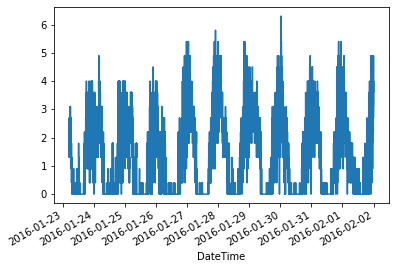

In [10]:
df['Wind Speed']['2016-01-23':'2016-02-01'].plot()

<AxesSubplot:xlabel='DateTime'>

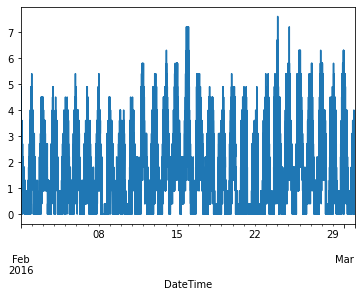

In [11]:
df['Wind Speed']['2016-02-01':'2016-03-01'].plot()

<AxesSubplot:xlabel='DateTime'>

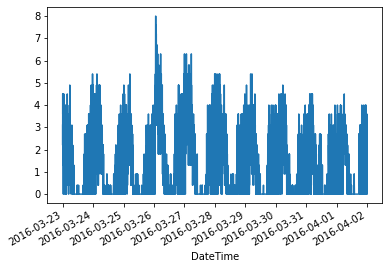

In [12]:
df['Wind Speed']['2016-03-23':'2016-04-01'].plot()

In [13]:
df.drop('Date' , axis = 1 , inplace = True)
df.drop('Time' , axis = 1 , inplace = True)
df.drop('Hi Dir' , axis = 1 , inplace = True)
df.drop('Wind Dir' , axis = 1 , inplace = True)


In [14]:

df.drop('Rain' , axis = 1 , inplace = True)
df.drop('Rain Rate' , axis = 1 , inplace = True)
df.drop('Solar Rad.' , axis = 1 , inplace = True)
df.drop('Solar Energy' , axis = 1 , inplace = True)
df.drop('HI Solar  Rad. ' , axis = 1 , inplace = True)
df.drop('UV Index' , axis = 1 , inplace = True)
df.drop('UV Dose' , axis = 1 , inplace = True)
df.drop('Hi UV ' , axis = 1 , inplace = True)
df.drop('Heat D-D ' , axis = 1 , inplace = True)
df.drop('Wind Tx ' , axis = 1 , inplace = True)
df.drop('Arc. Int.' , axis = 1 , inplace = True)

In [15]:
df.dtypes

Temp Out          float64
Hi Temp           float64
Low Temp          float64
Out Hum             int64
Dew Pt.           float64
Wind Speed        float64
Wind Run          float64
Hi Speed          float64
Wind Chill        float64
Heat Index        float64
THW Index         float64
Bar               float64
Cool D-D          float64
In Temp           float64
In Hum              int64
In Dew            float64
In Heat           float64
In EMC            float64
In Air Density    float64
ET                float64
Wind Samp           int64
ISS Recept        float64
dtype: object

In [16]:
df.head(5)

,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Run,Hi Speed,Wind Chill,Heat Index,...,Cool D-D,In Temp,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,ISS Recept
DateTime,,,,,,,,,,,,,,,,,,,,,
2016-01-23 05:01:00,77.9,77.9,77.9,77,70.1,1.8,0.11,2.7,77.9,80.8,...,0.009,88.9,50,67.9,93.5,9.05,1.1316,0.0,24,100.0
2016-01-23 05:02:00,77.9,77.9,77.9,77,70.1,2.2,0.13,2.7,77.9,80.8,...,0.009,88.9,50,67.9,93.5,9.05,1.1317,0.0,23,100.0
2016-01-23 05:03:00,77.9,77.9,77.9,77,70.1,2.2,0.13,2.7,77.9,80.8,...,0.009,88.9,50,67.9,93.5,9.05,1.1316,0.0,24,100.0
2016-01-23 05:04:00,77.8,77.9,77.8,77,70.0,2.2,0.13,3.1,77.8,80.7,...,0.009,88.9,50,67.9,93.5,9.05,1.1317,0.0,23,100.0
2016-01-23 05:05:00,77.8,77.8,77.8,77,70.0,1.8,0.11,2.2,77.8,80.7,...,0.009,88.9,51,68.4,93.8,9.17,1.1312,0.0,23,100.0


In [17]:
df.isna().any()

Temp Out           True
Hi Temp           False
Low Temp          False
Out Hum           False
Dew Pt.            True
Wind Speed        False
Wind Run          False
Hi Speed          False
Wind Chill         True
Heat Index         True
THW Index          True
Bar               False
Cool D-D           True
In Temp           False
In Hum            False
In Dew            False
In Heat           False
In EMC            False
In Air Density    False
ET                False
Wind Samp         False
ISS Recept        False
dtype: bool

In [18]:
df.dropna(axis = 0 , how = 'any' , inplace=True)

In [19]:
df = df.interpolate(method='time')

In [20]:
df.isna().any()

Temp Out          False
Hi Temp           False
Low Temp          False
Out Hum           False
Dew Pt.           False
Wind Speed        False
Wind Run          False
Hi Speed          False
Wind Chill        False
Heat Index        False
THW Index         False
Bar               False
Cool D-D          False
In Temp           False
In Hum            False
In Dew            False
In Heat           False
In EMC            False
In Air Density    False
ET                False
Wind Samp         False
ISS Recept        False
dtype: bool

In [22]:
target_names = ['Wind Speed']


In [23]:
df["Wind Speed"].head(10)

DateTime
2016-01-23 05:01:00    1.8
2016-01-23 05:02:00    2.2
2016-01-23 05:03:00    2.2
2016-01-23 05:04:00    2.2
2016-01-23 05:05:00    1.8
2016-01-23 05:06:00    2.7
2016-01-23 05:07:00    1.3
2016-01-23 05:08:00    1.8
2016-01-23 05:09:00    2.2
2016-01-23 05:10:00    1.8
Name: Wind Speed, dtype: float64

In [24]:
shift_steps = 1

In [25]:
df_targets = df[target_names].shift(-shift_steps)

In [26]:
df[target_names]

,Wind Speed
DateTime,
2016-01-23 05:01:00,1.8
2016-01-23 05:02:00,2.2
2016-01-23 05:03:00,2.2
2016-01-23 05:04:00,2.2
2016-01-23 05:05:00,1.8
...,...
2016-12-19 09:51:00,0.4
2016-12-19 09:52:00,0.9
2016-12-19 09:53:00,0.0


In [27]:
df_targets

,Wind Speed
DateTime,
2016-01-23 05:01:00,2.2
2016-01-23 05:02:00,2.2
2016-01-23 05:03:00,2.2
2016-01-23 05:04:00,1.8
2016-01-23 05:05:00,2.7
...,...
2016-12-19 09:51:00,0.9
2016-12-19 09:52:00,0.0
2016-12-19 09:53:00,0.0


In [28]:
df_targets.tail(10)

,Wind Speed
DateTime,
2016-12-19 09:46:00,0.0
2016-12-19 09:47:00,0.9
2016-12-19 09:48:00,0.4
2016-12-19 09:49:00,0.0
2016-12-19 09:50:00,0.4
2016-12-19 09:51:00,0.9
2016-12-19 09:52:00,0.0
2016-12-19 09:53:00,0.0
2016-12-19 09:54:00,0.4


In [29]:
x_data = df.values[0:-shift_steps]

In [30]:
num_data = len(x_data)
num_data

473111

In [31]:
y_data = df_targets.values[:-shift_steps]

In [32]:
x_train = x_data
x_test = x_data

In [33]:
x_test

array([[ 77.9,  77.9,  77.9, ...,   0. ,  24. , 100. ],
       [ 77.9,  77.9,  77.9, ...,   0. ,  23. , 100. ],
       [ 77.9,  77.9,  77.9, ...,   0. ,  24. , 100. ],
       ...,
       [ 81.4,  81.4,  81.3, ...,   0. ,  23. , 100. ],
       [ 81.5,  81.5,  81.4, ...,   0. ,  23. , 100. ],
       [ 81.5,  81.5,  81.5, ...,   0. ,  24. , 100. ]])

In [34]:
y_train = y_data
y_test = y_data

In [35]:
y_train

array([[2.2],
       [2.2],
       [2.2],
       ...,
       [0. ],
       [0. ],
       [0.4]])

In [36]:
y_test

array([[2.2],
       [2.2],
       [2.2],
       ...,
       [0. ],
       [0. ],
       [0.4]])

In [37]:
num_x_signals = x_data.shape[1]
num_x_signals

22

In [38]:
num_y_signals = y_data.shape[1]
num_y_signals

1

In [39]:
print("Min:", np.min(x_train))
print("Max:", np.max(x_train))

Min: 0.0
Max: 762.6


In [40]:
x_scaler = MinMaxScaler()

In [41]:
x_train_scaled = x_scaler.fit_transform(x_train)

In [42]:
print("Min:", np.min(x_train_scaled))
print("Max:", np.max(x_train_scaled))

Min: 0.0
Max: 1.0000000000000004


In [43]:
x_train

array([[ 77.9,  77.9,  77.9, ...,   0. ,  24. , 100. ],
       [ 77.9,  77.9,  77.9, ...,   0. ,  23. , 100. ],
       [ 77.9,  77.9,  77.9, ...,   0. ,  24. , 100. ],
       ...,
       [ 81.4,  81.4,  81.3, ...,   0. ,  23. , 100. ],
       [ 81.5,  81.5,  81.4, ...,   0. ,  23. , 100. ],
       [ 81.5,  81.5,  81.5, ...,   0. ,  24. , 100. ]])

In [44]:
x_train_scaled

array([[0.33816425, 0.3373494 , 0.33816425, ..., 0.        , 0.37777778,
        1.        ],
       [0.33816425, 0.3373494 , 0.33816425, ..., 0.        , 0.35555556,
        1.        ],
       [0.33816425, 0.3373494 , 0.33816425, ..., 0.        , 0.37777778,
        1.        ],
       ...,
       [0.42270531, 0.42168675, 0.42028986, ..., 0.        , 0.35555556,
        1.        ],
       [0.42512077, 0.42409639, 0.42270531, ..., 0.        , 0.35555556,
        1.        ],
       [0.42512077, 0.42409639, 0.42512077, ..., 0.        , 0.37777778,
        1.        ]])

In [45]:
x_test_scaled = x_scaler.transform(x_test)

In [46]:
x_test_scaled

array([[0.33816425, 0.3373494 , 0.33816425, ..., 0.        , 0.37777778,
        1.        ],
       [0.33816425, 0.3373494 , 0.33816425, ..., 0.        , 0.35555556,
        1.        ],
       [0.33816425, 0.3373494 , 0.33816425, ..., 0.        , 0.37777778,
        1.        ],
       ...,
       [0.42270531, 0.42168675, 0.42028986, ..., 0.        , 0.35555556,
        1.        ],
       [0.42512077, 0.42409639, 0.42270531, ..., 0.        , 0.35555556,
        1.        ],
       [0.42512077, 0.42409639, 0.42512077, ..., 0.        , 0.37777778,
        1.        ]])

In [47]:
y_scaler = MinMaxScaler()
y_train_scaled = y_scaler.fit_transform(y_train)
y_test_scaled = y_scaler.transform(y_test)

In [48]:
print(x_train_scaled.shape)
print(y_train_scaled.shape)

(473111, 22)
(473111, 1)


In [49]:
def batch_generator(batch_size, sequence_length):
    
# This is a generator function for creating random batches of training-data.

    while True:
        x_shape = (batch_size, sequence_length, num_x_signals)
        x_batch = np.zeros(shape=x_shape, dtype=np.float16)
        
        y_shape = (batch_size, sequence_length, num_y_signals)
        y_batch = np.zeros(shape=y_shape, dtype=np.float16)

        for i in range(batch_size):
            idx = np.random.randint(num_data - sequence_length)
            
            x_batch[i] = x_train_scaled[idx:idx+sequence_length]
            y_batch[i] = y_train_scaled[idx:idx+sequence_length]
        
        yield (x_batch, y_batch)

In [50]:
batch_size = 3

In [51]:
sequence_length = 60*4
sequence_length

240

In [52]:
generator = batch_generator(batch_size=batch_size,
                            sequence_length=sequence_length)

In [53]:
x_batch, y_batch = next(generator)

In [54]:
print(x_batch.shape)
print(y_batch.shape)

(3, 240, 22)
(3, 240, 1)


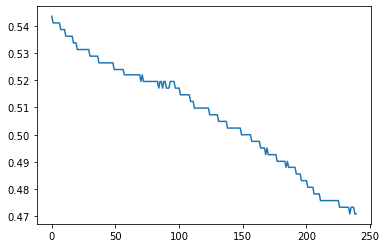

In [55]:
batch = 0   # First sequence in the batch.
signal = 0  # First attribute from the 20 input-signals.
seq = x_batch[batch, :, signal]
plt.plot(seq)

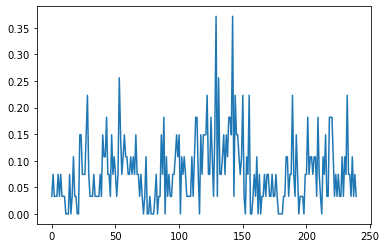

In [56]:
seq = y_batch[batch, :, signal]
plt.plot(seq)

In [57]:
validation_data = (np.expand_dims(x_test_scaled, axis=0),
                   np.expand_dims(y_test_scaled, axis=0))

In [58]:
model = Sequential()

In [59]:
# We take no of hidden units to be 512.
model.add(LSTM(units=512,
              return_sequences=True,
              input_shape=(None, num_x_signals,)))

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [61]:
model.add(Dense(num_y_signals, activation='sigmoid'))

In [63]:
warmup_steps = 50

In [64]:
def loss_mse_warmup(y_true, y_pred):

    '''Here, we calculate the Mean Squared Error between y_true and y_pred,
    but ignore the beginning "warmup" part of the sequences.
    '''
    
    y_true_slice = y_true[:, warmup_steps:, :]
    y_pred_slice = y_pred[:, warmup_steps:, :]

    loss = tf.losses.mean_squared_error(labels=y_true_slice,
                                        predictions=y_pred_slice)
    loss_mean = tf.reduce_mean(loss)

    return loss_mean

In [65]:
optimizer = RMSprop(lr=1e-4)

In [66]:
model.compile(loss=loss_mse_warmup, optimizer=optimizer,metrics=['accuracy'])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [67]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, None, 512)         1095680   
_________________________________________________________________
dense (Dense)                (None, None, 1)           513       
Total params: 1,096,193
Trainable params: 1,096,193
Non-trainable params: 0
_________________________________________________________________


In [68]:
path_checkpoint = '23_checkpoint.keras'
callback_checkpoint = ModelCheckpoint(filepath=path_checkpoint,
                                      monitor='val_loss',
                                      verbose=1,
                                      save_weights_only=True,
                                      save_best_only=True)

In [69]:
callback_early_stopping = EarlyStopping(monitor='val_loss',
                                        patience=5, verbose=1)

In [70]:
callback_tensorboard = TensorBoard(log_dir='./23_logs/',
                                   histogram_freq=0,
                                   write_graph=False)

In [71]:
callback_reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                       factor=0.1,
                                       min_lr=1e-4,
                                       patience=0,
                                       verbose=1)

In [72]:
callbacks = [callback_early_stopping,
             callback_checkpoint,
             callback_tensorboard,
             callback_reduce_lr]

In [73]:
%%time
model.fit_generator(generator=generator,
                    epochs=20,
                    steps_per_epoch=100,
                    validation_data=validation_data,
                    callbacks=callbacks)

Epoch 1/20
  1/100 [..............................] - ETA: 8:26:27 - loss: 0.0102 - acc: 0.4771
Epoch 00001: val_loss improved from inf to 0.01020, saving model to 23_checkpoint.keras
100/100 [==============================] - 328s 3s/step - loss: 0.0178 - acc: 0.5073 - val_loss: 0.0102 - val_acc: 0.4771
Epoch 2/20
  1/100 [..............................] - ETA: 12:20:57 - loss: 0.0051 - acc: 0.4771
Epoch 00002: val_loss improved from 0.01020 to 0.00513, saving model to 23_checkpoint.keras
100/100 [==============================] - 550s 5s/step - loss: 0.0075 - acc: 0.4688 - val_loss: 0.0051 - val_acc: 0.4771
Epoch 3/20
  1/100 [..............................] - ETA: 12:14:23 - loss: 0.0047 - acc: 0.4771
Epoch 00003: val_loss improved from 0.00513 to 0.00474, saving model to 23_checkpoint.keras
100/100 [==============================] - 544s 5s/step - loss: 0.0058 - acc: 0.4809 - val_loss: 0.0047 - val_acc: 0.4771
Epoch 4/20
  1/100 [..............................] - ETA: 12:09:08 - lo

In [74]:
try:
    model.load_weights(path_checkpoint)
except Exception as error:
    print("Error trying to load checkpoint.")
    print(error)

In [75]:
result = model.evaluate(x=np.expand_dims(x_test_scaled, axis=0),
                        y=np.expand_dims(y_test_scaled, axis=0))

1/1 [==============================] - 454s 454s/sample - loss: 0.0034 - acc: 0.4771


In [78]:
path = open('/home/avinash/Winter Project/TrichyWeatherDataWindspeed/Formatted/20167.csv')
ff = pd.read_csv(path, sep=',', header=0  , index_col=False , na_values = '---' )

In [79]:
ff.head(1)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.
0,01-23-2017,05:01,71.1,71.1,71.1,86,66.7,0.0,NaN,0.0,...,49,65.1,88.9,8.85,1.1412,0.0,24,1,100.0,1


In [80]:
datestr1 = ff[['Date', 'Time']].apply(_date_string, axis=1)
ff['DateTime'] = pd.to_datetime(datestr1, format='%m%d%Y%H%M')

01232017
0501
01232017
0502
01232017
0503
01232017
0504
01232017
0505
01232017
0506
01232017
0507
01232017
0508
01232017
0509
01232017
0510
01232017
0511
01232017
0512
01232017
0513
01232017
0514
01232017
0515
01232017
0516
01232017
0517
01232017
0518
01232017
0519
01232017
0520
01232017
0521
01232017
0522
01232017
0523
01232017
0524
01232017
0525
01232017
0526
01232017
0527
01232017
0528
01232017
0529
01232017
0530
01232017
0531
01232017
0532
01232017
0533
01232017
0534
01232017
0535
01232017
0536
01232017
0537
01232017
0538
01232017
0539
01232017
0540
01232017
0541
01232017
0542
01232017
0543
01232017
0544
01232017
0545
01232017
0546
01232017
0547
01232017
0548
01232017
0549
01232017
0550
01232017
0551
01232017
0552
01232017
0553
01232017
0554
01232017
0555
01232017
0556
01232017
0557
01232017
0558
01232017
0559
01232017
0600
01232017
0601
01232017
0602
01232017
0603
01232017
0604
01232017
0605
01232017
0606
01232017
0607
01232017
0608
01232017
0609
01232017
0610
01232017
0611
012320

1911
01232017
1912
01232017
1913
01232017
1914
01232017
1915
01232017
1916
01232017
1917
01232017
1918
01232017
1919
01232017
1920
01232017
1921
01232017
1922
01232017
1923
01232017
1924
01232017
1925
01232017
1926
01232017
1927
01232017
1928
01232017
1929
01232017
1930
01232017
1931
01232017
1932
01232017
1933
01232017
1934
01232017
1935
01232017
1936
01232017
1937
01232017
1938
01232017
1939
01232017
1940
01232017
1941
01232017
1942
01232017
1943
01232017
1944
01232017
1945
01232017
1946
01232017
1947
01232017
1948
01232017
1949
01232017
1950
01232017
1951
01232017
1952
01232017
1953
01232017
1954
01232017
1955
01232017
1956
01232017
1957
01232017
1958
01232017
1959
01232017
2000
01232017
2001
01232017
2002
01232017
2003
01232017
2004
01232017
2005
01232017
2006
01232017
2007
01232017
2008
01232017
2009
01232017
2010
01232017
2011
01232017
2012
01232017
2013
01232017
2014
01232017
2015
01232017
2016
01232017
2017
01232017
2018
01232017
2019
01232017
2020
01232017
2021
01232017
2022
0

1206
01242017
1207
01242017
1208
01242017
1209
01242017
1210
01242017
1211
01242017
1212
01242017
1213
01242017
1214
01242017
1215
01242017
1216
01242017
1217
01242017
1218
01242017
1219
01242017
1220
01242017
1221
01242017
1222
01242017
1223
01242017
1224
01242017
1225
01242017
1226
01242017
1227
01242017
1228
01242017
1229
01242017
1230
01242017
1231
01242017
1232
01242017
1233
01242017
1234
01242017
1235
01242017
1236
01242017
1237
01242017
1238
01242017
1239
01242017
1240
01242017
1241
01242017
1242
01242017
1243
01242017
1244
01242017
1245
01242017
1246
01242017
1247
01242017
1248
01242017
1249
01242017
1250
01242017
1251
01242017
1252
01242017
1253
01242017
1254
01242017
1255
01242017
1256
01242017
1257
01242017
1258
01242017
1259
01242017
1300
01242017
1301
01242017
1302
01242017
1303
01242017
1304
01242017
1305
01242017
1306
01242017
1307
01242017
1308
01242017
1309
01242017
1310
01242017
1311
01242017
1312
01242017
1313
01242017
1314
01242017
1315
01242017
1316
01242017
1317
0

0105
01252017
0106
01252017
0107
01252017
0108
01252017
0109
01252017
0110
01252017
0111
01252017
0112
01252017
0113
01252017
0114
01252017
0115
01252017
0116
01252017
0117
01252017
0118
01252017
0119
01252017
0120
01252017
0121
01252017
0122
01252017
0123
01252017
0124
01252017
0125
01252017
0126
01252017
0127
01252017
0128
01252017
0129
01252017
0130
01252017
0131
01252017
0132
01252017
0133
01252017
0134
01252017
0135
01252017
0136
01252017
0137
01252017
0138
01252017
0139
01252017
0140
01252017
0141
01252017
0142
01252017
0143
01252017
0144
01252017
0145
01252017
0146
01252017
0147
01252017
0148
01252017
0149
01252017
0150
01252017
0151
01252017
0152
01252017
0153
01252017
0154
01252017
0155
01252017
0156
01252017
0157
01252017
0158
01252017
0159
01252017
0200
01252017
0201
01252017
0202
01252017
0203
01252017
0204
01252017
0205
01252017
0206
01252017
0207
01252017
0208
01252017
0209
01252017
0210
01252017
0211
01252017
0212
01252017
0213
01252017
0214
01252017
0215
01252017
0216
0

1855
01252017
1856
01252017
1857
01252017
1858
01252017
1859
01252017
1900
01252017
1901
01252017
1902
01252017
1903
01252017
1904
01252017
1905
01252017
1906
01252017
1907
01252017
1908
01252017
1909
01252017
1910
01252017
1911
01252017
1912
01252017
1913
01252017
1914
01252017
1915
01252017
1916
01252017
1917
01252017
1918
01252017
1919
01252017
1920
01252017
1921
01252017
1922
01252017
1923
01252017
1924
01252017
1925
01252017
1926
01252017
1927
01252017
1928
01252017
1929
01252017
1930
01252017
1931
01252017
1932
01252017
1933
01252017
1934
01252017
1935
01252017
1936
01252017
1937
01252017
1938
01252017
1939
01252017
1940
01252017
1941
01252017
1942
01252017
1943
01252017
1944
01252017
1945
01252017
1946
01252017
1947
01252017
1948
01252017
1949
01252017
1950
01252017
1951
01252017
1952
01252017
1953
01252017
1954
01252017
1955
01252017
1956
01252017
1957
01252017
1958
01252017
1959
01252017
2000
01252017
2001
01252017
2002
01252017
2003
01252017
2004
01252017
2005
01252017
2006
0

01262017
0902
01262017
0903
01262017
0904
01262017
0905
01262017
0906
01262017
0907
01262017
0908
01262017
0909
01262017
0910
01262017
0911
01262017
0912
01262017
0913
01262017
0914
01262017
0915
01262017
0916
01262017
0917
01262017
0918
01262017
0919
01262017
0920
01262017
0921
01262017
0922
01262017
0923
01262017
0924
01262017
0925
01262017
0926
01262017
0927
01262017
0928
01262017
0929
01262017
0930
01262017
0931
01262017
0932
01262017
0933
01262017
0934
01262017
0935
01262017
0936
01262017
0937
01262017
0938
01262017
0939
01262017
0940
01262017
0941
01262017
0942
01262017
0943
01262017
0944
01262017
0945
01262017
0946
01262017
0947
01262017
0948
01262017
0949
01262017
0950
01262017
0951
01262017
0952
01262017
0953
01262017
0954
01262017
0955
01262017
0956
01262017
0957
01262017
0958
01262017
0959
01262017
1000
01262017
1001
01262017
1002
01262017
1003
01262017
1004
01262017
1005
01262017
1006
01262017
1007
01262017
1008
01262017
1009
01262017
1010
01262017
1011
01262017
1012
012620

01262017
2233
01262017
2234
01262017
2235
01262017
2236
01262017
2237
01262017
2238
01262017
2239
01262017
2240
01262017
2241
01262017
2242
01262017
2243
01262017
2244
01262017
2245
01262017
2246
01262017
2247
01262017
2248
01262017
2249
01262017
2250
01262017
2251
01262017
2252
01262017
2253
01262017
2254
01262017
2255
01262017
2256
01262017
2257
01262017
2258
01262017
2259
01262017
2300
01262017
2301
01262017
2302
01262017
2303
01262017
2304
01262017
2305
01262017
2306
01262017
2307
01262017
2308
01262017
2309
01262017
2310
01262017
2311
01262017
2312
01262017
2313
01262017
2314
01262017
2315
01262017
2316
01262017
2317
01262017
2318
01262017
2319
01262017
2320
01262017
2321
01262017
2322
01262017
2323
01262017
2324
01262017
2325
01262017
2326
01262017
2327
01262017
2328
01262017
2329
01262017
2330
01262017
2331
01262017
2332
01262017
2333
01262017
2334
01262017
2335
01262017
2336
01262017
2337
01262017
2338
01262017
2339
01262017
2340
01262017
2341
01262017
2342
01262017
2343
012620

01272017
1406
01272017
1407
01272017
1408
01272017
1409
01272017
1410
01272017
1411
01272017
1412
01272017
1413
01272017
1414
01272017
1415
01272017
1416
01272017
1417
01272017
1418
01272017
1419
01272017
1420
01272017
1421
01272017
1422
01272017
1423
01272017
1424
01272017
1425
01272017
1426
01272017
1427
01272017
1428
01272017
1429
01272017
1430
01272017
1431
01272017
1432
01272017
1433
01272017
1434
01272017
1435
01272017
1436
01272017
1437
01272017
1438
01272017
1439
01272017
1440
01272017
1441
01272017
1442
01272017
1443
01272017
1444
01272017
1445
01272017
1446
01272017
1447
01272017
1448
01272017
1449
01272017
1450
01272017
1451
01272017
1452
01272017
1453
01272017
1454
01272017
1455
01272017
1456
01272017
1457
01272017
1458
01272017
1459
01272017
1500
01272017
1501
01272017
1502
01272017
1503
01272017
1504
01272017
1505
01272017
1506
01272017
1507
01272017
1508
01272017
1509
01272017
1510
01272017
1511
01272017
1512
01272017
1513
01272017
1514
01272017
1515
01272017
1516
012720

01282017
0124
01282017
0125
01282017
0126
01282017
0127
01282017
0128
01282017
0129
01282017
0130
01282017
0131
01282017
0132
01282017
0133
01282017
0134
01282017
0135
01282017
0136
01282017
0137
01282017
0138
01282017
0139
01282017
0140
01282017
0141
01282017
0142
01282017
0143
01282017
0144
01282017
0145
01282017
0146
01282017
0147
01282017
0148
01282017
0149
01282017
0150
01282017
0151
01282017
0152
01282017
0153
01282017
0154
01282017
0155
01282017
0156
01282017
0157
01282017
0158
01282017
0159
01282017
0200
01282017
0201
01282017
0202
01282017
0203
01282017
0204
01282017
0205
01282017
0206
01282017
0207
01282017
0208
01282017
0209
01282017
0210
01282017
0211
01282017
0212
01282017
0213
01282017
0214
01282017
0215
01282017
0216
01282017
0217
01282017
0218
01282017
0219
01282017
0220
01282017
0221
01282017
0222
01282017
0223
01282017
0224
01282017
0225
01282017
0226
01282017
0227
01282017
0228
01282017
0229
01282017
0230
01282017
0231
01282017
0232
01282017
0233
01282017
0234
012820

01282017
1640
01282017
1641
01282017
1642
01282017
1643
01282017
1644
01282017
1645
01282017
1646
01282017
1647
01282017
1648
01282017
1649
01282017
1650
01282017
1651
01282017
1652
01282017
1653
01282017
1654
01282017
1655
01282017
1656
01282017
1657
01282017
1658
01282017
1659
01282017
1700
01282017
1701
01282017
1702
01282017
1703
01282017
1704
01282017
1705
01282017
1706
01282017
1707
01282017
1708
01282017
1709
01282017
1710
01282017
1711
01282017
1712
01282017
1713
01282017
1714
01282017
1715
01282017
1716
01282017
1717
01282017
1718
01282017
1719
01282017
1720
01282017
1721
01282017
1722
01282017
1723
01282017
1724
01282017
1725
01282017
1726
01282017
1727
01282017
1728
01282017
1729
01282017
1730
01282017
1731
01282017
1732
01282017
1733
01282017
1734
01282017
1735
01282017
1736
01282017
1737
01282017
1738
01282017
1739
01282017
1740
01282017
1741
01282017
1742
01282017
1743
01282017
1744
01282017
1745
01282017
1746
01282017
1747
01282017
1748
01282017
1749
01282017
1750
012820

0612
01292017
0613
01292017
0614
01292017
0615
01292017
0616
01292017
0617
01292017
0618
01292017
0619
01292017
0620
01292017
0621
01292017
0622
01292017
0623
01292017
0624
01292017
0625
01292017
0626
01292017
0627
01292017
0628
01292017
0629
01292017
0630
01292017
0631
01292017
0632
01292017
0633
01292017
0634
01292017
0635
01292017
0636
01292017
0637
01292017
0638
01292017
0639
01292017
0640
01292017
0641
01292017
0642
01292017
0643
01292017
0644
01292017
0645
01292017
0646
01292017
0647
01292017
0648
01292017
0649
01292017
0650
01292017
0651
01292017
0652
01292017
0653
01292017
0654
01292017
0655
01292017
0656
01292017
0657
01292017
0658
01292017
0659
01292017
0700
01292017
0701
01292017
0702
01292017
0703
01292017
0704
01292017
0705
01292017
0706
01292017
0707
01292017
0708
01292017
0709
01292017
0710
01292017
0711
01292017
0712
01292017
0713
01292017
0714
01292017
0715
01292017
0716
01292017
0717
01292017
0718
01292017
0719
01292017
0720
01292017
0721
01292017
0722
01292017
0723
0

2154
01292017
2155
01292017
2156
01292017
2157
01292017
2158
01292017
2159
01292017
2200
01292017
2201
01292017
2202
01292017
2203
01292017
2204
01292017
2205
01292017
2206
01292017
2207
01292017
2208
01292017
2209
01292017
2210
01292017
2211
01292017
2212
01292017
2213
01292017
2214
01292017
2215
01292017
2216
01292017
2217
01292017
2218
01292017
2219
01292017
2220
01292017
2221
01292017
2222
01292017
2223
01292017
2224
01292017
2225
01292017
2226
01292017
2227
01292017
2228
01292017
2229
01292017
2230
01292017
2231
01292017
2232
01292017
2233
01292017
2234
01292017
2235
01292017
2236
01292017
2237
01292017
2238
01292017
2239
01292017
2240
01292017
2241
01292017
2242
01292017
2243
01292017
2244
01292017
2245
01292017
2246
01292017
2247
01292017
2248
01292017
2249
01292017
2250
01292017
2251
01292017
2252
01292017
2253
01292017
2254
01292017
2255
01292017
2256
01292017
2257
01292017
2258
01292017
2259
01292017
2300
01292017
2301
01292017
2302
01292017
2303
01292017
2304
01292017
2305
0

1207
01302017
1208
01302017
1209
01302017
1210
01302017
1211
01302017
1212
01302017
1213
01302017
1214
01302017
1215
01302017
1216
01302017
1217
01302017
1218
01302017
1219
01302017
1220
01302017
1221
01302017
1222
01302017
1223
01302017
1224
01302017
1225
01302017
1226
01302017
1227
01302017
1228
01302017
1229
01302017
1230
01302017
1231
01302017
1232
01302017
1233
01302017
1234
01302017
1235
01302017
1236
01302017
1237
01302017
1238
01302017
1239
01302017
1240
01302017
1241
01302017
1242
01302017
1243
01302017
1244
01302017
1245
01302017
1246
01302017
1247
01302017
1248
01302017
1249
01302017
1250
01302017
1251
01302017
1252
01302017
1253
01302017
1254
01302017
1255
01302017
1256
01302017
1257
01302017
1258
01302017
1259
01302017
1300
01302017
1301
01302017
1302
01302017
1303
01302017
1304
01302017
1305
01302017
1306
01302017
1307
01302017
1308
01302017
1309
01302017
1310
01302017
1311
01302017
1312
01302017
1313
01302017
1314
01302017
1315
01302017
1316
01302017
1317
01302017
1318
0

0218
01312017
0219
01312017
0220
01312017
0221
01312017
0222
01312017
0223
01312017
0224
01312017
0225
01312017
0226
01312017
0227
01312017
0228
01312017
0229
01312017
0230
01312017
0231
01312017
0232
01312017
0233
01312017
0234
01312017
0235
01312017
0236
01312017
0237
01312017
0238
01312017
0239
01312017
0240
01312017
0241
01312017
0242
01312017
0243
01312017
0244
01312017
0245
01312017
0246
01312017
0247
01312017
0248
01312017
0249
01312017
0250
01312017
0251
01312017
0252
01312017
0253
01312017
0254
01312017
0255
01312017
0256
01312017
0257
01312017
0258
01312017
0259
01312017
0300
01312017
0301
01312017
0302
01312017
0303
01312017
0304
01312017
0305
01312017
0306
01312017
0307
01312017
0308
01312017
0309
01312017
0310
01312017
0311
01312017
0312
01312017
0313
01312017
0314
01312017
0315
01312017
0316
01312017
0317
01312017
0318
01312017
0319
01312017
0320
01312017
0321
01312017
0322
01312017
0323
01312017
0324
01312017
0325
01312017
0326
01312017
0327
01312017
0328
01312017
0329
0

01312017
1706
01312017
1707
01312017
1708
01312017
1709
01312017
1710
01312017
1711
01312017
1712
01312017
1713
01312017
1714
01312017
1715
01312017
1716
01312017
1717
01312017
1718
01312017
1719
01312017
1720
01312017
1721
01312017
1722
01312017
1723
01312017
1724
01312017
1725
01312017
1726
01312017
1727
01312017
1728
01312017
1729
01312017
1730
01312017
1731
01312017
1732
01312017
1733
01312017
1734
01312017
1735
01312017
1736
01312017
1737
01312017
1738
01312017
1739
01312017
1740
01312017
1741
01312017
1742
01312017
1743
01312017
1744
01312017
1745
01312017
1746
01312017
1747
01312017
1748
01312017
1749
01312017
1750
01312017
1751
01312017
1752
01312017
1753
01312017
1754
01312017
1755
01312017
1756
01312017
1757
01312017
1758
01312017
1759
01312017
1800
01312017
1801
01312017
1802
01312017
1803
01312017
1804
01312017
1805
01312017
1806
01312017
1807
01312017
1808
01312017
1809
01312017
1810
01312017
1811
01312017
1812
01312017
1813
01312017
1814
01312017
1815
01312017
1816
013120

0911
02012017
0912
02012017
0913
02012017
0914
02012017
0915
02012017
0916
02012017
0917
02012017
0918
02012017
0919
02012017
0920
02012017
0921
02012017
0922
02012017
0923
02012017
0924
02012017
0925
02012017
0926
02012017
0927
02012017
0928
02012017
0929
02012017
0930
02012017
0931
02012017
0932
02012017
0933
02012017
0934
02012017
0935
02012017
0936
02012017
0937
02012017
0938
02012017
0939
02012017
0940
02012017
0941
02012017
0942
02012017
0943
02012017
0944
02012017
0945
02012017
0946
02012017
0947
02012017
0948
02012017
0949
02012017
0950
02012017
0951
02012017
0952
02012017
0953
02012017
0954
02012017
0955
02012017
0956
02012017
0957
02012017
0958
02012017
0959
02012017
1000
02012017
1001
02012017
1002
02012017
1003
02012017
1004
02012017
1005
02012017
1006
02012017
1007
02012017
1008
02012017
1009
02012017
1010
02012017
1011
02012017
1012
02012017
1013
02012017
1014
02012017
1015
02012017
1016
02012017
1017
02012017
1018
02012017
1019
02012017
1020
02012017
1021
02012017
1022
0

02022017
0007
02022017
0008
02022017
0009
02022017
0010
02022017
0011
02022017
0012
02022017
0013
02022017
0014
02022017
0015
02022017
0016
02022017
0017
02022017
0018
02022017
0019
02022017
0020
02022017
0021
02022017
0022
02022017
0023
02022017
0024
02022017
0025
02022017
0026
02022017
0027
02022017
0028
02022017
0029
02022017
0030
02022017
0031
02022017
0032
02022017
0033
02022017
0034
02022017
0035
02022017
0036
02022017
0037
02022017
0038
02022017
0039
02022017
0040
02022017
0041
02022017
0042
02022017
0043
02022017
0044
02022017
0045
02022017
0046
02022017
0047
02022017
0048
02022017
0049
02022017
0050
02022017
0051
02022017
0052
02022017
0053
02022017
0054
02022017
0055
02022017
0056
02022017
0057
02022017
0058
02022017
0059
02022017
0100
02022017
0101
02022017
0102
02022017
0103
02022017
0104
02022017
0105
02022017
0106
02022017
0107
02022017
0108
02022017
0109
02022017
0110
02022017
0111
02022017
0112
02022017
0113
02022017
0114
02022017
0115
02022017
0116
02022017
0117
020220

1617
02022017
1618
02022017
1619
02022017
1620
02022017
1621
02022017
1622
02022017
1623
02022017
1624
02022017
1625
02022017
1626
02022017
1627
02022017
1628
02022017
1629
02022017
1630
02022017
1631
02022017
1632
02022017
1633
02022017
1634
02022017
1635
02022017
1636
02022017
1637
02022017
1638
02022017
1639
02022017
1640
02022017
1641
02022017
1642
02022017
1643
02022017
1644
02022017
1645
02022017
1646
02022017
1647
02022017
1648
02022017
1649
02022017
1650
02022017
1651
02022017
1652
02022017
1653
02022017
1654
02022017
1655
02022017
1656
02022017
1657
02022017
1658
02022017
1659
02022017
1700
02022017
1701
02022017
1702
02022017
1703
02022017
1704
02022017
1705
02022017
1706
02022017
1707
02022017
1708
02022017
1709
02022017
1710
02022017
1711
02022017
1712
02022017
1713
02022017
1714
02022017
1715
02022017
1716
02022017
1717
02022017
1718
02022017
1719
02022017
1720
02022017
1721
02022017
1722
02022017
1723
02022017
1724
02022017
1725
02022017
1726
02022017
1727
02022017
1728
0

02032017
0704
02032017
0705
02032017
0706
02032017
0707
02032017
0708
02032017
0709
02032017
0710
02032017
0711
02032017
0712
02032017
0713
02032017
0714
02032017
0715
02032017
0716
02032017
0717
02032017
0718
02032017
0719
02032017
0720
02032017
0721
02032017
0722
02032017
0723
02032017
0724
02032017
0725
02032017
0726
02032017
0727
02032017
0728
02032017
0729
02032017
0730
02032017
0731
02032017
0732
02032017
0733
02032017
0734
02032017
0735
02032017
0736
02032017
0737
02032017
0738
02032017
0739
02032017
0740
02032017
0741
02032017
0742
02032017
0743
02032017
0744
02032017
0745
02032017
0746
02032017
0747
02032017
0748
02032017
0749
02032017
0750
02032017
0751
02032017
0752
02032017
0753
02032017
0754
02032017
0755
02032017
0756
02032017
0757
02032017
0758
02032017
0759
02032017
0800
02032017
0801
02032017
0802
02032017
0803
02032017
0804
02032017
0805
02032017
0806
02032017
0807
02032017
0808
02032017
0809
02032017
0810
02032017
0811
02032017
0812
02032017
0813
02032017
0814
020320

02032017
2324
02032017
2325
02032017
2326
02032017
2327
02032017
2328
02032017
2329
02032017
2330
02032017
2331
02032017
2332
02032017
2333
02032017
2334
02032017
2335
02032017
2336
02032017
2337
02032017
2338
02032017
2339
02032017
2340
02032017
2341
02032017
2342
02032017
2343
02032017
2344
02032017
2345
02032017
2346
02032017
2347
02032017
2348
02032017
2349
02032017
2350
02032017
2351
02032017
2352
02032017
2353
02032017
2354
02032017
2355
02032017
2356
02032017
2357
02032017
2358
02032017
2359
02042017
0000
02042017
0001
02042017
0002
02042017
0003
02042017
0004
02042017
0005
02042017
0006
02042017
0007
02042017
0008
02042017
0009
02042017
0010
02042017
0011
02042017
0012
02042017
0013
02042017
0014
02042017
0015
02042017
0016
02042017
0017
02042017
0018
02042017
0019
02042017
0020
02042017
0021
02042017
0022
02042017
0023
02042017
0024
02042017
0025
02042017
0026
02042017
0027
02042017
0028
02042017
0029
02042017
0030
02042017
0031
02042017
0032
02042017
0033
02042017
0034
020420

02042017
1402
02042017
1403
02042017
1404
02042017
1405
02042017
1406
02042017
1407
02042017
1408
02042017
1409
02042017
1410
02042017
1411
02042017
1412
02042017
1413
02042017
1414
02042017
1415
02042017
1416
02042017
1417
02042017
1418
02042017
1419
02042017
1420
02042017
1421
02042017
1422
02042017
1423
02042017
1424
02042017
1425
02042017
1426
02042017
1427
02042017
1428
02042017
1429
02042017
1430
02042017
1431
02042017
1432
02042017
1433
02042017
1434
02042017
1435
02042017
1436
02042017
1437
02042017
1438
02042017
1439
02042017
1440
02042017
1441
02042017
1442
02042017
1443
02042017
1444
02042017
1445
02042017
1446
02042017
1447
02042017
1448
02042017
1449
02042017
1450
02042017
1451
02042017
1452
02042017
1453
02042017
1454
02042017
1455
02042017
1456
02042017
1457
02042017
1458
02042017
1459
02042017
1500
02042017
1501
02042017
1502
02042017
1503
02042017
1504
02042017
1505
02042017
1506
02042017
1507
02042017
1508
02042017
1509
02042017
1510
02042017
1511
02042017
1512
020420

0454
02052017
0455
02052017
0456
02052017
0457
02052017
0458
02052017
0459
02052017
0500
02052017
0501
02052017
0502
02052017
0503
02052017
0504
02052017
0505
02052017
0506
02052017
0507
02052017
0508
02052017
0509
02052017
0510
02052017
0511
02052017
0512
02052017
0513
02052017
0514
02052017
0515
02052017
0516
02052017
0517
02052017
0518
02052017
0519
02052017
0520
02052017
0521
02052017
0522
02052017
0523
02052017
0524
02052017
0525
02052017
0526
02052017
0527
02052017
0528
02052017
0529
02052017
0530
02052017
0531
02052017
0532
02052017
0533
02052017
0534
02052017
0535
02052017
0536
02052017
0537
02052017
0538
02052017
0539
02052017
0540
02052017
0541
02052017
0542
02052017
0543
02052017
0544
02052017
0545
02052017
0546
02052017
0547
02052017
0548
02052017
0549
02052017
0550
02052017
0551
02052017
0552
02052017
0553
02052017
0554
02052017
0555
02052017
0556
02052017
0557
02052017
0558
02052017
0559
02052017
0600
02052017
0601
02052017
0602
02052017
0603
02052017
0604
02052017
0605
0

1810
02052017
1811
02052017
1812
02052017
1813
02052017
1814
02052017
1815
02052017
1816
02052017
1817
02052017
1818
02052017
1819
02052017
1820
02052017
1821
02052017
1822
02052017
1823
02052017
1824
02052017
1825
02052017
1826
02052017
1827
02052017
1828
02052017
1829
02052017
1830
02052017
1831
02052017
1832
02052017
1833
02052017
1834
02052017
1835
02052017
1836
02052017
1837
02052017
1838
02052017
1839
02052017
1840
02052017
1841
02052017
1842
02052017
1843
02052017
1844
02052017
1845
02052017
1846
02052017
1847
02052017
1848
02052017
1849
02052017
1850
02052017
1851
02052017
1852
02052017
1853
02052017
1854
02052017
1855
02052017
1856
02052017
1857
02052017
1858
02052017
1859
02052017
1900
02052017
1901
02052017
1902
02052017
1903
02052017
1904
02052017
1905
02052017
1906
02052017
1907
02052017
1908
02052017
1909
02052017
1910
02052017
1911
02052017
1912
02052017
1913
02052017
1914
02052017
1915
02052017
1916
02052017
1917
02052017
1918
02052017
1919
02052017
1920
02052017
1921
0

02062017
1536
02062017
1537
02062017
1538
02062017
1539
02062017
1540
02062017
1541
02062017
1542
02062017
1543
02062017
1544
02062017
1545
02062017
1546
02062017
1547
02062017
1548
02062017
1549
02062017
1550
02062017
1551
02062017
1552
02062017
1553
02062017
1554
02062017
1555
02062017
1556
02062017
1557
02062017
1558
02062017
1559
02062017
1600
02062017
1601
02062017
1602
02062017
1603
02062017
1604
02062017
1605
02062017
1606
02062017
1607
02062017
1608
02062017
1609
02062017
1610
02062017
1611
02062017
1612
02062017
1613
02062017
1614
02062017
1615
02062017
1616
02062017
1617
02062017
1618
02062017
1619
02062017
1620
02062017
1621
02062017
1622
02062017
1623
02062017
1624
02062017
1625
02062017
1626
02062017
1627
02062017
1628
02062017
1629
02062017
1630
02062017
1631
02062017
1632
02062017
1633
02062017
1634
02062017
1635
02062017
1636
02062017
1637
02062017
1638
02062017
1639
02062017
1640
02062017
1641
02062017
1642
02062017
1643
02062017
1644
02062017
1645
02062017
1646
020620

0621
02072017
0622
02072017
0623
02072017
0624
02072017
0625
02072017
0626
02072017
0627
02072017
0628
02072017
0629
02072017
0630
02072017
0631
02072017
0632
02072017
0633
02072017
0634
02072017
0635
02072017
0636
02072017
0637
02072017
0638
02072017
0639
02072017
0640
02072017
0641
02072017
0642
02072017
0643
02072017
0644
02072017
0645
02072017
0646
02072017
0647
02072017
0648
02072017
0649
02072017
0650
02072017
0651
02072017
0652
02072017
0653
02072017
0654
02072017
0655
02072017
0656
02072017
0657
02072017
0658
02072017
0659
02072017
0700
02072017
0701
02072017
0702
02072017
0703
02072017
0704
02072017
0705
02072017
0706
02072017
0707
02072017
0708
02072017
0709
02072017
0710
02072017
0711
02072017
0712
02072017
0713
02072017
0714
02072017
0715
02072017
0716
02072017
0717
02072017
0718
02072017
0719
02072017
0720
02072017
0721
02072017
0722
02072017
0723
02072017
0724
02072017
0725
02072017
0726
02072017
0727
02072017
0728
02072017
0729
02072017
0730
02072017
0731
02072017
0732
0

0022
02082017
0023
02082017
0024
02082017
0025
02082017
0026
02082017
0027
02082017
0028
02082017
0029
02082017
0030
02082017
0031
02082017
0032
02082017
0033
02082017
0034
02082017
0035
02082017
0036
02082017
0037
02082017
0038
02082017
0039
02082017
0040
02082017
0041
02082017
0042
02082017
0043
02082017
0044
02082017
0045
02082017
0046
02082017
0047
02082017
0048
02082017
0049
02082017
0050
02082017
0051
02082017
0052
02082017
0053
02082017
0054
02082017
0055
02082017
0056
02082017
0057
02082017
0058
02082017
0059
02082017
0100
02082017
0101
02082017
0102
02082017
0103
02082017
0104
02082017
0105
02082017
0106
02082017
0107
02082017
0108
02082017
0109
02082017
0110
02082017
0111
02082017
0112
02082017
0113
02082017
0114
02082017
0115
02082017
0116
02082017
0117
02082017
0118
02082017
0119
02082017
0120
02082017
0121
02082017
0122
02082017
0123
02082017
0124
02082017
0125
02082017
0126
02082017
0127
02082017
0128
02082017
0129
02082017
0130
02082017
0131
02082017
0132
02082017
0133
0

2148
02082017
2149
02082017
2150
02082017
2151
02082017
2152
02082017
2153
02082017
2154
02082017
2155
02082017
2156
02082017
2157
02082017
2158
02082017
2159
02082017
2200
02082017
2201
02082017
2202
02082017
2203
02082017
2204
02082017
2205
02082017
2206
02082017
2207
02082017
2208
02082017
2209
02082017
2210
02082017
2211
02082017
2212
02082017
2213
02082017
2214
02082017
2215
02082017
2216
02082017
2217
02082017
2218
02082017
2219
02082017
2220
02082017
2221
02082017
2222
02082017
2223
02082017
2224
02082017
2225
02082017
2226
02082017
2227
02082017
2228
02082017
2229
02082017
2230
02082017
2231
02082017
2232
02082017
2233
02082017
2234
02082017
2235
02082017
2236
02082017
2237
02082017
2238
02082017
2239
02082017
2240
02082017
2241
02082017
2242
02082017
2243
02082017
2244
02082017
2245
02082017
2246
02082017
2247
02082017
2248
02082017
2249
02082017
2250
02082017
2251
02082017
2252
02082017
2253
02082017
2254
02082017
2255
02082017
2256
02082017
2257
02082017
2258
02082017
2259
0

0759
02092017
0800
02092017
0801
02092017
0802
02092017
0803
02092017
0804
02092017
0805
02092017
0806
02092017
0807
02092017
0808
02092017
0809
02092017
0810
02092017
0811
02092017
0812
02092017
0813
02092017
0814
02092017
0815
02092017
0816
02092017
0817
02092017
0818
02092017
0819
02092017
0820
02092017
0821
02092017
0822
02092017
0823
02092017
0824
02092017
0825
02092017
0826
02092017
0827
02092017
0828
02092017
0829
02092017
0830
02092017
0831
02092017
0832
02092017
0833
02092017
0834
02092017
0835
02092017
0836
02092017
0837
02092017
0838
02092017
0839
02092017
0840
02092017
0841
02092017
0842
02092017
0843
02092017
0844
02092017
0845
02092017
0846
02092017
0847
02092017
0848
02092017
0849
02092017
0850
02092017
0851
02092017
0852
02092017
0853
02092017
0854
02092017
0855
02092017
0856
02092017
0857
02092017
0858
02092017
0859
02092017
0900
02092017
0901
02092017
0902
02092017
0903
02092017
0904
02092017
0905
02092017
0906
02092017
0907
02092017
0908
02092017
0909
02092017
0910
0

0301
02102017
0302
02102017
0303
02102017
0304
02102017
0305
02102017
0306
02102017
0307
02102017
0308
02102017
0309
02102017
0310
02102017
0311
02102017
0312
02102017
0313
02102017
0314
02102017
0315
02102017
0316
02102017
0317
02102017
0318
02102017
0319
02102017
0320
02102017
0321
02102017
0322
02102017
0323
02102017
0324
02102017
0325
02102017
0326
02102017
0327
02102017
0328
02102017
0329
02102017
0330
02102017
0331
02102017
0332
02102017
0333
02102017
0334
02102017
0335
02102017
0336
02102017
0337
02102017
0338
02102017
0339
02102017
0340
02102017
0341
02102017
0342
02102017
0343
02102017
0344
02102017
0345
02102017
0346
02102017
0347
02102017
0348
02102017
0349
02102017
0350
02102017
0351
02102017
0352
02102017
0353
02102017
0354
02102017
0355
02102017
0356
02102017
0357
02102017
0358
02102017
0359
02102017
0400
02102017
0401
02102017
0402
02102017
0403
02102017
0404
02102017
0405
02102017
0406
02102017
0407
02102017
0408
02102017
0409
02102017
0410
02102017
0411
02102017
0412
0

1830
02102017
1831
02102017
1832
02102017
1833
02102017
1834
02102017
1835
02102017
1836
02102017
1837
02102017
1838
02102017
1839
02102017
1840
02102017
1841
02102017
1842
02102017
1843
02102017
1844
02102017
1845
02102017
1846
02102017
1847
02102017
1848
02102017
1849
02102017
1850
02102017
1851
02102017
1852
02102017
1853
02102017
1854
02102017
1855
02102017
1856
02102017
1857
02102017
1858
02102017
1859
02102017
1900
02102017
1901
02102017
1902
02102017
1903
02102017
1904
02102017
1905
02102017
1906
02102017
1907
02102017
1908
02102017
1909
02102017
1910
02102017
1911
02102017
1912
02102017
1913
02102017
1914
02102017
1915
02102017
1916
02102017
1917
02102017
1918
02102017
1919
02102017
1920
02102017
1921
02102017
1922
02102017
1923
02102017
1924
02102017
1925
02102017
1926
02102017
1927
02102017
1928
02102017
1929
02102017
1930
02102017
1931
02102017
1932
02102017
1933
02102017
1934
02102017
1935
02102017
1936
02102017
1937
02102017
1938
02102017
1939
02102017
1940
02102017
1941
0

02112017
0446
02112017
0447
02112017
0448
02112017
0449
02112017
0450
02112017
0451
02112017
0452
02112017
0453
02112017
0454
02112017
0455
02112017
0456
02112017
0457
02112017
0458
02112017
0459
02112017
0500
02112017
0501
02112017
0502
02112017
0503
02112017
0504
02112017
0505
02112017
0506
02112017
0507
02112017
0508
02112017
0509
02112017
0510
02112017
0511
02112017
0512
02112017
0513
02112017
0514
02112017
0515
02112017
0516
02112017
0517
02112017
0518
02112017
0519
02112017
0520
02112017
0521
02112017
0522
02112017
0523
02112017
0524
02112017
0525
02112017
0526
02112017
0527
02112017
0528
02112017
0529
02112017
0530
02112017
0531
02112017
0532
02112017
0533
02112017
0534
02112017
0535
02112017
0536
02112017
0537
02112017
0538
02112017
0539
02112017
0540
02112017
0541
02112017
0542
02112017
0543
02112017
0544
02112017
0545
02112017
0546
02112017
0547
02112017
0548
02112017
0549
02112017
0550
02112017
0551
02112017
0552
02112017
0553
02112017
0554
02112017
0555
02112017
0556
021120

02112017
2009
02112017
2010
02112017
2011
02112017
2012
02112017
2013
02112017
2014
02112017
2015
02112017
2016
02112017
2017
02112017
2018
02112017
2019
02112017
2020
02112017
2021
02112017
2022
02112017
2023
02112017
2024
02112017
2025
02112017
2026
02112017
2027
02112017
2028
02112017
2029
02112017
2030
02112017
2031
02112017
2032
02112017
2033
02112017
2034
02112017
2035
02112017
2036
02112017
2037
02112017
2038
02112017
2039
02112017
2040
02112017
2041
02112017
2042
02112017
2043
02112017
2044
02112017
2045
02112017
2046
02112017
2047
02112017
2048
02112017
2049
02112017
2050
02112017
2051
02112017
2052
02112017
2053
02112017
2054
02112017
2055
02112017
2056
02112017
2057
02112017
2058
02112017
2059
02112017
2100
02112017
2101
02112017
2102
02112017
2103
02112017
2104
02112017
2105
02112017
2106
02112017
2107
02112017
2108
02112017
2109
02112017
2110
02112017
2111
02112017
2112
02112017
2113
02112017
2114
02112017
2115
02112017
2116
02112017
2117
02112017
2118
02112017
2119
021120

02122017
0822
02122017
0823
02122017
0824
02122017
0825
02122017
0826
02122017
0827
02122017
0828
02122017
0829
02122017
0830
02122017
0831
02122017
0832
02122017
0833
02122017
0834
02122017
0835
02122017
0836
02122017
0837
02122017
0838
02122017
0839
02122017
0840
02122017
0841
02122017
0842
02122017
0843
02122017
0844
02122017
0845
02122017
0846
02122017
0847
02122017
0848
02122017
0849
02122017
0850
02122017
0851
02122017
0852
02122017
0853
02122017
0854
02122017
0855
02122017
0856
02122017
0857
02122017
0858
02122017
0859
02122017
0900
02122017
0901
02122017
0902
02122017
0903
02122017
0904
02122017
0905
02122017
0906
02122017
0907
02122017
0908
02122017
0909
02122017
0910
02122017
0911
02122017
0912
02122017
0913
02122017
0914
02122017
0915
02122017
0916
02122017
0917
02122017
0918
02122017
0919
02122017
0920
02122017
0921
02122017
0922
02122017
0923
02122017
0924
02122017
0925
02122017
0926
02122017
0927
02122017
0928
02122017
0929
02122017
0930
02122017
0931
02122017
0932
021220

2236
02122017
2237
02122017
2238
02122017
2239
02122017
2240
02122017
2241
02122017
2242
02122017
2243
02122017
2244
02122017
2245
02122017
2246
02122017
2247
02122017
2248
02122017
2249
02122017
2250
02122017
2251
02122017
2252
02122017
2253
02122017
2254
02122017
2255
02122017
2256
02122017
2257
02122017
2258
02122017
2259
02122017
2300
02122017
2301
02122017
2302
02122017
2303
02122017
2304
02122017
2305
02122017
2306
02122017
2307
02122017
2308
02122017
2309
02122017
2310
02122017
2311
02122017
2312
02122017
2313
02122017
2314
02122017
2315
02122017
2316
02122017
2317
02122017
2318
02122017
2319
02122017
2320
02122017
2321
02122017
2322
02122017
2323
02122017
2324
02122017
2325
02122017
2326
02122017
2327
02122017
2328
02122017
2329
02122017
2330
02122017
2331
02122017
2332
02122017
2333
02122017
2334
02122017
2335
02122017
2336
02122017
2337
02122017
2338
02122017
2339
02122017
2340
02122017
2341
02122017
2342
02122017
2343
02122017
2344
02122017
2345
02122017
2346
02122017
2347
0

1343
02132017
1344
02132017
1345
02132017
1346
02132017
1347
02132017
1348
02132017
1349
02132017
1350
02132017
1351
02132017
1352
02132017
1353
02132017
1354
02132017
1355
02132017
1356
02132017
1357
02132017
1358
02132017
1359
02132017
1400
02132017
1401
02132017
1402
02132017
1403
02132017
1404
02132017
1405
02132017
1406
02132017
1407
02132017
1408
02132017
1409
02132017
1410
02132017
1411
02132017
1412
02132017
1413
02132017
1414
02132017
1415
02132017
1416
02132017
1417
02132017
1418
02132017
1419
02132017
1420
02132017
1421
02132017
1422
02132017
1423
02132017
1424
02132017
1425
02132017
1426
02132017
1427
02132017
1428
02132017
1429
02132017
1430
02132017
1431
02132017
1432
02132017
1433
02132017
1434
02132017
1435
02132017
1436
02132017
1437
02132017
1438
02132017
1439
02132017
1440
02132017
1441
02132017
1442
02132017
1443
02132017
1444
02132017
1445
02132017
1446
02132017
1447
02132017
1448
02132017
1449
02132017
1450
02132017
1451
02132017
1452
02132017
1453
02132017
1454
0

0819
02142017
0820
02142017
0821
02142017
0822
02142017
0823
02142017
0824
02142017
0825
02142017
0826
02142017
0827
02142017
0828
02142017
0829
02142017
0830
02142017
0831
02142017
0832
02142017
0833
02142017
0834
02142017
0835
02142017
0836
02142017
0837
02142017
0838
02142017
0839
02142017
0840
02142017
0841
02142017
0842
02142017
0843
02142017
0844
02142017
0845
02142017
0846
02142017
0847
02142017
0848
02142017
0849
02142017
0850
02142017
0851
02142017
0852
02142017
0853
02142017
0854
02142017
0855
02142017
0856
02142017
0857
02142017
0858
02142017
0859
02142017
0900
02142017
0901
02142017
0902
02142017
0903
02142017
0904
02142017
0905
02142017
0906
02142017
0907
02142017
0908
02142017
0909
02142017
0910
02142017
0911
02142017
0912
02142017
0913
02142017
0914
02142017
0915
02142017
0916
02142017
0917
02142017
0918
02142017
0919
02142017
0920
02142017
0921
02142017
0922
02142017
0923
02142017
0924
02142017
0925
02142017
0926
02142017
0927
02142017
0928
02142017
0929
02142017
0930
0

02142017
2245
02142017
2246
02142017
2247
02142017
2248
02142017
2249
02142017
2250
02142017
2251
02142017
2252
02142017
2253
02142017
2254
02142017
2255
02142017
2256
02142017
2257
02142017
2258
02142017
2259
02142017
2300
02142017
2301
02142017
2302
02142017
2303
02142017
2304
02142017
2305
02142017
2306
02142017
2307
02142017
2308
02142017
2309
02142017
2310
02142017
2311
02142017
2312
02142017
2313
02142017
2314
02142017
2315
02142017
2316
02142017
2317
02142017
2318
02142017
2319
02142017
2320
02142017
2321
02142017
2322
02142017
2323
02142017
2324
02142017
2325
02142017
2326
02142017
2327
02142017
2328
02142017
2329
02142017
2330
02142017
2331
02142017
2332
02142017
2333
02142017
2334
02142017
2335
02142017
2336
02142017
2337
02142017
2338
02142017
2339
02142017
2340
02142017
2341
02142017
2342
02142017
2343
02142017
2344
02142017
2345
02142017
2346
02142017
2347
02142017
2348
02142017
2349
02142017
2350
02142017
2351
02142017
2352
02142017
2353
02142017
2354
02142017
2355
021420

02152017
1452
02152017
1453
02152017
1454
02152017
1455
02152017
1456
02152017
1457
02152017
1458
02152017
1459
02152017
1500
02152017
1501
02152017
1502
02152017
1503
02152017
1504
02152017
1505
02152017
1506
02152017
1507
02152017
1508
02152017
1509
02152017
1510
02152017
1511
02152017
1512
02152017
1513
02152017
1514
02152017
1515
02152017
1516
02152017
1517
02152017
1518
02152017
1519
02152017
1520
02152017
1521
02152017
1522
02152017
1523
02152017
1524
02152017
1525
02152017
1526
02152017
1527
02152017
1528
02152017
1529
02152017
1530
02152017
1531
02152017
1532
02152017
1533
02152017
1534
02152017
1535
02152017
1536
02152017
1537
02152017
1538
02152017
1539
02152017
1540
02152017
1541
02152017
1542
02152017
1543
02152017
1544
02152017
1545
02152017
1546
02152017
1547
02152017
1548
02152017
1549
02152017
1550
02152017
1551
02152017
1552
02152017
1553
02152017
1554
02152017
1555
02152017
1556
02152017
1557
02152017
1558
02152017
1559
02152017
1600
02152017
1601
02152017
1602
021520

0045
02162017
0046
02162017
0047
02162017
0048
02162017
0049
02162017
0050
02162017
0051
02162017
0052
02162017
0053
02162017
0054
02162017
0055
02162017
0056
02162017
0057
02162017
0058
02162017
0059
02162017
0100
02162017
0101
02162017
0102
02162017
0103
02162017
0104
02162017
0105
02162017
0106
02162017
0107
02162017
0108
02162017
0109
02162017
0110
02162017
0111
02162017
0112
02162017
0113
02162017
0114
02162017
0115
02162017
0116
02162017
0117
02162017
0118
02162017
0119
02162017
0120
02162017
0121
02162017
0122
02162017
0123
02162017
0124
02162017
0125
02162017
0126
02162017
0127
02162017
0128
02162017
0129
02162017
0130
02162017
0131
02162017
0132
02162017
0133
02162017
0134
02162017
0135
02162017
0136
02162017
0137
02162017
0138
02162017
0139
02162017
0140
02162017
0141
02162017
0142
02162017
0143
02162017
0144
02162017
0145
02162017
0146
02162017
0147
02162017
0148
02162017
0149
02162017
0150
02162017
0151
02162017
0152
02162017
0153
02162017
0154
02162017
0155
02162017
0156
0

02162017
1257
02162017
1258
02162017
1259
02162017
1300
02162017
1301
02162017
1302
02162017
1303
02162017
1304
02162017
1305
02162017
1306
02162017
1307
02162017
1308
02162017
1309
02162017
1310
02162017
1311
02162017
1312
02162017
1313
02162017
1314
02162017
1315
02162017
1316
02162017
1317
02162017
1318
02162017
1319
02162017
1320
02162017
1321
02162017
1322
02162017
1323
02162017
1324
02162017
1325
02162017
1326
02162017
1327
02162017
1328
02162017
1329
02162017
1330
02162017
1331
02162017
1332
02162017
1333
02162017
1334
02162017
1335
02162017
1336
02162017
1337
02162017
1338
02162017
1339
02162017
1340
02162017
1341
02162017
1342
02162017
1343
02162017
1344
02162017
1345
02162017
1346
02162017
1347
02162017
1348
02162017
1349
02162017
1350
02162017
1351
02162017
1352
02162017
1353
02162017
1354
02162017
1355
02162017
1356
02162017
1357
02162017
1358
02162017
1359
02162017
1400
02162017
1401
02162017
1402
02162017
1403
02162017
1404
02162017
1405
02162017
1406
02162017
1407
021620

0147
02172017
0148
02172017
0149
02172017
0150
02172017
0151
02172017
0152
02172017
0153
02172017
0154
02172017
0155
02172017
0156
02172017
0157
02172017
0158
02172017
0159
02172017
0200
02172017
0201
02172017
0202
02172017
0203
02172017
0204
02172017
0205
02172017
0206
02172017
0207
02172017
0208
02172017
0209
02172017
0210
02172017
0211
02172017
0212
02172017
0213
02172017
0214
02172017
0215
02172017
0216
02172017
0217
02172017
0218
02172017
0219
02172017
0220
02172017
0221
02172017
0222
02172017
0223
02172017
0224
02172017
0225
02172017
0226
02172017
0227
02172017
0228
02172017
0229
02172017
0230
02172017
0231
02172017
0232
02172017
0233
02172017
0234
02172017
0235
02172017
0236
02172017
0237
02172017
0238
02172017
0239
02172017
0240
02172017
0241
02172017
0242
02172017
0243
02172017
0244
02172017
0245
02172017
0246
02172017
0247
02172017
0248
02172017
0249
02172017
0250
02172017
0251
02172017
0252
02172017
0253
02172017
0254
02172017
0255
02172017
0256
02172017
0257
02172017
0258
0

2220
02172017
2221
02172017
2222
02172017
2223
02172017
2224
02172017
2225
02172017
2226
02172017
2227
02172017
2228
02172017
2229
02172017
2230
02172017
2231
02172017
2232
02172017
2233
02172017
2234
02172017
2235
02172017
2236
02172017
2237
02172017
2238
02172017
2239
02172017
2240
02172017
2241
02172017
2242
02172017
2243
02172017
2244
02172017
2245
02172017
2246
02172017
2247
02172017
2248
02172017
2249
02172017
2250
02172017
2251
02172017
2252
02172017
2253
02172017
2254
02172017
2255
02172017
2256
02172017
2257
02172017
2258
02172017
2259
02172017
2300
02172017
2301
02172017
2302
02172017
2303
02172017
2304
02172017
2305
02172017
2306
02172017
2307
02172017
2308
02172017
2309
02172017
2310
02172017
2311
02172017
2312
02172017
2313
02172017
2314
02172017
2315
02172017
2316
02172017
2317
02172017
2318
02172017
2319
02172017
2320
02172017
2321
02172017
2322
02172017
2323
02172017
2324
02172017
2325
02172017
2326
02172017
2327
02172017
2328
02172017
2329
02172017
2330
02172017
2331
0

02182017
1004
02182017
1005
02182017
1006
02182017
1007
02182017
1008
02182017
1009
02182017
1010
02182017
1014
02182017
1015
02182017
1016
02182017
1017
02182017
1018
02182017
1019
02182017
1020
02182017
1021
02182017
1022
02182017
1023
02182017
1024
02182017
1025
02182017
1026
02182017
1027
02182017
1028
02182017
1029
02182017
1030
02182017
1031
02182017
1032
02182017
1033
02182017
1034
02182017
1035
02182017
1036
02182017
1037
02182017
1038
02182017
1039
02182017
1040
02182017
1041
02182017
1042
02182017
1043
02182017
1044
02182017
1045
02182017
1046
02182017
1047
02182017
1048
02182017
1049
02182017
1050
02182017
1051
02182017
1052
02182017
1053
02182017
1054
02182017
1055
02182017
1056
02182017
1057
02182017
1058
02182017
1059
02182017
1100
02182017
1101
02182017
1102
02182017
1103
02182017
1104
02182017
1105
02182017
1106
02182017
1107
02182017
1108
02182017
1109
02182017
1110
02182017
1111
02182017
1112
02182017
1113
02182017
1114
02182017
1115
02182017
1116
02182017
1117
021820

02192017
0225
02192017
0226
02192017
0227
02192017
0228
02192017
0229
02192017
0230
02192017
0231
02192017
0232
02192017
0233
02192017
0234
02192017
0235
02192017
0236
02192017
0237
02192017
0238
02192017
0239
02192017
0240
02192017
0241
02192017
0242
02192017
0243
02192017
0244
02192017
0245
02192017
0246
02192017
0247
02192017
0248
02192017
0249
02192017
0250
02192017
0251
02192017
0252
02192017
0253
02192017
0254
02192017
0255
02192017
0256
02192017
0257
02192017
0258
02192017
0259
02192017
0300
02192017
0301
02192017
0302
02192017
0303
02192017
0304
02192017
0305
02192017
0306
02192017
0307
02192017
0308
02192017
0309
02192017
0310
02192017
0311
02192017
0312
02192017
0313
02192017
0314
02192017
0315
02192017
0316
02192017
0317
02192017
0318
02192017
0319
02192017
0320
02192017
0321
02192017
0322
02192017
0323
02192017
0324
02192017
0325
02192017
0326
02192017
0327
02192017
0328
02192017
0329
02192017
0330
02192017
0331
02192017
0332
02192017
0333
02192017
0334
02192017
0335
021920

02192017
1729
02192017
1730
02192017
1731
02192017
1732
02192017
1733
02192017
1734
02192017
1735
02192017
1736
02192017
1737
02192017
1738
02192017
1739
02192017
1740
02192017
1741
02192017
1742
02192017
1743
02192017
1744
02192017
1745
02192017
1746
02192017
1747
02192017
1748
02192017
1749
02192017
1750
02192017
1751
02192017
1752
02192017
1753
02192017
1754
02192017
1755
02192017
1756
02192017
1757
02192017
1758
02192017
1759
02192017
1800
02192017
1801
02192017
1802
02192017
1803
02192017
1804
02192017
1805
02192017
1806
02192017
1807
02192017
1808
02192017
1809
02192017
1810
02192017
1811
02192017
1812
02192017
1813
02192017
1814
02192017
1815
02192017
1816
02192017
1817
02192017
1818
02192017
1819
02192017
1820
02192017
1821
02192017
1822
02192017
1823
02192017
1824
02192017
1825
02192017
1826
02192017
1827
02192017
1828
02192017
1829
02192017
1830
02192017
1831
02192017
1832
02192017
1833
02192017
1834
02192017
1835
02192017
1836
02192017
1837
02192017
1838
02192017
1839
021920

0444
02202017
0445
02202017
0446
02202017
0447
02202017
0448
02202017
0449
02202017
0450
02202017
0451
02202017
0452
02202017
0453
02202017
0458
02202017
0459
02202017
0500
02202017
0501
02202017
0502
02202017
0503
02202017
0504
02202017
0505
02202017
0506
02202017
0507
02202017
0508
02202017
0509
02202017
0510
02202017
0511
02202017
0512
02202017
0513
02202017
0514
02202017
0515
02202017
0516
02202017
0517
02202017
0518
02202017
0519
02202017
0520
02202017
0521
02202017
0522
02202017
0523
02202017
0524
02202017
0525
02202017
0526
02202017
0527
02202017
0528
02202017
0529
02202017
0530
02202017
0531
02202017
0532
02202017
0533
02202017
0534
02202017
0535
02202017
0536
02202017
0537
02202017
0538
02202017
0539
02202017
0540
02202017
0541
02202017
0542
02202017
0543
02202017
0544
02202017
0545
02202017
0546
02202017
0547
02202017
0548
02202017
0549
02202017
0550
02202017
0551
02202017
0552
02202017
0553
02202017
0554
02202017
0555
02202017
0556
02202017
0557
02202017
0558
02202017
0559
0

02202017
1850
02202017
1851
02202017
1852
02202017
1853
02202017
1854
02202017
1855
02202017
1856
02202017
1857
02202017
1858
02202017
1859
02202017
1900
02202017
1901
02202017
1902
02202017
1903
02202017
1904
02202017
1905
02202017
1906
02202017
1907
02202017
1908
02202017
1909
02202017
1910
02202017
1911
02202017
1912
02202017
1913
02202017
1914
02202017
1915
02202017
1916
02202017
1917
02202017
1918
02202017
1919
02202017
1920
02202017
1921
02202017
1922
02202017
1923
02202017
1924
02202017
1925
02202017
1926
02202017
1927
02202017
1928
02202017
1929
02202017
1930
02202017
1931
02202017
1932
02202017
1933
02202017
1934
02202017
1935
02202017
1936
02202017
1937
02202017
1938
02202017
1939
02202017
1940
02202017
1941
02202017
1942
02202017
1943
02202017
1944
02202017
1945
02202017
1946
02202017
1947
02202017
1948
02202017
1949
02202017
1950
02202017
1951
02202017
1952
02202017
1953
02202017
1954
02202017
1955
02202017
1956
02202017
1957
02202017
1958
02202017
1959
02202017
2000
022020

02212017
0903
02212017
0904
02212017
0905
02212017
0906
02212017
0907
02212017
0908
02212017
0909
02212017
0910
02212017
0911
02212017
0912
02212017
0913
02212017
0914
02212017
0915
02212017
0916
02212017
0917
02212017
0918
02212017
0919
02212017
0920
02212017
0921
02212017
0922
02212017
0923
02212017
0924
02212017
0925
02212017
0926
02212017
0927
02212017
0928
02212017
0929
02212017
0930
02212017
0931
02212017
0932
02212017
0933
02212017
0934
02212017
0935
02212017
0936
02212017
0937
02212017
0938
02212017
0939
02212017
0940
02212017
0941
02212017
0942
02212017
0943
02212017
0944
02212017
0945
02212017
0946
02212017
0947
02212017
0948
02212017
0949
02212017
0950
02212017
0951
02212017
0952
02212017
0953
02212017
0954
02212017
0955
02212017
0956
02212017
0957
02212017
0958
02212017
0959
02212017
1000
02212017
1001
02212017
1002
02212017
1003
02212017
1004
02212017
1005
02212017
1006
02212017
1007
02212017
1008
02212017
1009
02212017
1010
02212017
1011
02212017
1012
02212017
1013
022120

02222017
0148
02222017
0149
02222017
0150
02222017
0151
02222017
0152
02222017
0153
02222017
0154
02222017
0155
02222017
0156
02222017
0157
02222017
0158
02222017
0159
02222017
0200
02222017
0201
02222017
0202
02222017
0203
02222017
0204
02222017
0205
02222017
0206
02222017
0207
02222017
0208
02222017
0209
02222017
0210
02222017
0211
02222017
0212
02222017
0213
02222017
0214
02222017
0215
02222017
0216
02222017
0217
02222017
0218
02222017
0219
02222017
0220
02222017
0221
02222017
0222
02222017
0223
02222017
0224
02222017
0225
02222017
0226
02222017
0227
02222017
0228
02222017
0229
02222017
0230
02222017
0231
02222017
0232
02222017
0233
02222017
0234
02222017
0235
02222017
0236
02222017
0237
02222017
0238
02222017
0239
02222017
0240
02222017
0241
02222017
0242
02222017
0243
02222017
0244
02222017
0245
02222017
0246
02222017
0247
02222017
0248
02222017
0249
02222017
0250
02222017
0251
02222017
0252
02222017
0253
02222017
0254
02222017
0255
02222017
0256
02222017
0257
02222017
0258
022220

02222017
1900
02222017
1901
02222017
1902
02222017
1903
02222017
1904
02222017
1905
02222017
1906
02222017
1907
02222017
1908
02222017
1909
02222017
1910
02222017
1911
02222017
1912
02222017
1913
02222017
1914
02222017
1915
02222017
1916
02222017
1917
02222017
1918
02222017
1919
02222017
1920
02222017
1921
02222017
1922
02222017
1923
02222017
1924
02222017
1925
02222017
1926
02222017
1927
02222017
1928
02222017
1929
02222017
1930
02222017
1931
02222017
1932
02222017
1933
02222017
1934
02222017
1935
02222017
1936
02222017
1937
02222017
1938
02222017
1939
02222017
1940
02222017
1941
02222017
1942
02222017
1943
02222017
1944
02222017
1945
02222017
1946
02222017
1947
02222017
1948
02222017
1949
02222017
1950
02222017
1951
02222017
1952
02222017
1953
02222017
1954
02222017
1955
02222017
1956
02222017
1957
02222017
1958
02222017
1959
02222017
2000
02222017
2001
02222017
2002
02222017
2003
02222017
2004
02222017
2005
02222017
2006
02222017
2007
02222017
2008
02222017
2009
02222017
2010
022220

02232017
1144
02232017
1145
02232017
1146
02232017
1147
02232017
1148
02232017
1149
02232017
1150
02232017
1151
02232017
1152
02232017
1153
02232017
1154
02232017
1155
02232017
1156
02232017
1157
02232017
1158
02232017
1159
02232017
1200
02232017
1201
02232017
1202
02232017
1203
02232017
1204
02232017
1205
02232017
1206
02232017
1207
02232017
1208
02232017
1209
02232017
1210
02232017
1211
02232017
1212
02232017
1213
02232017
1214
02232017
1215
02232017
1216
02232017
1217
02232017
1218
02232017
1219
02232017
1220
02232017
1221
02232017
1222
02232017
1223
02232017
1224
02232017
1225
02232017
1226
02232017
1227
02232017
1228
02232017
1229
02232017
1230
02232017
1231
02232017
1232
02232017
1233
02232017
1234
02232017
1235
02232017
1236
02232017
1237
02232017
1238
02232017
1239
02232017
1240
02232017
1241
02232017
1242
02232017
1243
02232017
1244
02232017
1245
02232017
1246
02232017
1247
02232017
1248
02232017
1249
02232017
1250
02232017
1251
02232017
1252
02232017
1253
02232017
1254
022320

02242017
0136
02242017
0137
02242017
0138
02242017
0139
02242017
0140
02242017
0141
02242017
0142
02242017
0143
02242017
0144
02242017
0145
02242017
0146
02242017
0147
02242017
0148
02242017
0149
02242017
0150
02242017
0151
02242017
0152
02242017
0153
02242017
0154
02242017
0155
02242017
0156
02242017
0157
02242017
0158
02242017
0159
02242017
0200
02242017
0201
02242017
0202
02242017
0203
02242017
0204
02242017
0205
02242017
0206
02242017
0207
02242017
0208
02242017
0209
02242017
0210
02242017
0211
02242017
0212
02242017
0213
02242017
0214
02242017
0215
02242017
0216
02242017
0217
02242017
0218
02242017
0219
02242017
0220
02242017
0221
02242017
0222
02242017
0223
02242017
0224
02242017
0225
02242017
0226
02242017
0227
02242017
0228
02242017
0229
02242017
0230
02242017
0231
02242017
0232
02242017
0233
02242017
0234
02242017
0235
02242017
0236
02242017
0237
02242017
0238
02242017
0239
02242017
0240
02242017
0241
02242017
0242
02242017
0243
02242017
0244
02242017
0245
02242017
0246
022420

02242017
1727
02242017
1728
02242017
1729
02242017
1730
02242017
1731
02242017
1732
02242017
1733
02242017
1734
02242017
1735
02242017
1736
02242017
1737
02242017
1738
02242017
1739
02242017
1740
02242017
1741
02242017
1742
02242017
1743
02242017
1744
02242017
1745
02242017
1746
02242017
1747
02242017
1748
02242017
1749
02242017
1750
02242017
1751
02242017
1752
02242017
1753
02242017
1754
02242017
1755
02242017
1756
02242017
1757
02242017
1758
02242017
1759
02242017
1800
02242017
1801
02242017
1802
02242017
1803
02242017
1804
02242017
1805
02242017
1806
02242017
1807
02242017
1808
02242017
1809
02242017
1810
02242017
1811
02242017
1812
02242017
1813
02242017
1814
02242017
1815
02242017
1816
02242017
1817
02242017
1818
02242017
1819
02242017
1820
02242017
1821
02242017
1822
02242017
1823
02242017
1824
02242017
1825
02242017
1826
02242017
1827
02242017
1828
02242017
1829
02242017
1830
02242017
1831
02242017
1832
02242017
1833
02242017
1834
02242017
1835
02242017
1836
02242017
1837
022420

02252017
1034
02252017
1035
02252017
1036
02252017
1037
02252017
1038
02252017
1039
02252017
1040
02252017
1041
02252017
1042
02252017
1043
02252017
1044
02252017
1045
02252017
1046
02252017
1047
02252017
1048
02252017
1049
02252017
1050
02252017
1051
02252017
1052
02252017
1053
02252017
1054
02252017
1055
02252017
1056
02252017
1057
02252017
1058
02252017
1059
02252017
1100
02252017
1101
02252017
1102
02252017
1103
02252017
1104
02252017
1105
02252017
1106
02252017
1107
02252017
1108
02252017
1109
02252017
1110
02252017
1111
02252017
1112
02252017
1113
02252017
1114
02252017
1115
02252017
1116
02252017
1117
02252017
1118
02252017
1119
02252017
1120
02252017
1121
02252017
1122
02252017
1123
02252017
1124
02252017
1125
02252017
1126
02252017
1127
02252017
1128
02252017
1129
02252017
1130
02252017
1131
02252017
1132
02252017
1133
02252017
1134
02252017
1135
02252017
1136
02252017
1137
02252017
1138
02252017
1139
02252017
1140
02252017
1141
02252017
1142
02252017
1143
02252017
1144
022520

0107
02262017
0108
02262017
0109
02262017
0110
02262017
0111
02262017
0112
02262017
0113
02262017
0114
02262017
0115
02262017
0116
02262017
0117
02262017
0118
02262017
0119
02262017
0120
02262017
0121
02262017
0122
02262017
0123
02262017
0124
02262017
0125
02262017
0126
02262017
0127
02262017
0128
02262017
0129
02262017
0130
02262017
0131
02262017
0132
02262017
0133
02262017
0134
02262017
0135
02262017
0136
02262017
0137
02262017
0138
02262017
0139
02262017
0140
02262017
0141
02262017
0142
02262017
0143
02262017
0144
02262017
0145
02262017
0146
02262017
0147
02262017
0148
02262017
0149
02262017
0150
02262017
0151
02262017
0152
02262017
0153
02262017
0154
02262017
0155
02262017
0156
02262017
0157
02262017
0158
02262017
0159
02262017
0200
02262017
0201
02262017
0202
02262017
0203
02262017
0204
02262017
0205
02262017
0206
02262017
0207
02262017
0208
02262017
0209
02262017
0210
02262017
0211
02262017
0212
02262017
0213
02262017
0214
02262017
0215
02262017
0216
02262017
0217
02262017
0218
0

02262017
1116
02262017
1117
02262017
1118
02262017
1119
02262017
1120
02262017
1121
02262017
1122
02262017
1123
02262017
1124
02262017
1125
02262017
1126
02262017
1127
02262017
1128
02262017
1129
02262017
1130
02262017
1131
02262017
1132
02262017
1133
02262017
1134
02262017
1135
02262017
1136
02262017
1137
02262017
1138
02262017
1139
02262017
1140
02262017
1141
02262017
1142
02262017
1143
02262017
1144
02262017
1145
02262017
1146
02262017
1147
02262017
1148
02262017
1149
02262017
1150
02262017
1151
02262017
1152
02262017
1153
02262017
1154
02262017
1155
02262017
1156
02262017
1157
02262017
1158
02262017
1159
02262017
1200
02262017
1201
02262017
1202
02262017
1203
02262017
1204
02262017
1205
02262017
1206
02262017
1207
02262017
1208
02262017
1209
02262017
1210
02262017
1211
02262017
1212
02262017
1213
02262017
1214
02262017
1215
02262017
1216
02262017
1217
02262017
1218
02262017
1219
02262017
1220
02262017
1221
02262017
1222
02262017
1223
02262017
1224
02262017
1225
02262017
1226
022620

2250
02262017
2251
02262017
2252
02262017
2253
02262017
2254
02262017
2255
02262017
2256
02262017
2257
02262017
2258
02262017
2259
02262017
2300
02262017
2301
02262017
2302
02262017
2303
02262017
2304
02262017
2305
02262017
2306
02262017
2307
02262017
2308
02262017
2309
02262017
2310
02262017
2311
02262017
2312
02262017
2313
02262017
2314
02262017
2315
02262017
2316
02262017
2317
02262017
2318
02262017
2319
02262017
2320
02262017
2321
02262017
2322
02262017
2323
02262017
2324
02262017
2325
02262017
2326
02262017
2327
02262017
2328
02262017
2329
02262017
2330
02262017
2331
02262017
2332
02262017
2333
02262017
2334
02262017
2335
02262017
2336
02262017
2337
02262017
2338
02262017
2339
02262017
2340
02262017
2341
02262017
2342
02262017
2343
02262017
2344
02262017
2345
02262017
2346
02262017
2347
02262017
2348
02262017
2349
02262017
2350
02262017
2351
02262017
2352
02262017
2353
02262017
2354
02262017
2355
02262017
2356
02262017
2357
02262017
2358
02262017
2359
02272017
0000
02272017
0001
0

1146
02272017
1147
02272017
1148
02272017
1149
02272017
1150
02272017
1151
02272017
1152
02272017
1153
02272017
1154
02272017
1155
02272017
1156
02272017
1157
02272017
1158
02272017
1159
02272017
1200
02272017
1201
02272017
1202
02272017
1203
02272017
1204
02272017
1205
02272017
1206
02272017
1207
02272017
1208
02272017
1209
02272017
1210
02272017
1211
02272017
1212
02272017
1213
02272017
1214
02272017
1215
02272017
1216
02272017
1217
02272017
1218
02272017
1219
02272017
1220
02272017
1221
02272017
1222
02272017
1223
02272017
1224
02272017
1225
02272017
1226
02272017
1227
02272017
1228
02272017
1229
02272017
1230
02272017
1231
02272017
1232
02272017
1233
02272017
1234
02272017
1235
02272017
1236
02272017
1237
02272017
1238
02272017
1239
02272017
1240
02272017
1241
02272017
1242
02272017
1243
02272017
1244
02272017
1245
02272017
1246
02272017
1247
02272017
1248
02272017
1249
02272017
1250
02272017
1251
02272017
1252
02272017
1253
02272017
1254
02272017
1255
02272017
1256
02272017
1257
0

02282017
0554
02282017
0555
02282017
0556
02282017
0557
02282017
0558
02282017
0559
02282017
0600
02282017
0601
02282017
0602
02282017
0603
02282017
0604
02282017
0605
02282017
0606
02282017
0607
02282017
0608
02282017
0609
02282017
0610
02282017
0611
02282017
0612
02282017
0613
02282017
0614
02282017
0615
02282017
0616
02282017
0617
02282017
0618
02282017
0619
02282017
0620
02282017
0621
02282017
0622
02282017
0623
02282017
0624
02282017
0625
02282017
0626
02282017
0627
02282017
0628
02282017
0629
02282017
0630
02282017
0631
02282017
0632
02282017
0633
02282017
0634
02282017
0635
02282017
0636
02282017
0637
02282017
0638
02282017
0639
02282017
0640
02282017
0641
02282017
0642
02282017
0643
02282017
0644
02282017
0645
02282017
0646
02282017
0647
02282017
0648
02282017
0649
02282017
0650
02282017
0651
02282017
0652
02282017
0653
02282017
0654
02282017
0655
02282017
0656
02282017
0657
02282017
0658
02282017
0659
02282017
0700
02282017
0701
02282017
0702
02282017
0703
02282017
0704
022820

02282017
1930
02282017
1931
02282017
1932
02282017
1933
02282017
1934
02282017
1935
02282017
1936
02282017
1937
02282017
1938
02282017
1939
02282017
1940
02282017
1941
02282017
1942
02282017
1943
02282017
1944
02282017
1945
02282017
1946
02282017
1947
02282017
1948
02282017
1949
02282017
1950
02282017
1951
02282017
1952
02282017
1953
02282017
1954
02282017
1955
02282017
1956
02282017
1957
02282017
1958
02282017
1959
02282017
2000
02282017
2001
02282017
2002
02282017
2003
02282017
2004
02282017
2005
02282017
2006
02282017
2007
02282017
2008
02282017
2009
02282017
2010
02282017
2011
02282017
2012
02282017
2013
02282017
2014
02282017
2015
02282017
2016
02282017
2017
02282017
2018
02282017
2019
02282017
2020
02282017
2021
02282017
2022
02282017
2023
02282017
2024
02282017
2025
02282017
2026
02282017
2027
02282017
2028
02282017
2029
02282017
2030
02282017
2031
02282017
2032
02282017
2033
02282017
2034
02282017
2035
02282017
2036
02282017
2037
02282017
2038
02282017
2039
02282017
2040
022820

1213
03012017
1214
03012017
1215
03012017
1216
03012017
1217
03012017
1218
03012017
1219
03012017
1220
03012017
1221
03012017
1222
03012017
1223
03012017
1224
03012017
1225
03012017
1226
03012017
1227
03012017
1228
03012017
1229
03012017
1230
03012017
1231
03012017
1232
03012017
1233
03012017
1234
03012017
1235
03012017
1236
03012017
1237
03012017
1238
03012017
1239
03012017
1240
03012017
1241
03012017
1242
03012017
1243
03012017
1244
03012017
1245
03012017
1246
03012017
1247
03012017
1248
03012017
1249
03012017
1250
03012017
1251
03012017
1252
03012017
1253
03012017
1254
03012017
1255
03012017
1256
03012017
1257
03012017
1258
03012017
1259
03012017
1300
03012017
1301
03012017
1302
03012017
1303
03012017
1304
03012017
1305
03012017
1306
03012017
1307
03012017
1308
03012017
1309
03012017
1310
03012017
1311
03012017
1312
03012017
1313
03012017
1314
03012017
1315
03012017
1316
03012017
1317
03012017
1318
03012017
1319
03012017
1320
03012017
1321
03012017
1322
03012017
1323
03012017
1324
0

03022017
0213
03022017
0214
03022017
0215
03022017
0216
03022017
0217
03022017
0218
03022017
0219
03022017
0220
03022017
0221
03022017
0222
03022017
0223
03022017
0224
03022017
0225
03022017
0226
03022017
0227
03022017
0228
03022017
0229
03022017
0230
03022017
0231
03022017
0232
03022017
0233
03022017
0234
03022017
0235
03022017
0236
03022017
0237
03022017
0238
03022017
0239
03022017
0240
03022017
0241
03022017
0242
03022017
0243
03022017
0244
03022017
0245
03022017
0246
03022017
0247
03022017
0248
03022017
0249
03022017
0250
03022017
0251
03022017
0252
03022017
0253
03022017
0254
03022017
0255
03022017
0256
03022017
0257
03022017
0258
03022017
0259
03022017
0300
03022017
0301
03022017
0302
03022017
0303
03022017
0304
03022017
0305
03022017
0306
03022017
0307
03022017
0308
03022017
0309
03022017
0310
03022017
0311
03022017
0312
03022017
0313
03022017
0314
03022017
0315
03022017
0316
03022017
0317
03022017
0318
03022017
0319
03022017
0320
03022017
0321
03022017
0322
03022017
0323
030220

03022017
1825
03022017
1826
03022017
1827
03022017
1828
03022017
1829
03022017
1830
03022017
1831
03022017
1832
03022017
1833
03022017
1834
03022017
1835
03022017
1836
03022017
1837
03022017
1838
03022017
1839
03022017
1840
03022017
1841
03022017
1842
03022017
1843
03022017
1844
03022017
1845
03022017
1846
03022017
1847
03022017
1848
03022017
1849
03022017
1850
03022017
1851
03022017
1852
03022017
1853
03022017
1854
03022017
1855
03022017
1856
03022017
1857
03022017
1858
03022017
1859
03022017
1900
03022017
1901
03022017
1902
03022017
1903
03022017
1904
03022017
1905
03022017
1906
03022017
1907
03022017
1908
03022017
1909
03022017
1910
03022017
1911
03022017
1912
03022017
1913
03022017
1914
03022017
1915
03022017
1916
03022017
1917
03022017
1918
03022017
1919
03022017
1920
03022017
1921
03022017
1922
03022017
1923
03022017
1924
03022017
1925
03022017
1926
03022017
1927
03022017
1928
03022017
1929
03022017
1930
03022017
1931
03022017
1932
03022017
1933
03022017
1934
03022017
1935
030220

03032017
0737
03032017
0738
03032017
0739
03032017
0740
03032017
0741
03032017
0742
03032017
0743
03032017
0744
03032017
0745
03032017
0746
03032017
0747
03032017
0748
03032017
0749
03032017
0750
03032017
0751
03032017
0752
03032017
0753
03032017
0754
03032017
0755
03032017
0756
03032017
0757
03032017
0758
03032017
0759
03032017
0800
03032017
0801
03032017
0802
03032017
0803
03032017
0804
03032017
0805
03032017
0806
03032017
0807
03032017
0808
03032017
0809
03032017
0810
03032017
0811
03032017
0812
03032017
0813
03032017
0814
03032017
0815
03032017
0816
03032017
0817
03032017
0818
03032017
0819
03032017
0820
03032017
0821
03032017
0822
03032017
0823
03032017
0824
03032017
0825
03032017
0826
03032017
0827
03032017
0828
03032017
0829
03032017
0830
03032017
0831
03032017
0832
03032017
0833
03032017
0834
03032017
0835
03032017
0836
03032017
0837
03032017
0838
03032017
0839
03032017
0840
03032017
0841
03032017
0842
03032017
0843
03032017
0844
03032017
0845
03032017
0846
03032017
0847
030320

03032017
1835
03032017
1836
03032017
1837
03032017
1838
03032017
1839
03032017
1840
03032017
1841
03032017
1842
03032017
1843
03032017
1844
03032017
1845
03032017
1846
03032017
1847
03032017
1848
03032017
1849
03032017
1850
03032017
1851
03032017
1852
03032017
1853
03032017
1854
03032017
1855
03032017
1856
03032017
1857
03032017
1858
03032017
1859
03032017
1900
03032017
1901
03032017
1902
03032017
1903
03032017
1904
03032017
1905
03032017
1906
03032017
1907
03032017
1908
03032017
1909
03032017
1910
03032017
1911
03032017
1912
03032017
1913
03032017
1914
03032017
1915
03032017
1916
03032017
1917
03032017
1918
03032017
1919
03032017
1920
03032017
1921
03032017
1922
03032017
1923
03032017
1924
03032017
1925
03032017
1926
03032017
1927
03032017
1928
03032017
1929
03032017
1930
03032017
1931
03032017
1932
03032017
1933
03032017
1934
03032017
1935
03032017
1936
03032017
1937
03032017
1938
03032017
1939
03032017
1940
03032017
1941
03032017
1942
03032017
1943
03032017
1944
03032017
1945
030320

0801
03042017
0802
03042017
0803
03042017
0804
03042017
0805
03042017
0806
03042017
0807
03042017
0808
03042017
0809
03042017
0810
03042017
0811
03042017
0812
03042017
0813
03042017
0814
03042017
0815
03042017
0816
03042017
0817
03042017
0818
03042017
0819
03042017
0820
03042017
0821
03042017
0822
03042017
0823
03042017
0824
03042017
0825
03042017
0826
03042017
0827
03042017
0828
03042017
0829
03042017
0830
03042017
0831
03042017
0832
03042017
0833
03042017
0834
03042017
0835
03042017
0836
03042017
0837
03042017
0838
03042017
0839
03042017
0840
03042017
0841
03042017
0842
03042017
0843
03042017
0844
03042017
0845
03042017
0846
03042017
0847
03042017
0848
03042017
0849
03042017
0850
03042017
0851
03042017
0852
03042017
0853
03042017
0854
03042017
0855
03042017
0856
03042017
0857
03042017
0858
03042017
0859
03042017
0900
03042017
0901
03042017
0902
03042017
0903
03042017
0904
03042017
0905
03042017
0906
03042017
0907
03042017
0908
03042017
0909
03042017
0910
03042017
0911
03042017
0912
0

2308
03042017
2309
03042017
2310
03042017
2311
03042017
2312
03042017
2313
03042017
2314
03042017
2315
03042017
2316
03042017
2317
03042017
2318
03042017
2319
03042017
2320
03042017
2321
03042017
2322
03042017
2323
03042017
2324
03042017
2325
03042017
2326
03042017
2327
03042017
2328
03042017
2329
03042017
2330
03042017
2331
03042017
2332
03042017
2333
03042017
2334
03042017
2335
03042017
2336
03042017
2337
03042017
2338
03042017
2339
03042017
2340
03042017
2341
03042017
2342
03042017
2343
03042017
2344
03042017
2345
03042017
2346
03042017
2347
03042017
2348
03042017
2349
03042017
2350
03042017
2351
03042017
2352
03042017
2353
03042017
2354
03042017
2355
03042017
2356
03042017
2357
03042017
2358
03042017
2359
03052017
0000
03052017
0001
03052017
0002
03052017
0003
03052017
0004
03052017
0005
03052017
0006
03052017
0007
03052017
0008
03052017
0009
03052017
0010
03052017
0011
03052017
0012
03052017
0013
03052017
0014
03052017
0015
03052017
0016
03052017
0017
03052017
0018
03052017
0019
0

03052017
1258
03052017
1259
03052017
1300
03052017
1301
03052017
1302
03052017
1303
03052017
1304
03052017
1305
03052017
1306
03052017
1307
03052017
1308
03052017
1309
03052017
1310
03052017
1311
03052017
1312
03052017
1313
03052017
1314
03052017
1315
03052017
1316
03052017
1317
03052017
1318
03052017
1319
03052017
1320
03052017
1321
03052017
1322
03052017
1323
03052017
1324
03052017
1325
03052017
1326
03052017
1327
03052017
1328
03052017
1329
03052017
1330
03052017
1331
03052017
1332
03052017
1333
03052017
1334
03052017
1335
03052017
1336
03052017
1337
03052017
1338
03052017
1339
03052017
1340
03052017
1341
03052017
1342
03052017
1343
03052017
1344
03052017
1345
03052017
1346
03052017
1347
03052017
1348
03052017
1349
03052017
1350
03052017
1351
03052017
1352
03052017
1353
03052017
1354
03052017
1355
03052017
1356
03052017
1357
03052017
1358
03052017
1359
03052017
1400
03052017
1401
03052017
1402
03052017
1403
03052017
1404
03052017
1405
03052017
1406
03052017
1407
03052017
1408
030520

0453
03062017
0454
03062017
0455
03062017
0456
03062017
0457
03062017
0458
03062017
0459
03062017
0500
03062017
0501
03062017
0502
03062017
0503
03062017
0504
03062017
0505
03062017
0506
03062017
0507
03062017
0508
03062017
0509
03062017
0510
03062017
0511
03062017
0512
03062017
0513
03062017
0514
03062017
0515
03062017
0516
03062017
0517
03062017
0518
03062017
0519
03062017
0520
03062017
0521
03062017
0522
03062017
0523
03062017
0524
03062017
0525
03062017
0526
03062017
0527
03062017
0528
03062017
0529
03062017
0530
03062017
0531
03062017
0532
03062017
0533
03062017
0534
03062017
0535
03062017
0536
03062017
0537
03062017
0538
03062017
0539
03062017
0540
03062017
0541
03062017
0542
03062017
0543
03062017
0544
03062017
0545
03062017
0546
03062017
0547
03062017
0548
03062017
0549
03062017
0550
03062017
0551
03062017
0552
03062017
0553
03062017
0554
03062017
0555
03062017
0556
03062017
0557
03062017
0558
03062017
0559
03062017
0600
03062017
0601
03062017
0602
03062017
0603
03062017
0604
0

03062017
1736
03062017
1737
03062017
1738
03062017
1739
03062017
1740
03062017
1741
03062017
1742
03062017
1743
03062017
1744
03062017
1745
03062017
1746
03062017
1747
03062017
1748
03062017
1749
03062017
1750
03062017
1751
03062017
1752
03062017
1753
03062017
1754
03062017
1755
03062017
1756
03062017
1757
03062017
1758
03062017
1759
03062017
1800
03062017
1801
03062017
1802
03062017
1803
03062017
1804
03062017
1805
03062017
1806
03062017
1807
03062017
1808
03062017
1809
03062017
1810
03062017
1811
03062017
1812
03062017
1813
03062017
1814
03062017
1815
03062017
1816
03062017
1817
03062017
1818
03062017
1819
03062017
1820
03062017
1821
03062017
1822
03062017
1823
03062017
1824
03062017
1825
03062017
1826
03062017
1827
03062017
1828
03062017
1829
03062017
1830
03062017
1831
03062017
1832
03062017
1833
03062017
1834
03062017
1835
03062017
1836
03062017
1837
03062017
1838
03062017
1839
03062017
1840
03062017
1841
03062017
1842
03062017
1843
03062017
1844
03062017
1845
03062017
1846
030620

03072017
0916
03072017
0917
03072017
0918
03072017
0919
03072017
0920
03072017
0921
03072017
0922
03072017
0923
03072017
0924
03072017
0925
03072017
0926
03072017
0927
03072017
0928
03072017
0929
03072017
0930
03072017
0931
03072017
0932
03072017
0933
03072017
0934
03072017
0935
03072017
0936
03072017
0937
03072017
0938
03072017
0939
03072017
0940
03072017
0941
03072017
0942
03072017
0943
03072017
0944
03072017
0945
03072017
0946
03072017
0947
03072017
0948
03072017
0949
03072017
0950
03072017
0951
03072017
0952
03072017
0953
03072017
0954
03072017
0955
03072017
0956
03072017
0957
03072017
0958
03072017
0959
03072017
1000
03072017
1001
03072017
1002
03072017
1003
03072017
1004
03072017
1005
03072017
1006
03072017
1007
03072017
1008
03072017
1009
03072017
1010
03072017
1011
03072017
1012
03072017
1013
03072017
1014
03072017
1015
03072017
1016
03072017
1017
03072017
1018
03072017
1019
03072017
1020
03072017
1021
03072017
1022
03072017
1023
03072017
1024
03072017
1025
03072017
1026
030720

0331
03082017
0332
03082017
0333
03082017
0334
03082017
0335
03082017
0336
03082017
0337
03082017
0338
03082017
0339
03082017
0340
03082017
0341
03082017
0342
03082017
0343
03082017
0344
03082017
0345
03082017
0346
03082017
0347
03082017
0348
03082017
0349
03082017
0350
03082017
0351
03082017
0352
03082017
0353
03082017
0354
03082017
0355
03082017
0356
03082017
0357
03082017
0358
03082017
0359
03082017
0400
03082017
0401
03082017
0402
03082017
0403
03082017
0404
03082017
0405
03082017
0406
03082017
0407
03082017
0408
03082017
0409
03082017
0410
03082017
0411
03082017
0412
03082017
0413
03082017
0414
03082017
0415
03082017
0416
03082017
0417
03082017
0418
03082017
0419
03082017
0420
03082017
0421
03082017
0422
03082017
0423
03082017
0424
03082017
0425
03082017
0426
03082017
0427
03082017
0428
03082017
0429
03082017
0430
03082017
0431
03082017
0432
03082017
0433
03082017
0434
03082017
0435
03082017
0436
03082017
0437
03082017
0438
03082017
0439
03082017
0440
03082017
0441
03082017
0442
0

03082017
1732
03082017
1733
03082017
1734
03082017
1735
03082017
1736
03082017
1737
03082017
1738
03082017
1739
03082017
1740
03082017
1741
03082017
1742
03082017
1743
03082017
1744
03082017
1745
03082017
1746
03082017
1747
03082017
1748
03082017
1749
03082017
1750
03082017
1751
03082017
1752
03082017
1753
03082017
1754
03082017
1755
03082017
1756
03082017
1757
03082017
1758
03082017
1759
03082017
1800
03082017
1801
03082017
1802
03082017
1803
03082017
1804
03082017
1805
03082017
1806
03082017
1807
03082017
1808
03082017
1809
03082017
1810
03082017
1811
03082017
1812
03082017
1813
03082017
1814
03082017
1815
03082017
1816
03082017
1817
03082017
1818
03082017
1819
03082017
1820
03082017
1821
03082017
1822
03082017
1823
03082017
1824
03082017
1825
03082017
1826
03082017
1827
03082017
1828
03082017
1829
03082017
1830
03082017
1831
03082017
1832
03082017
1833
03082017
1834
03082017
1835
03082017
1836
03082017
1837
03082017
1838
03082017
1839
03082017
1840
03082017
1841
03082017
1842
030820

03092017
0711
03092017
0712
03092017
0713
03092017
0714
03092017
0715
03092017
0716
03092017
0717
03092017
0718
03092017
0719
03092017
0720
03092017
0721
03092017
0722
03092017
0723
03092017
0724
03092017
0725
03092017
0726
03092017
0727
03092017
0728
03092017
0729
03092017
0730
03092017
0731
03092017
0732
03092017
0733
03092017
0734
03092017
0735
03092017
0736
03092017
0737
03092017
0738
03092017
0739
03092017
0740
03092017
0741
03092017
0742
03092017
0743
03092017
0744
03092017
0745
03092017
0746
03092017
0747
03092017
0748
03092017
0749
03092017
0750
03092017
0751
03092017
0752
03092017
0753
03092017
0754
03092017
0755
03092017
0756
03092017
0757
03092017
0758
03092017
0759
03092017
0800
03092017
0801
03092017
0802
03092017
0803
03092017
0804
03092017
0805
03092017
0806
03092017
0807
03092017
0808
03092017
0809
03092017
0810
03092017
0811
03092017
0812
03092017
0813
03092017
0814
03092017
0815
03092017
0816
03092017
0817
03092017
0818
03092017
0819
03092017
0820
03092017
0821
030920

03102017
0044
03102017
0045
03102017
0046
03102017
0047
03102017
0048
03102017
0049
03102017
0050
03102017
0051
03102017
0052
03102017
0053
03102017
0054
03102017
0055
03102017
0056
03102017
0057
03102017
0058
03102017
0059
03102017
0100
03102017
0101
03102017
0102
03102017
0103
03102017
0104
03102017
0105
03102017
0106
03102017
0107
03102017
0108
03102017
0109
03102017
0110
03102017
0111
03102017
0112
03102017
0113
03102017
0114
03102017
0115
03102017
0116
03102017
0117
03102017
0118
03102017
0119
03102017
0120
03102017
0121
03102017
0122
03102017
0123
03102017
0124
03102017
0125
03102017
0126
03102017
0127
03102017
0128
03102017
0129
03102017
0130
03102017
0131
03102017
0132
03102017
0133
03102017
0134
03102017
0135
03102017
0136
03102017
0137
03102017
0138
03102017
0139
03102017
0140
03102017
0141
03102017
0142
03102017
0143
03102017
0144
03102017
0145
03102017
0146
03102017
0147
03102017
0148
03102017
0149
03102017
0150
03102017
0151
03102017
0152
03102017
0153
03102017
0154
031020

03102017
1422
03102017
1423
03102017
1424
03102017
1425
03102017
1426
03102017
1427
03102017
1428
03102017
1429
03102017
1430
03102017
1431
03102017
1432
03102017
1433
03102017
1434
03102017
1435
03102017
1436
03102017
1437
03102017
1438
03102017
1439
03102017
1440
03102017
1441
03102017
1442
03102017
1443
03102017
1444
03102017
1445
03102017
1446
03102017
1447
03102017
1448
03102017
1449
03102017
1450
03102017
1451
03102017
1452
03102017
1453
03102017
1454
03102017
1455
03102017
1456
03102017
1457
03102017
1458
03102017
1459
03102017
1500
03102017
1501
03102017
1502
03102017
1503
03102017
1504
03102017
1505
03102017
1506
03102017
1507
03102017
1508
03102017
1509
03102017
1510
03102017
1511
03102017
1512
03102017
1513
03102017
1514
03102017
1515
03102017
1516
03102017
1517
03102017
1518
03102017
1519
03102017
1520
03102017
1521
03102017
1522
03102017
1523
03102017
1524
03102017
1525
03102017
1526
03102017
1527
03102017
1528
03102017
1529
03102017
1530
03102017
1531
03102017
1532
031020

03112017
0102
03112017
0103
03112017
0104
03112017
0105
03112017
0106
03112017
0107
03112017
0108
03112017
0109
03112017
0110
03112017
0111
03112017
0112
03112017
0113
03112017
0114
03112017
0115
03112017
0116
03112017
0117
03112017
0118
03112017
0119
03112017
0120
03112017
0121
03112017
0122
03112017
0123
03112017
0124
03112017
0125
03112017
0126
03112017
0127
03112017
0128
03112017
0129
03112017
0130
03112017
0131
03112017
0132
03112017
0133
03112017
0134
03112017
0135
03112017
0136
03112017
0137
03112017
0138
03112017
0139
03112017
0140
03112017
0141
03112017
0142
03112017
0143
03112017
0144
03112017
0145
03112017
0146
03112017
0147
03112017
0148
03112017
0149
03112017
0150
03112017
0151
03112017
0152
03112017
0153
03112017
0154
03112017
0155
03112017
0156
03112017
0157
03112017
0158
03112017
0159
03112017
0200
03112017
0201
03112017
0202
03112017
0203
03112017
0204
03112017
0205
03112017
0206
03112017
0207
03112017
0208
03112017
0209
03112017
0210
03112017
0211
03112017
0212
031120

1428
03112017
1429
03112017
1430
03112017
1431
03112017
1432
03112017
1433
03112017
1434
03112017
1435
03112017
1436
03112017
1437
03112017
1438
03112017
1439
03112017
1440
03112017
1441
03112017
1442
03112017
1443
03112017
1444
03112017
1445
03112017
1446
03112017
1447
03112017
1448
03112017
1449
03112017
1450
03112017
1451
03112017
1452
03112017
1453
03112017
1454
03112017
1455
03112017
1456
03112017
1457
03112017
1458
03112017
1459
03112017
1500
03112017
1501
03112017
1502
03112017
1503
03112017
1504
03112017
1505
03112017
1506
03112017
1507
03112017
1508
03112017
1509
03112017
1510
03112017
1511
03112017
1512
03112017
1513
03112017
1514
03112017
1515
03112017
1516
03112017
1517
03112017
1518
03112017
1519
03112017
1520
03112017
1521
03112017
1522
03112017
1523
03112017
1524
03112017
1525
03112017
1526
03112017
1527
03112017
1528
03112017
1529
03112017
1530
03112017
1531
03112017
1532
03112017
1533
03112017
1534
03112017
1535
03112017
1536
03112017
1537
03112017
1538
03112017
1539
0

0534
03122017
0535
03122017
0536
03122017
0537
03122017
0538
03122017
0539
03122017
0540
03122017
0541
03122017
0542
03122017
0543
03122017
0544
03122017
0545
03122017
0546
03122017
0547
03122017
0548
03122017
0549
03122017
0550
03122017
0551
03122017
0552
03122017
0553
03122017
0554
03122017
0555
03122017
0556
03122017
0557
03122017
0558
03122017
0559
03122017
0600
03122017
0601
03122017
0602
03122017
0603
03122017
0604
03122017
0605
03122017
0606
03122017
0607
03122017
0608
03122017
0609
03122017
0610
03122017
0611
03122017
0612
03122017
0613
03122017
0614
03122017
0615
03122017
0616
03122017
0617
03122017
0618
03122017
0619
03122017
0620
03122017
0621
03122017
0622
03122017
0623
03122017
0624
03122017
0625
03122017
0626
03122017
0627
03122017
0628
03122017
0629
03122017
0630
03122017
0631
03122017
0632
03122017
0633
03122017
0634
03122017
0635
03122017
0636
03122017
0637
03122017
0638
03122017
0639
03122017
0640
03122017
0641
03122017
0642
03122017
0643
03122017
0644
03122017
0645
0

2136
03122017
2137
03122017
2138
03122017
2139
03122017
2140
03122017
2141
03122017
2142
03122017
2143
03122017
2144
03122017
2145
03122017
2146
03122017
2147
03122017
2148
03122017
2149
03122017
2150
03122017
2151
03122017
2152
03122017
2153
03122017
2154
03122017
2155
03122017
2156
03122017
2157
03122017
2158
03122017
2159
03122017
2200
03122017
2201
03122017
2202
03122017
2203
03122017
2204
03122017
2205
03122017
2206
03122017
2207
03122017
2208
03122017
2209
03122017
2210
03122017
2211
03122017
2212
03122017
2213
03122017
2214
03122017
2215
03122017
2216
03122017
2217
03122017
2218
03122017
2219
03122017
2220
03122017
2221
03122017
2222
03122017
2223
03122017
2224
03122017
2225
03122017
2226
03122017
2227
03122017
2228
03122017
2229
03122017
2230
03122017
2231
03122017
2232
03122017
2233
03122017
2234
03122017
2235
03122017
2236
03122017
2237
03122017
2238
03122017
2239
03122017
2240
03122017
2241
03122017
2242
03122017
2243
03122017
2244
03122017
2245
03122017
2246
03122017
2247
0

03182017
2335
03182017
2336
03182017
2337
03182017
2338
03182017
2339
03182017
2340
03182017
2341
03182017
2342
03182017
2343
03182017
2344
03182017
2345
03182017
2346
03182017
2347
03182017
2348
03182017
2349
03182017
2350
03182017
2351
03182017
2352
03182017
2353
03182017
2354
03182017
2355
03182017
2356
03182017
2357
03182017
2358
03182017
2359
03192017
0000
03192017
0001
03192017
0002
03192017
0003
03192017
0004
03192017
0005
03192017
0006
03192017
0007
03192017
0008
03192017
0009
03192017
0010
03192017
0011
03192017
0012
03192017
0013
03192017
0014
03192017
0015
03192017
0016
03192017
0017
03192017
0018
03192017
0019
03192017
0020
03192017
0021
03192017
0022
03192017
0023
03192017
0024
03192017
0025
03192017
0026
03192017
0027
03192017
0028
03192017
0029
03192017
0030
03192017
0031
03192017
0032
03192017
0033
03192017
0034
03192017
0035
03192017
0036
03192017
0037
03192017
0038
03192017
0039
03192017
0040
03192017
0041
03192017
0042
03192017
0043
03192017
0044
03192017
0045
031920

03192017
1624
03192017
1625
03192017
1626
03192017
1627
03192017
1628
03192017
1629
03192017
1630
03192017
1631
03192017
1632
03192017
1633
03192017
1634
03192017
1635
03192017
1636
03192017
1637
03192017
1638
03192017
1639
03192017
1640
03192017
1641
03192017
1642
03192017
1643
03192017
1644
03192017
1645
03192017
1646
03192017
1647
03192017
1648
03192017
1649
03192017
1650
03192017
1651
03192017
1652
03192017
1653
03192017
1654
03192017
1655
03192017
1656
03192017
1657
03192017
1658
03192017
1659
03192017
1700
03192017
1701
03192017
1702
03192017
1703
03192017
1704
03192017
1705
03192017
1706
03192017
1707
03192017
1708
03192017
1709
03192017
1710
03192017
1711
03192017
1712
03192017
1713
03192017
1714
03192017
1715
03192017
1716
03192017
1717
03192017
1718
03192017
1719
03192017
1720
03192017
1721
03192017
1722
03192017
1723
03192017
1724
03192017
1725
03192017
1726
03192017
1727
03192017
1728
03192017
1729
03192017
1730
03192017
1731
03192017
1732
03192017
1733
03192017
1734
031920

03202017
0409
03202017
0410
03202017
0411
03202017
0412
03202017
0413
03202017
0414
03202017
0415
03202017
0416
03202017
0417
03202017
0418
03202017
0419
03202017
0420
03202017
0421
03202017
0422
03202017
0423
03202017
0424
03202017
0425
03202017
0426
03202017
0427
03202017
0428
03202017
0429
03202017
0430
03202017
0431
03202017
0432
03202017
0433
03202017
0434
03202017
0435
03202017
0436
03202017
0437
03202017
0438
03202017
0439
03202017
0440
03202017
0441
03202017
0442
03202017
0443
03202017
0444
03202017
0445
03202017
0446
03202017
0447
03202017
0448
03202017
0449
03202017
0450
03202017
0451
03202017
0452
03202017
0453
03202017
0454
03202017
0455
03202017
0456
03202017
0457
03202017
0458
03202017
0459
03202017
0500
03202017
0501
03202017
0502
03202017
0503
03202017
0504
03202017
0505
03202017
0506
03202017
0507
03202017
0508
03202017
0509
03202017
0510
03202017
0511
03202017
0512
03202017
0513
03202017
0514
03202017
0515
03202017
0516
03202017
0517
03202017
0518
03202017
0519
032020

03202017
1757
03202017
1758
03202017
1759
03202017
1800
03202017
1801
03202017
1802
03202017
1803
03202017
1804
03202017
1805
03202017
1806
03202017
1807
03202017
1808
03202017
1809
03202017
1810
03202017
1811
03202017
1812
03202017
1813
03202017
1814
03202017
1815
03202017
1816
03202017
1817
03202017
1818
03202017
1819
03202017
1820
03202017
1821
03202017
1822
03202017
1823
03202017
1824
03202017
1825
03202017
1826
03202017
1827
03202017
1828
03202017
1829
03202017
1830
03202017
1831
03202017
1832
03202017
1833
03202017
1834
03202017
1835
03202017
1836
03202017
1837
03202017
1838
03202017
1839
03202017
1840
03202017
1841
03202017
1842
03202017
1843
03202017
1844
03202017
1845
03202017
1846
03202017
1847
03202017
1848
03202017
1849
03202017
1850
03202017
1851
03202017
1852
03202017
1853
03202017
1854
03202017
1855
03202017
1856
03202017
1857
03202017
1858
03202017
1859
03202017
1900
03202017
1901
03202017
1902
03202017
1903
03202017
1904
03202017
1905
03202017
1906
03202017
1907
032020

0937
03212017
0938
03212017
0939
03212017
0940
03212017
0941
03212017
0942
03212017
0943
03212017
0944
03212017
0945
03212017
0946
03212017
0947
03212017
0948
03212017
0949
03212017
0950
03212017
0951
03212017
0952
03212017
0953
03212017
0954
03212017
0955
03212017
0956
03212017
0957
03212017
0958
03212017
0959
03212017
1000
03212017
1001
03212017
1002
03212017
1003
03212017
1004
03212017
1005
03212017
1006
03212017
1007
03212017
1008
03212017
1009
03212017
1010
03212017
1011
03212017
1012
03212017
1013
03212017
1014
03212017
1015
03212017
1016
03212017
1017
03212017
1018
03212017
1019
03212017
1020
03212017
1021
03212017
1022
03212017
1023
03212017
1024
03212017
1025
03212017
1026
03212017
1027
03212017
1028
03212017
1029
03212017
1030
03212017
1031
03212017
1032
03212017
1033
03212017
1034
03212017
1035
03212017
1036
03212017
1037
03212017
1038
03212017
1039
03212017
1040
03212017
1041
03212017
1042
03212017
1043
03212017
1044
03212017
1045
03212017
1046
03212017
1047
03212017
1048
0

0117
03222017
0118
03222017
0119
03222017
0120
03222017
0121
03222017
0122
03222017
0123
03222017
0124
03222017
0125
03222017
0126
03222017
0127
03222017
0128
03222017
0129
03222017
0130
03222017
0131
03222017
0132
03222017
0133
03222017
0134
03222017
0135
03222017
0136
03222017
0137
03222017
0138
03222017
0139
03222017
0140
03222017
0141
03222017
0142
03222017
0143
03222017
0144
03222017
0145
03222017
0146
03222017
0147
03222017
0148
03222017
0149
03222017
0150
03222017
0151
03222017
0152
03222017
0153
03222017
0154
03222017
0155
03222017
0156
03222017
0157
03222017
0158
03222017
0159
03222017
0200
03222017
0201
03222017
0202
03222017
0203
03222017
0204
03222017
0205
03222017
0206
03222017
0207
03222017
0208
03222017
0209
03222017
0210
03222017
0211
03222017
0212
03222017
0213
03222017
0214
03222017
0215
03222017
0216
03222017
0217
03222017
0218
03222017
0219
03222017
0220
03222017
0221
03222017
0222
03222017
0223
03222017
0224
03222017
0225
03222017
0226
03222017
0227
03222017
0228
0

1514
03222017
1515
03222017
1516
03222017
1517
03222017
1518
03222017
1519
03222017
1520
03222017
1521
03222017
1522
03222017
1523
03222017
1524
03222017
1525
03222017
1526
03222017
1527
03222017
1528
03222017
1529
03222017
1530
03222017
1531
03222017
1532
03222017
1533
03222017
1534
03222017
1535
03222017
1536
03222017
1537
03222017
1538
03222017
1539
03222017
1540
03222017
1541
03222017
1542
03222017
1543
03222017
1544
03222017
1545
03222017
1546
03222017
1547
03222017
1548
03222017
1549
03222017
1550
03222017
1551
03222017
1552
03222017
1553
03222017
1554
03222017
1555
03222017
1556
03222017
1557
03222017
1558
03222017
1559
03222017
1600
03222017
1601
03222017
1602
03222017
1603
03222017
1604
03222017
1605
03222017
1606
03222017
1607
03222017
1608
03222017
1609
03222017
1610
03222017
1611
03222017
1612
03222017
1613
03222017
1614
03222017
1615
03222017
1616
03222017
1617
03222017
1618
03222017
1619
03222017
1620
03222017
1621
03222017
1622
03222017
1623
03222017
1624
03222017
1625
0

03232017
0134
03232017
0135
03232017
0136
03232017
0137
03232017
0138
03232017
0139
03232017
0140
03232017
0141
03232017
0142
03232017
0143
03232017
0144
03232017
0145
03232017
0146
03232017
0147
03232017
0148
03232017
0149
03232017
0150
03232017
0151
03232017
0152
03232017
0153
03232017
0154
03232017
0155
03232017
0156
03232017
0157
03232017
0158
03232017
0159
03232017
0200
03232017
0201
03232017
0202
03232017
0203
03232017
0204
03232017
0205
03232017
0206
03232017
0207
03232017
0208
03232017
0209
03232017
0210
03232017
0211
03232017
0212
03232017
0213
03232017
0214
03232017
0215
03232017
0216
03232017
0217
03232017
0218
03232017
0219
03232017
0220
03232017
0221
03232017
0222
03232017
0223
03232017
0224
03232017
0225
03232017
0226
03232017
0227
03232017
0228
03232017
0229
03232017
0230
03232017
0231
03232017
0232
03232017
0233
03232017
0234
03232017
0235
03232017
0236
03232017
0237
03232017
0238
03232017
0239
03232017
0240
03232017
0241
03232017
0242
03232017
0243
03232017
0244
032320

1755
03232017
1756
03232017
1757
03232017
1758
03232017
1759
03232017
1800
03232017
1801
03232017
1802
03232017
1803
03232017
1804
03232017
1805
03232017
1806
03232017
1807
03232017
1808
03232017
1809
03232017
1810
03232017
1811
03232017
1812
03232017
1813
03232017
1814
03232017
1815
03232017
1816
03232017
1817
03232017
1818
03232017
1819
03232017
1820
03232017
1821
03232017
1822
03232017
1823
03232017
1824
03232017
1825
03232017
1826
03232017
1827
03232017
1828
03232017
1829
03232017
1830
03232017
1831
03232017
1832
03232017
1833
03232017
1834
03232017
1835
03232017
1836
03232017
1837
03232017
1838
03232017
1839
03232017
1840
03232017
1841
03232017
1842
03232017
1843
03232017
1844
03232017
1845
03232017
1846
03232017
1847
03232017
1848
03232017
1849
03232017
1850
03232017
1851
03232017
1852
03232017
1853
03232017
1854
03232017
1855
03232017
1856
03232017
1857
03232017
1858
03232017
1859
03232017
1900
03232017
1901
03232017
1902
03232017
1903
03232017
1904
03232017
1905
03232017
1906
0

03242017
0903
03242017
0904
03242017
0905
03242017
0906
03242017
0907
03242017
0908
03242017
0909
03242017
0910
03242017
0911
03242017
0912
03242017
0913
03242017
0914
03242017
0915
03242017
0916
03242017
0917
03242017
0918
03242017
0919
03242017
0920
03242017
0921
03242017
0922
03242017
0923
03242017
0924
03242017
0925
03242017
0926
03242017
0927
03242017
0928
03242017
0929
03242017
0930
03242017
0931
03242017
0932
03242017
0933
03242017
0934
03242017
0935
03242017
0936
03242017
0937
03242017
0938
03242017
0939
03242017
0940
03242017
0941
03242017
0942
03242017
0943
03242017
0944
03242017
0945
03242017
0946
03242017
0947
03242017
0948
03242017
0949
03242017
0950
03242017
0951
03242017
0952
03242017
0953
03242017
0954
03242017
0955
03242017
0956
03242017
0957
03242017
0958
03242017
0959
03242017
1000
03242017
1001
03242017
1002
03242017
1003
03242017
1004
03242017
1005
03242017
1006
03242017
1007
03242017
1008
03242017
1009
03242017
1010
03242017
1011
03242017
1012
03242017
1013
032420

2302
03242017
2303
03242017
2304
03242017
2305
03242017
2306
03242017
2307
03242017
2308
03242017
2309
03242017
2310
03242017
2311
03242017
2312
03242017
2313
03242017
2314
03242017
2315
03242017
2316
03242017
2317
03242017
2318
03242017
2319
03242017
2320
03242017
2321
03242017
2322
03242017
2323
03242017
2324
03242017
2325
03242017
2326
03242017
2327
03242017
2328
03242017
2329
03242017
2330
03242017
2331
03242017
2332
03242017
2333
03242017
2334
03242017
2335
03242017
2336
03242017
2337
03242017
2338
03242017
2339
03242017
2340
03242017
2341
03242017
2342
03242017
2343
03242017
2344
03242017
2345
03242017
2346
03242017
2347
03242017
2348
03242017
2349
03242017
2350
03242017
2351
03242017
2352
03242017
2353
03242017
2354
03242017
2355
03242017
2356
03242017
2357
03242017
2358
03242017
2359
03252017
0000
03252017
0001
03252017
0002
03252017
0003
03252017
0004
03252017
0005
03252017
0006
03252017
0007
03252017
0008
03252017
0009
03252017
0010
03252017
0011
03252017
0012
03252017
0013
0

1605
03252017
1606
03252017
1607
03252017
1608
03252017
1609
03252017
1610
03252017
1611
03252017
1612
03252017
1613
03252017
1614
03252017
1615
03252017
1616
03252017
1617
03252017
1618
03252017
1619
03252017
1620
03252017
1621
03252017
1622
03252017
1623
03252017
1624
03252017
1625
03252017
1626
03252017
1627
03252017
1628
03252017
1629
03252017
1630
03252017
1631
03252017
1632
03252017
1633
03252017
1634
03252017
1635
03252017
1636
03252017
1637
03252017
1638
03252017
1639
03252017
1640
03252017
1641
03252017
1642
03252017
1643
03252017
1644
03252017
1645
03252017
1646
03252017
1647
03252017
1648
03252017
1649
03252017
1650
03252017
1651
03252017
1652
03252017
1653
03252017
1654
03252017
1655
03252017
1656
03252017
1657
03252017
1658
03252017
1659
03252017
1700
03252017
1701
03252017
1702
03252017
1703
03252017
1704
03252017
1705
03252017
1706
03252017
1707
03252017
1708
03252017
1709
03252017
1710
03252017
1711
03252017
1712
03252017
1713
03252017
1714
03252017
1715
03252017
1716
0

03262017
0416
03262017
0417
03262017
0418
03262017
0419
03262017
0420
03262017
0421
03262017
0422
03262017
0423
03262017
0424
03262017
0425
03262017
0426
03262017
0427
03262017
0428
03262017
0429
03262017
0430
03262017
0431
03262017
0432
03262017
0433
03262017
0434
03262017
0435
03262017
0436
03262017
0437
03262017
0438
03262017
0439
03262017
0440
03262017
0441
03262017
0442
03262017
0443
03262017
0444
03262017
0445
03262017
0446
03262017
0447
03262017
0448
03262017
0449
03262017
0450
03262017
0451
03262017
0452
03262017
0453
03262017
0454
03262017
0455
03262017
0456
03262017
0457
03262017
0458
03262017
0459
03262017
0500
03262017
0501
03262017
0502
03262017
0503
03262017
0504
03262017
0505
03262017
0506
03262017
0507
03262017
0508
03262017
0509
03262017
0510
03262017
0511
03262017
0512
03262017
0513
03262017
0514
03262017
0515
03262017
0516
03262017
0517
03262017
0518
03262017
0519
03262017
0520
03262017
0521
03262017
0522
03262017
0523
03262017
0524
03262017
0525
03262017
0526
032620

1648
03262017
1649
03262017
1650
03262017
1651
03262017
1652
03262017
1653
03262017
1654
03262017
1655
03262017
1656
03262017
1657
03262017
1658
03262017
1659
03262017
1700
03262017
1701
03262017
1702
03262017
1703
03262017
1704
03262017
1705
03262017
1706
03262017
1707
03262017
1708
03262017
1709
03262017
1710
03262017
1711
03262017
1712
03262017
1713
03262017
1714
03262017
1715
03262017
1716
03262017
1717
03262017
1718
03262017
1719
03262017
1720
03262017
1721
03262017
1722
03262017
1723
03262017
1724
03262017
1725
03262017
1726
03262017
1727
03262017
1728
03262017
1729
03262017
1730
03262017
1731
03262017
1732
03262017
1733
03262017
1734
03262017
1735
03262017
1736
03262017
1737
03262017
1738
03262017
1739
03262017
1740
03262017
1741
03262017
1742
03262017
1743
03262017
1744
03262017
1745
03262017
1746
03262017
1747
03262017
1748
03262017
1749
03262017
1750
03262017
1751
03262017
1752
03262017
1753
03262017
1754
03262017
1755
03262017
1756
03262017
1757
03262017
1758
03262017
1759
0

0846
03272017
0847
03272017
0848
03272017
0849
03272017
0850
03272017
0851
03272017
0852
03272017
0853
03272017
0854
03272017
0855
03272017
0856
03272017
0857
03272017
0858
03272017
0859
03272017
0900
03272017
0901
03272017
0902
03272017
0903
03272017
0904
03272017
0905
03272017
0906
03272017
0907
03272017
0908
03272017
0909
03272017
0910
03272017
0911
03272017
0912
03272017
0913
03272017
0914
03272017
0915
03272017
0916
03272017
0917
03272017
0918
03272017
0919
03272017
0920
03272017
0921
03272017
0922
03272017
0923
03272017
0924
03272017
0925
03272017
0926
03272017
0927
03272017
0928
03272017
0929
03272017
0930
03272017
0931
03272017
0932
03272017
0933
03272017
0934
03272017
0935
03272017
0936
03272017
0937
03272017
0938
03272017
0939
03272017
0940
03272017
0941
03272017
0942
03272017
0943
03272017
0944
03272017
0945
03272017
0946
03272017
0947
03272017
0948
03272017
0949
03272017
0950
03272017
0951
03272017
0952
03272017
0953
03272017
0954
03272017
0955
03272017
0956
03272017
0957
0

2037
03272017
2038
03272017
2039
03272017
2040
03272017
2041
03272017
2042
03272017
2043
03272017
2044
03272017
2045
03272017
2046
03272017
2047
03272017
2048
03272017
2049
03272017
2050
03272017
2051
03272017
2052
03272017
2053
03272017
2054
03272017
2055
03272017
2056
03272017
2057
03272017
2058
03272017
2059
03272017
2100
03272017
2101
03272017
2102
03272017
2103
03272017
2104
03272017
2105
03272017
2106
03272017
2107
03272017
2108
03272017
2109
03272017
2110
03272017
2111
03272017
2112
03272017
2113
03272017
2114
03272017
2115
03272017
2116
03272017
2117
03272017
2118
03272017
2119
03272017
2120
03272017
2121
03272017
2122
03272017
2123
03272017
2124
03272017
2125
03272017
2126
03272017
2127
03272017
2128
03272017
2129
03272017
2130
03272017
2131
03272017
2132
03272017
2133
03272017
2134
03272017
2135
03272017
2136
03272017
2137
03272017
2138
03272017
2139
03272017
2140
03272017
2141
03272017
2142
03272017
2143
03272017
2144
03272017
2145
03272017
2146
03272017
2147
03272017
2148
0

1257
03282017
1258
03282017
1259
03282017
1300
03282017
1301
03282017
1302
03282017
1303
03282017
1304
03282017
1305
03282017
1306
03282017
1307
03282017
1308
03282017
1309
03282017
1310
03282017
1311
03282017
1312
03282017
1313
03282017
1314
03282017
1315
03282017
1316
03282017
1317
03282017
1318
03282017
1319
03282017
1320
03282017
1321
03282017
1322
03282017
1323
03282017
1324
03282017
1325
03282017
1326
03282017
1327
03282017
1328
03282017
1329
03282017
1330
03282017
1331
03282017
1332
03282017
1333
03282017
1334
03282017
1335
03282017
1336
03282017
1337
03282017
1338
03282017
1339
03282017
1340
03282017
1341
03282017
1342
03282017
1343
03282017
1344
03282017
1345
03282017
1346
03282017
1347
03282017
1348
03282017
1349
03282017
1350
03282017
1351
03282017
1352
03282017
1353
03282017
1354
03282017
1355
03282017
1356
03282017
1357
03282017
1358
03282017
1359
03282017
1400
03282017
1401
03282017
1402
03282017
1403
03282017
1404
03282017
1405
03282017
1406
03282017
1407
03282017
1408
0

03282017
2250
03282017
2251
03282017
2252
03282017
2253
03282017
2254
03282017
2255
03282017
2256
03282017
2257
03282017
2258
03282017
2259
03282017
2300
03282017
2301
03282017
2302
03282017
2303
03282017
2304
03282017
2305
03282017
2306
03282017
2307
03282017
2308
03282017
2309
03282017
2310
03282017
2311
03282017
2312
03282017
2313
03282017
2314
03282017
2315
03282017
2316
03282017
2317
03282017
2318
03282017
2319
03282017
2320
03282017
2321
03282017
2322
03282017
2323
03282017
2324
03282017
2325
03282017
2326
03282017
2327
03282017
2328
03282017
2329
03282017
2330
03282017
2331
03282017
2332
03282017
2333
03282017
2334
03282017
2335
03282017
2336
03282017
2337
03282017
2338
03282017
2339
03282017
2340
03282017
2341
03282017
2342
03282017
2343
03282017
2344
03282017
2345
03282017
2346
03282017
2347
03282017
2348
03282017
2349
03282017
2350
03282017
2351
03282017
2352
03282017
2353
03282017
2354
03282017
2355
03282017
2356
03282017
2357
03282017
2358
03282017
2359
03292017
0000
032920

03292017
0917
03292017
0918
03292017
0919
03292017
0920
03292017
0921
03292017
0922
03292017
0923
03292017
0924
03292017
0925
03292017
0926
03292017
0927
03292017
0928
03292017
0929
03292017
0930
03292017
0931
03292017
0932
03292017
0933
03292017
0934
03292017
0935
03292017
0936
03292017
0937
03292017
0938
03292017
0939
03292017
0940
03292017
0941
03292017
0942
03292017
0943
03292017
0944
03292017
0945
03292017
0946
03292017
0947
03292017
0948
03292017
0949
03292017
0950
03292017
0951
03292017
0952
03292017
0953
03292017
0954
03292017
0955
03292017
0956
03292017
0957
03292017
0958
03292017
0959
03292017
1000
03292017
1001
03292017
1002
03292017
1003
03292017
1004
03292017
1005
03292017
1006
03292017
1007
03292017
1008
03292017
1009
03292017
1010
03292017
1011
03292017
1012
03292017
1013
03292017
1014
03292017
1015
03292017
1016
03292017
1017
03292017
1018
03292017
1019
03292017
1020
03292017
1021
03292017
1022
03292017
1023
03292017
1024
03292017
1025
03292017
1026
03292017
1027
032920

03292017
2123
03292017
2124
03292017
2125
03292017
2126
03292017
2127
03292017
2128
03292017
2129
03292017
2130
03292017
2131
03292017
2132
03292017
2133
03292017
2134
03292017
2135
03292017
2136
03292017
2137
03292017
2138
03292017
2139
03292017
2140
03292017
2141
03292017
2142
03292017
2143
03292017
2144
03292017
2145
03292017
2146
03292017
2147
03292017
2148
03292017
2149
03292017
2150
03292017
2151
03292017
2152
03292017
2153
03292017
2154
03292017
2155
03292017
2156
03292017
2157
03292017
2158
03292017
2159
03292017
2200
03292017
2201
03292017
2202
03292017
2203
03292017
2204
03292017
2205
03292017
2206
03292017
2207
03292017
2208
03292017
2209
03292017
2210
03292017
2211
03292017
2212
03292017
2213
03292017
2214
03292017
2215
03292017
2216
03292017
2217
03292017
2218
03292017
2219
03292017
2220
03292017
2221
03292017
2222
03292017
2223
03292017
2224
03292017
2225
03292017
2226
03292017
2227
03292017
2228
03292017
2229
03292017
2230
03292017
2231
03292017
2232
03292017
2233
032920

1147
03302017
1148
03302017
1149
03302017
1150
03302017
1151
03302017
1152
03302017
1153
03302017
1154
03302017
1155
03302017
1156
03302017
1157
03302017
1158
03302017
1159
03302017
1200
03302017
1201
03302017
1202
03302017
1203
03302017
1204
03302017
1205
03302017
1206
03302017
1207
03302017
1208
03302017
1209
03302017
1210
03302017
1211
03302017
1212
03302017
1213
03302017
1214
03302017
1215
03302017
1216
03302017
1217
03302017
1218
03302017
1219
03302017
1220
03302017
1221
03302017
1222
03302017
1223
03302017
1224
03302017
1225
03302017
1226
03302017
1227
03302017
1228
03302017
1229
03302017
1230
03302017
1231
03302017
1232
03302017
1233
03302017
1234
03302017
1235
03302017
1236
03302017
1237
03302017
1238
03302017
1239
03302017
1240
03302017
1241
03302017
1242
03302017
1243
03302017
1244
03302017
1245
03302017
1246
03302017
1247
03302017
1248
03302017
1249
03302017
1250
03302017
1251
03302017
1252
03302017
1253
03302017
1254
03302017
1255
03302017
1256
03302017
1257
03302017
1258
0

03312017
0139
03312017
0140
03312017
0141
03312017
0142
03312017
0143
03312017
0144
03312017
0145
03312017
0146
03312017
0147
03312017
0148
03312017
0149
03312017
0150
03312017
0151
03312017
0152
03312017
0153
03312017
0154
03312017
0155
03312017
0156
03312017
0157
03312017
0158
03312017
0159
03312017
0200
03312017
0201
03312017
0202
03312017
0203
03312017
0204
03312017
0205
03312017
0206
03312017
0207
03312017
0208
03312017
0209
03312017
0210
03312017
0211
03312017
0212
03312017
0213
03312017
0214
03312017
0215
03312017
0216
03312017
0217
03312017
0218
03312017
0219
03312017
0220
03312017
0221
03312017
0222
03312017
0223
03312017
0224
03312017
0225
03312017
0226
03312017
0227
03312017
0228
03312017
0229
03312017
0230
03312017
0231
03312017
0232
03312017
0233
03312017
0234
03312017
0235
03312017
0236
03312017
0237
03312017
0238
03312017
0239
03312017
0240
03312017
0241
03312017
0242
03312017
0243
03312017
0244
03312017
0245
03312017
0246
03312017
0247
03312017
0248
03312017
0249
033120

03312017
1257
03312017
1258
03312017
1259
03312017
1300
03312017
1301
03312017
1302
03312017
1303
03312017
1304
03312017
1305
03312017
1306
03312017
1307
03312017
1308
03312017
1309
03312017
1310
03312017
1311
03312017
1312
03312017
1313
03312017
1314
03312017
1315
03312017
1316
03312017
1317
03312017
1318
03312017
1319
03312017
1320
03312017
1321
03312017
1322
03312017
1323
03312017
1324
03312017
1325
03312017
1326
03312017
1327
03312017
1328
03312017
1329
03312017
1330
03312017
1331
03312017
1332
03312017
1333
03312017
1334
03312017
1335
03312017
1336
03312017
1337
03312017
1338
03312017
1339
03312017
1340
03312017
1341
03312017
1342
03312017
1343
03312017
1344
03312017
1345
03312017
1346
03312017
1347
03312017
1348
03312017
1349
03312017
1350
03312017
1351
03312017
1352
03312017
1353
03312017
1354
03312017
1355
03312017
1356
03312017
1357
03312017
1358
03312017
1359
03312017
1400
03312017
1401
03312017
1402
03312017
1403
03312017
1404
03312017
1405
03312017
1406
03312017
1407
033120

In [81]:
ff.head(1)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.,DateTime
0,01-23-2017,05:01,71.1,71.1,71.1,86,66.7,0.0,NaN,0.0,...,65.1,88.9,8.85,1.1412,0.0,24,1,100.0,1,2017-01-23 05:01:00


In [82]:
ff = ff.set_index('DateTime')

<AxesSubplot:xlabel='DateTime'>

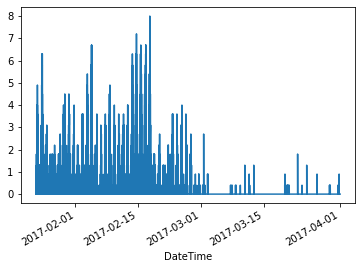

In [83]:
ff['Wind Speed'].plot()

In [84]:

ff.drop('Date' , axis = 1 , inplace = True)
ff.drop('Time' , axis = 1 , inplace = True)

In [85]:
ff.drop('Hi Dir' , axis = 1 , inplace = True)
ff.drop('Wind Dir' , axis = 1 , inplace = True)
ff.drop('Rain' , axis = 1 , inplace = True)
ff.drop('Rain Rate' , axis = 1 , inplace = True)
ff.drop('Solar Rad.' , axis = 1 , inplace = True)
ff.drop('Solar Energy' , axis = 1 , inplace = True)
ff.drop('HI Solar  Rad. ' , axis = 1 , inplace = True)
ff.drop('UV Index' , axis = 1 , inplace = True)
ff.drop('UV Dose' , axis = 1 , inplace = True)
ff.drop('Hi UV ' , axis = 1 , inplace = True)
ff.drop('Heat D-D ' , axis = 1 , inplace = True)
ff.drop('Wind Tx ' , axis = 1 , inplace = True)
ff.drop('Arc. Int.' , axis = 1 , inplace = True)
ff.drop('THSW Index' , axis=1 , inplace=True)

In [86]:
ff.dtypes

Temp Out          float64
Hi Temp           float64
Low Temp          float64
Out Hum             int64
Dew Pt.           float64
Wind Speed        float64
Wind Run          float64
Hi Speed          float64
Wind Chill        float64
Heat Index        float64
THW Index         float64
Bar               float64
Cool D-D          float64
In Temp           float64
In Hum              int64
In Dew            float64
In Heat           float64
In EMC            float64
In Air Density    float64
ET                float64
Wind Samp           int64
ISS Recept        float64
dtype: object

In [87]:
ff.isna().any()

Temp Out           True
Hi Temp            True
Low Temp           True
Out Hum           False
Dew Pt.            True
Wind Speed        False
Wind Run          False
Hi Speed          False
Wind Chill         True
Heat Index         True
THW Index          True
Bar               False
Cool D-D           True
In Temp           False
In Hum            False
In Dew            False
In Heat           False
In EMC            False
In Air Density    False
ET                False
Wind Samp         False
ISS Recept        False
dtype: bool

In [88]:
ff_res=ff.interpolate(method='time')

In [89]:
ff_res.head(1)

,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Run,Hi Speed,Wind Chill,Heat Index,...,Cool D-D,In Temp,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,ISS Recept
DateTime,,,,,,,,,,,,,,,,,,,,,
2017-01-23 05:01:00,71.1,71.1,71.1,86,66.7,0.0,0.0,0.0,71.1,73.0,...,0.004,86.5,49,65.1,88.9,8.85,1.1412,0.0,24,100.0


In [90]:
ff_res.isna().any()

Temp Out          False
Hi Temp           False
Low Temp          False
Out Hum           False
Dew Pt.           False
Wind Speed        False
Wind Run          False
Hi Speed          False
Wind Chill        False
Heat Index        False
THW Index         False
Bar               False
Cool D-D          False
In Temp           False
In Hum            False
In Dew            False
In Heat           False
In EMC            False
In Air Density    False
ET                False
Wind Samp         False
ISS Recept        False
dtype: bool

<AxesSubplot:xlabel='DateTime'>

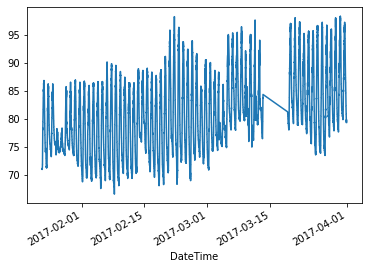

In [91]:
ff_res['Temp Out'].plot()

<AxesSubplot:xlabel='DateTime'>

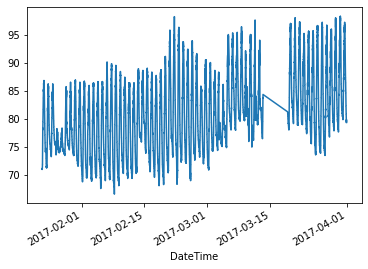

In [92]:
ff['Temp Out'].plot()

In [93]:
ff.head(1)

,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Run,Hi Speed,Wind Chill,Heat Index,...,Cool D-D,In Temp,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,ISS Recept
DateTime,,,,,,,,,,,,,,,,,,,,,
2017-01-23 05:01:00,71.1,71.1,71.1,86,66.7,0.0,0.0,0.0,71.1,73.0,...,0.004,86.5,49,65.1,88.9,8.85,1.1412,0.0,24,100.0


In [94]:
ff_res_targets = ff_res[target_names].shift(-shift_steps)

In [95]:
b_test = ff_res_targets[0:-shift_steps].values

In [96]:
a_test = ff_res.values

In [97]:
print("Min:", np.min(a_test))
print("Max:", np.max(a_test))

Min: 0.0
Max: 763.6


In [98]:
ff.dropna(axis = 0 , how = 'any' , inplace=True)

In [99]:
ff.isna().any()

Temp Out          False
Hi Temp           False
Low Temp          False
Out Hum           False
Dew Pt.           False
Wind Speed        False
Wind Run          False
Hi Speed          False
Wind Chill        False
Heat Index        False
THW Index         False
Bar               False
Cool D-D          False
In Temp           False
In Hum            False
In Dew            False
In Heat           False
In EMC            False
In Air Density    False
ET                False
Wind Samp         False
ISS Recept        False
dtype: bool

In [100]:
a_scaler = MinMaxScaler()

In [101]:
b_scaler = MinMaxScaler()

In [102]:
b_test_scaled = b_scaler.fit_transform(b_test)

In [103]:
a_test_scaled = a_scaler.fit_transform(a_test)

In [104]:
def plot_comparison(start_idx, length=100, train=True):
    
    if train:
        # Use training-data.
        x = x_train_scaled
        y_true = y_train
    else:
        # Use test-data.
        x = a_test_scaled
        y_true = b_test
    
    # End-index for the sequences.
    end_idx = start_idx + length
    
    # Select the sequences from the given start-index and
    # of the given length.
    x = x[start_idx:end_idx]
    y_true = y_true[start_idx:end_idx]
    
    # Input-signals for the model.
    x = np.expand_dims(x, axis=0)

    # Use the model to predict the output-signals.
    y_pred = model.predict(x)
    
    ''' The output of the model is between 0 and 1.
     Do an inverse map to get it back to the scale
     of the original data-set.'''
    y_pred_rescaled = y_scaler.inverse_transform(y_pred[0])
    
    for signal in range(len(target_names)):
        # Get the output-signal predicted by the model.
        signal_pred = y_pred_rescaled[:, signal]
    
        # Get the true output-signal from the data-set.
        signal_true = y_true[:, signal]

        # Make the plotting-canvas bigger.
        plt.figure(figsize=(15,5))
        
        # Plot and compare the two signals.
        plt.plot(signal_true, label='true')
        plt.plot(signal_pred, label='pred')
        
        # Plot grey box for warmup-period.
        p = plt.axvspan(0, warmup_steps, facecolor='black', alpha=0.15)
        
        plt.ylabel(target_names[signal])
        plt.legend()
        plt.show()

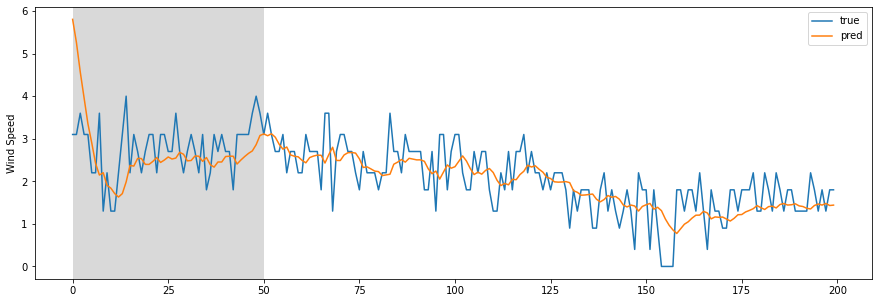

In [105]:
plot_comparison(start_idx=4000, length=200, train=True)

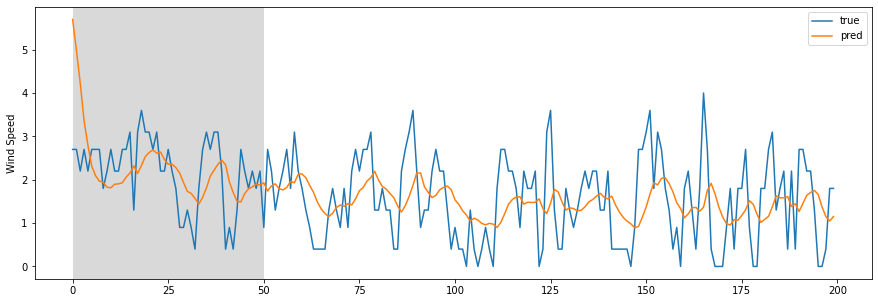

In [106]:
plot_comparison(start_idx=80000, length=200, train=True)


<AxesSubplot:xlabel='DateTime'>

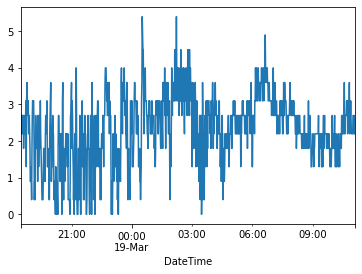

In [107]:
df['Wind Speed'][80000:80000+1000].plot()

<AxesSubplot:xlabel='DateTime'>

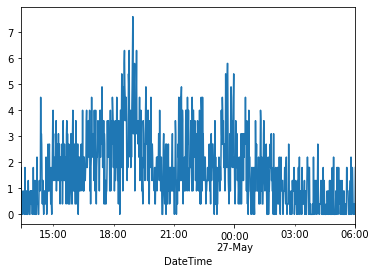

In [108]:
df['Wind Speed'][98994+80000 : 98994 + 80000 + 1000].plot()

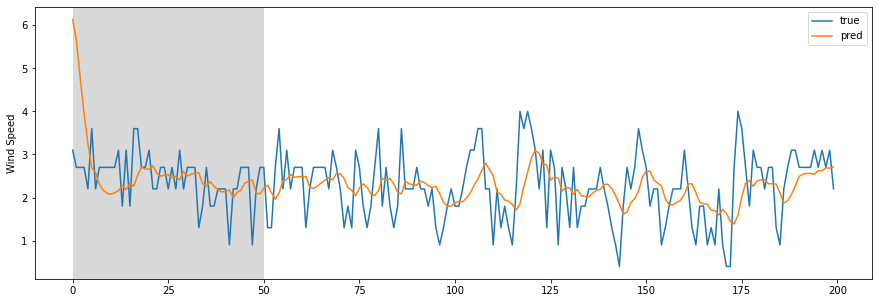

In [109]:
plot_comparison(start_idx=800, length=200, train=True)

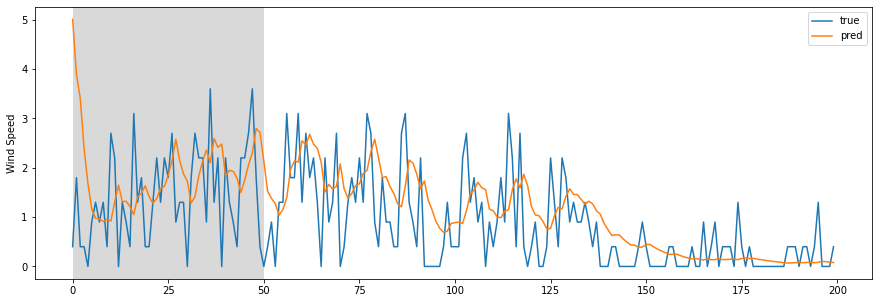

In [115]:
plot_comparison(start_idx=15000, length=200, train=False)